In [1]:
# import packages 
import numpy as np
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os
from scipy.interpolate import interp1d
%matplotlib inline

# define your own folder paths and names
project_path = os.getcwd()
input_folder = os.path.join(project_path,'pv_data')
output_folder = os.path.join(project_path,'pv_data')

# file path
pv_data_raw_path = os.path.join(input_folder,'pv_output.csv')

# Operating parameter
start_date = datetime.datetime(2017,1,1)
end_date = datetime.datetime(2019,12,31)

## 1. Read raw data from excel file

In [3]:
# load raw data
pv_data_raw_df = pd.read_csv(pv_data_raw_path)

# modify the time format to datetime
pv_data_df = pd.DataFrame()
pv_data_df["Time"] = pv_data_raw_df["Date"].apply(lambda x: datetime.datetime.strptime(x,"%Y-%m-%dT%H:%M:%S"))
pv_data_df["PV_output_kw"] = pv_data_raw_df["Huang_E4102_kW"]

# select sample from starting time
pv_data_df = pv_data_df[(pv_data_df['Time']>=start_date) & (pv_data_df['Time']<=end_date)]

# reset index to starting from 0 and drop the old index
pv_data_df.reset_index(drop=True, inplace=True)
pv_data_df = pv_data_df.set_index('Time')

In [4]:
pv_data_df

,PV_output_kw
Time,
2017-01-01 00:00:00,-0.084945
2017-01-01 00:01:00,-0.084945
2017-01-01 00:02:00,-0.084945
2017-01-01 00:03:00,-0.084945
2017-01-01 00:04:00,-0.084945
...,...
2019-10-27 08:56:00,5.983374
2019-10-27 08:57:00,6.125702
2019-10-27 08:58:00,6.291990


## 2. PV data interpolation

In [5]:
def interpaverage(record_times,record_outputs):
    # Generate interpolation function with interp1d
    start_time_dt = record_times[0]
    start_time_str = datetime.datetime.strftime(start_time_dt,"%Y-%m-%dT%H:%M:%S")
    record_times = record_times.astype('datetime64[s]')
    record_times_elapsed = (record_times - np.datetime64(start_time_str)).astype('int')
    f = interp1d(record_times_elapsed, record_outputs)

    # Interpolating to every 1 seconds 
    int_times_elapsed = np.arange(0, record_times_elapsed[-1], 1)
    int_outputs = f(int_times_elapsed)
    int_datetimes = start_time_dt+int_times_elapsed*datetime.timedelta(seconds=1)
    
    # Store the interpolated RAW data into a pd series
    pv_output_raw_int = pd.Series(int_outputs, index = int_datetimes) 

    # Store to hard drive
    pv_output_10s_int = pv_output_raw_int.resample('10S').first()

    # Assert all index is 10s*N
    assert np.sum((pv_output_10s_int.index.second % 10).values) == 0
    
    return pv_output_10s_int

In [6]:
record_times = np.asarray([time.to_pydatetime() for time in pv_data_df.index])
record_outputs = pv_data_df['PV_output_kw'].values

print("record_times.shape: ", record_times.shape)
print("record_outputs.shape: ", record_outputs.shape)

record_times.shape:  (1482241,)
record_outputs.shape:  (1482241,)


In [7]:
record_times

array([datetime.datetime(2017, 1, 1, 0, 0),
       datetime.datetime(2017, 1, 1, 0, 1),
       datetime.datetime(2017, 1, 1, 0, 2), ...,
       datetime.datetime(2019, 10, 27, 8, 58),
       datetime.datetime(2019, 10, 27, 8, 59),
       datetime.datetime(2019, 10, 27, 9, 0)], dtype=object)

In [8]:
record_outputs

array([-0.08494503, -0.08494503, -0.08494503, ...,  6.2919903 ,
        6.38645795,  6.52732201])

In [9]:
pv_output_10s_int = interpaverage(record_times,record_outputs)
pv_output_10s_int

2017-01-01 00:00:00   -0.084945
2017-01-01 00:00:10   -0.084945
2017-01-01 00:00:20   -0.084945
2017-01-01 00:00:30   -0.084945
2017-01-01 00:00:40   -0.084945
                         ...   
2019-10-27 08:59:10    6.409935
2019-10-27 08:59:20    6.433413
2019-10-27 08:59:30    6.456890
2019-10-27 08:59:40    6.480367
2019-10-27 08:59:50    6.503845
Freq: 10S, Length: 8893800, dtype: float64

## 3. Plot PV profile for everyday: Visual inspection of invalid days 

plotting for date 20170101


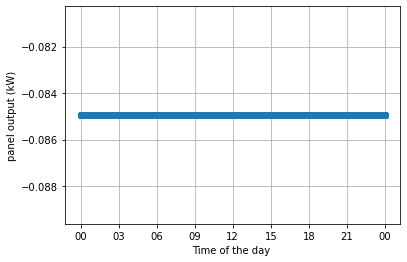

plotting for date 20170102


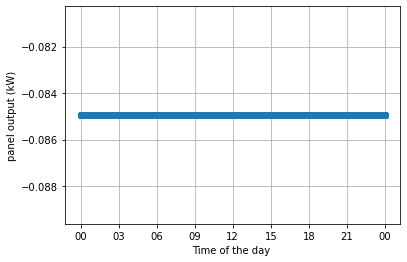

plotting for date 20170103


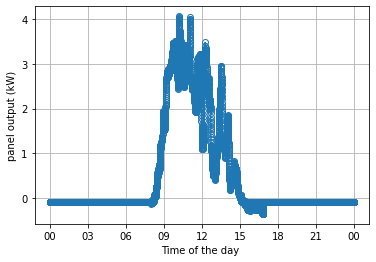

plotting for date 20170104


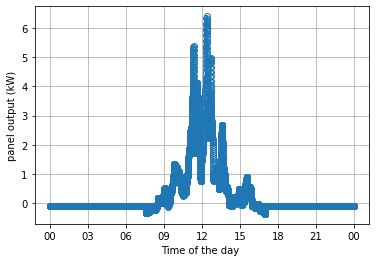

plotting for date 20170105


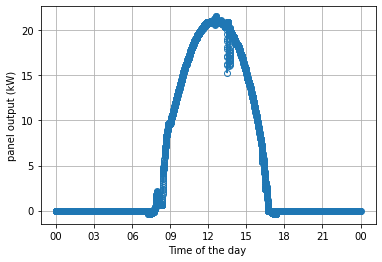

plotting for date 20170106


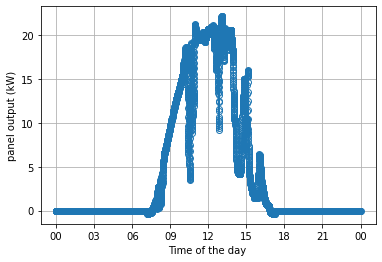

plotting for date 20170107


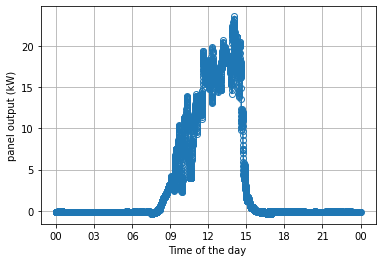

plotting for date 20170108


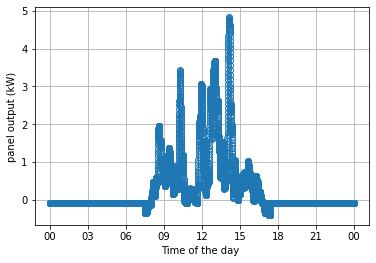

plotting for date 20170109


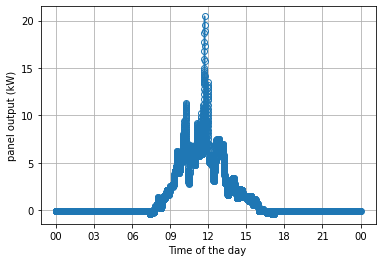

plotting for date 20170110


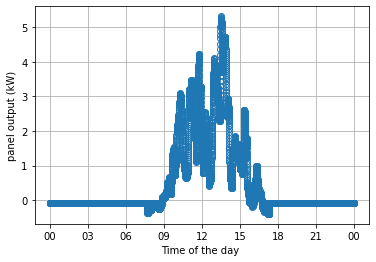

plotting for date 20170111


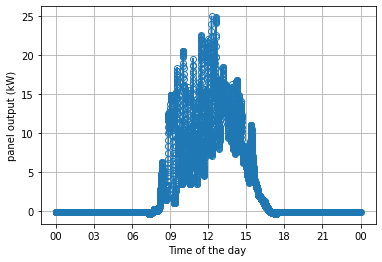

plotting for date 20170112


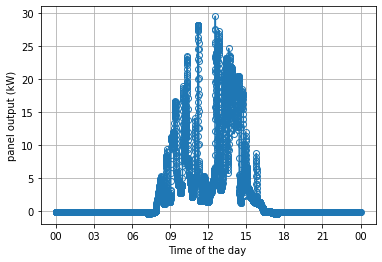

plotting for date 20170113


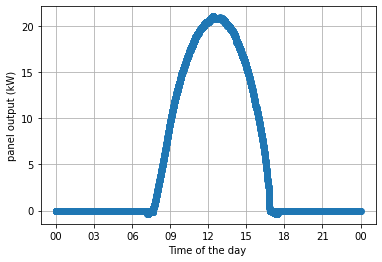

plotting for date 20170114


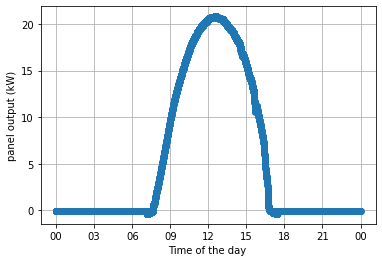

plotting for date 20170115


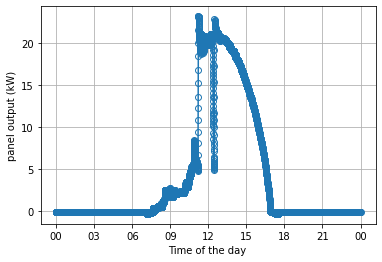

plotting for date 20170116


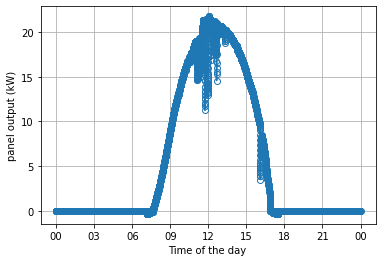

plotting for date 20170117


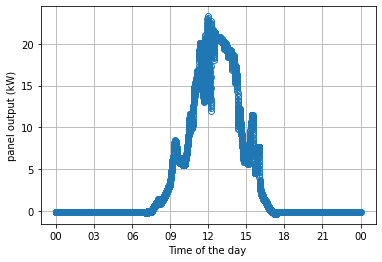

plotting for date 20170118


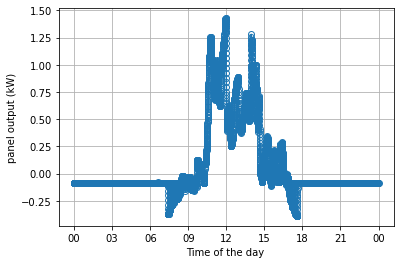

plotting for date 20170119


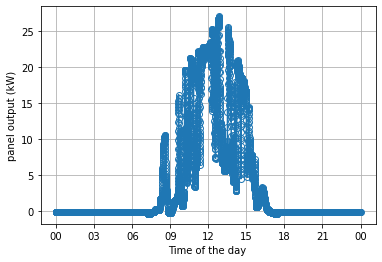

plotting for date 20170120


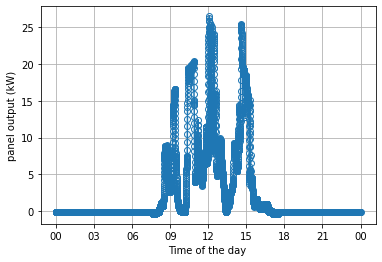

plotting for date 20170121


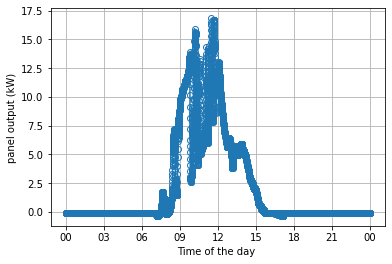

plotting for date 20170122


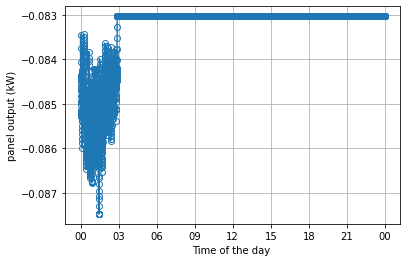

plotting for date 20170123


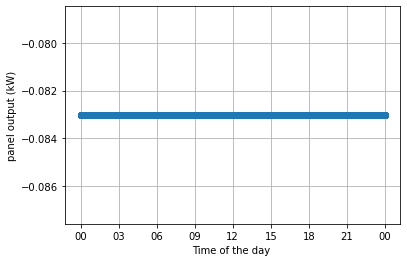

plotting for date 20170124


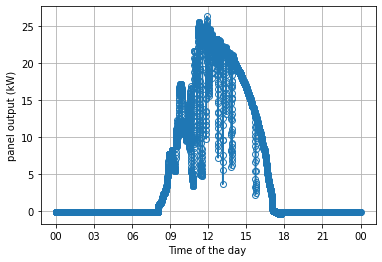

plotting for date 20170125


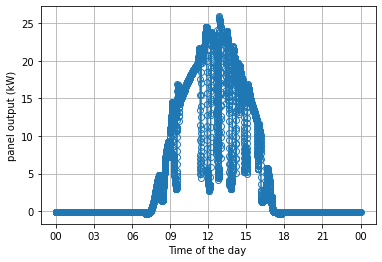

plotting for date 20170126


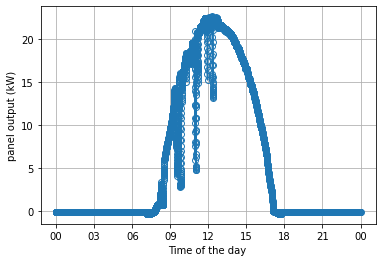

plotting for date 20170127


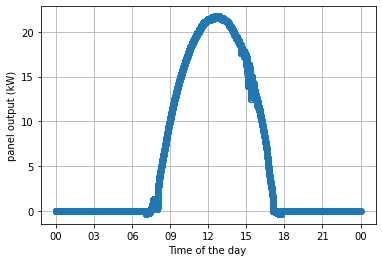

plotting for date 20170128


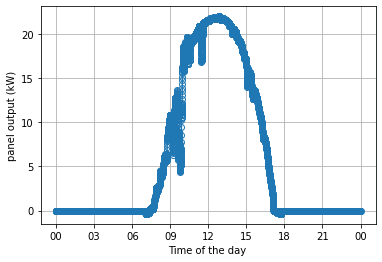

plotting for date 20170129


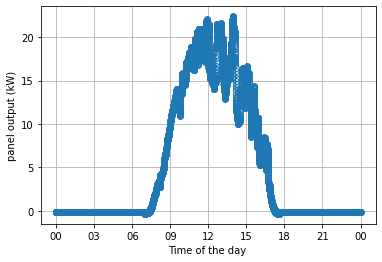

plotting for date 20170130


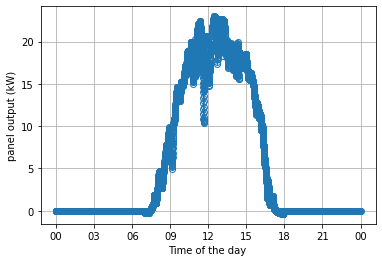

plotting for date 20170131


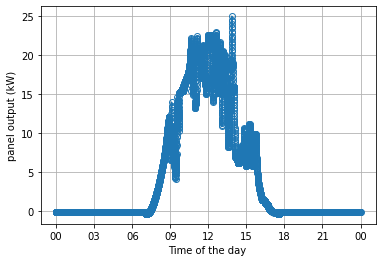

plotting for date 20170201


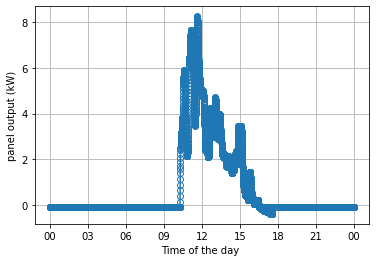

plotting for date 20170202


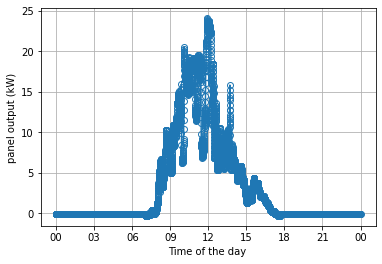

plotting for date 20170203


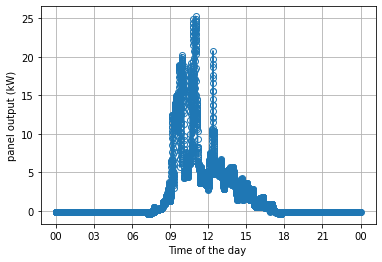

plotting for date 20170204


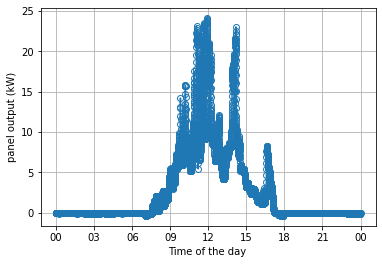

plotting for date 20170205


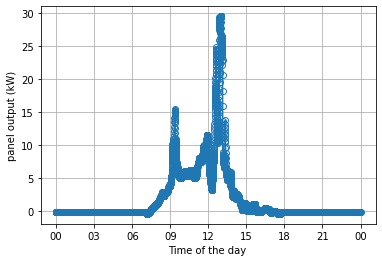

plotting for date 20170206


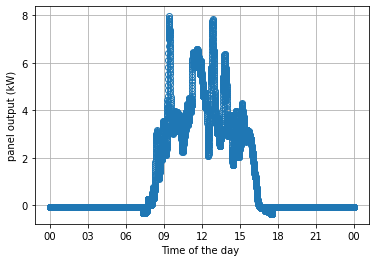

plotting for date 20170207


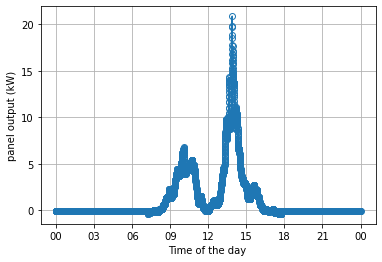

plotting for date 20170208


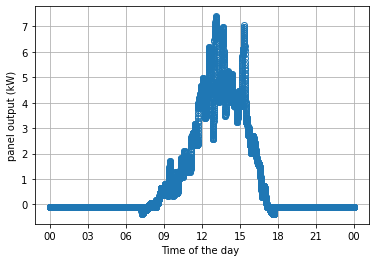

plotting for date 20170209


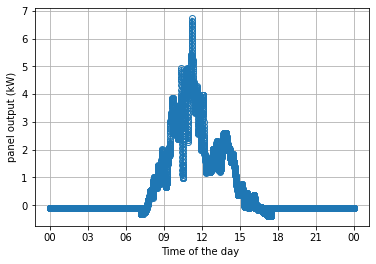

plotting for date 20170210


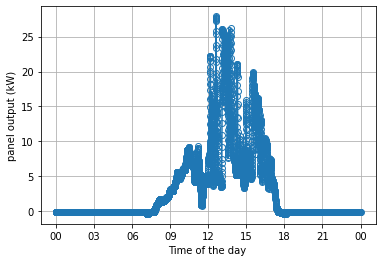

plotting for date 20170211


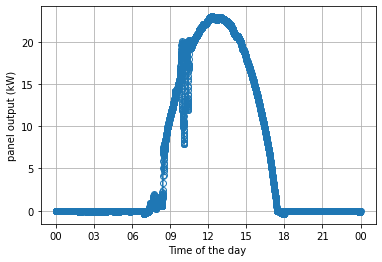

plotting for date 20170212


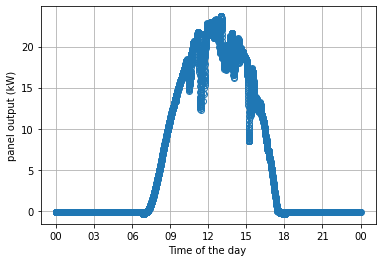

plotting for date 20170213


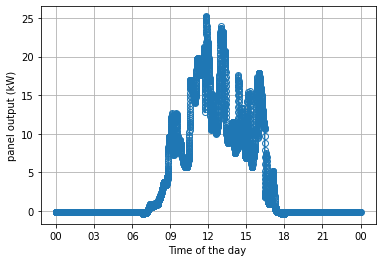

plotting for date 20170214


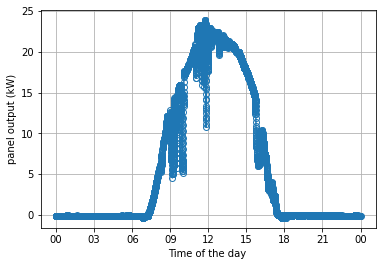

plotting for date 20170215


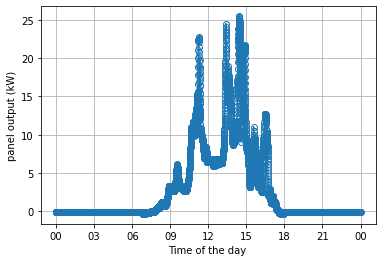

plotting for date 20170216


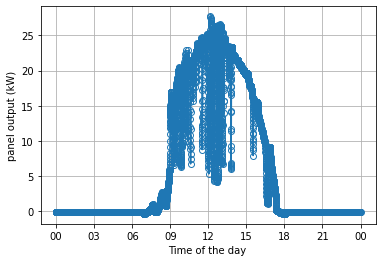

plotting for date 20170217


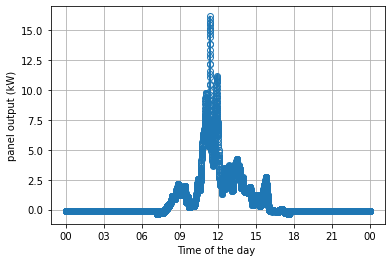

plotting for date 20170218


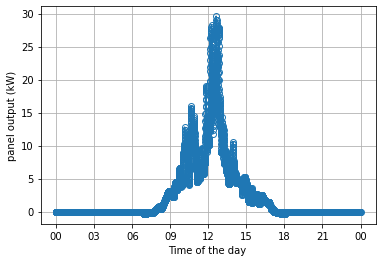

plotting for date 20170219


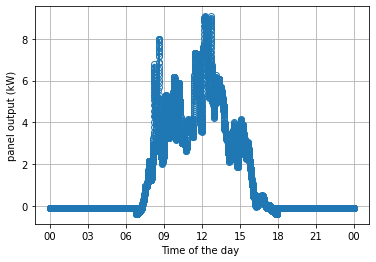

plotting for date 20170220


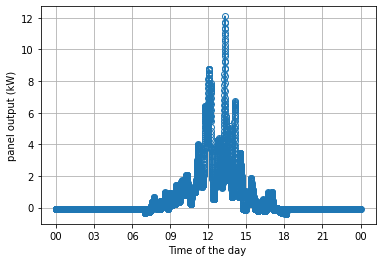

plotting for date 20170221


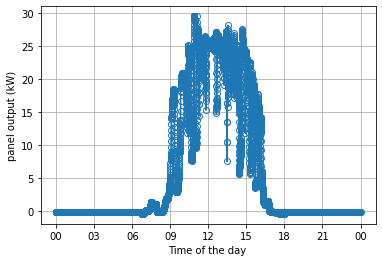

plotting for date 20170222


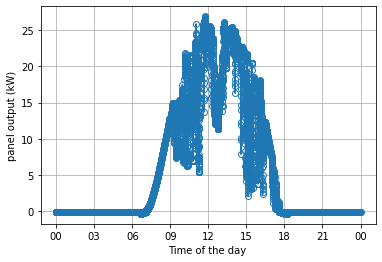

plotting for date 20170223


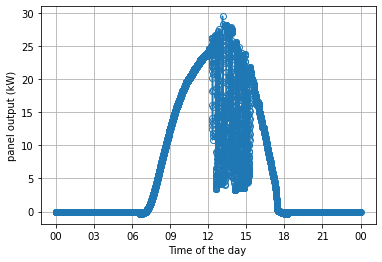

plotting for date 20170224


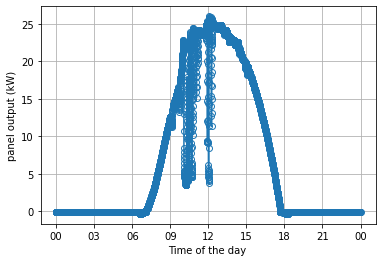

plotting for date 20170225


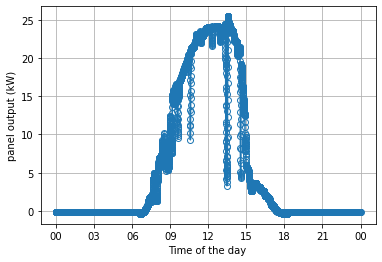

plotting for date 20170226


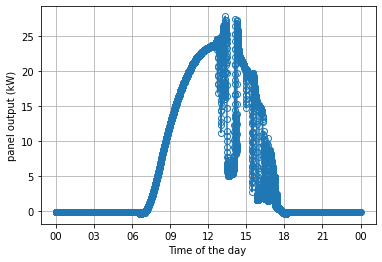

plotting for date 20170227


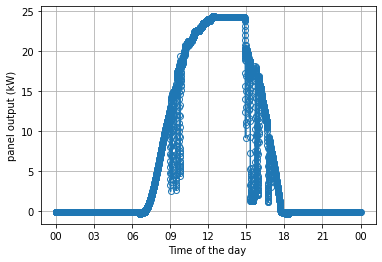

plotting for date 20170228


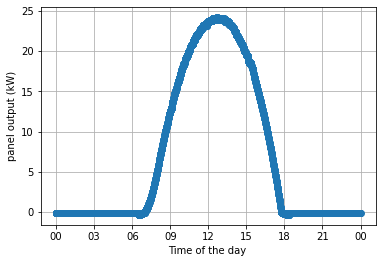

plotting for date 20170301


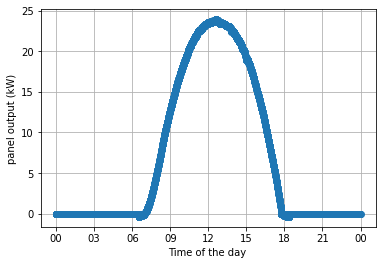

plotting for date 20170302


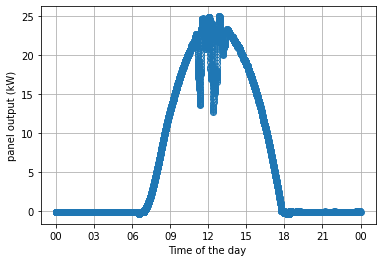

plotting for date 20170303


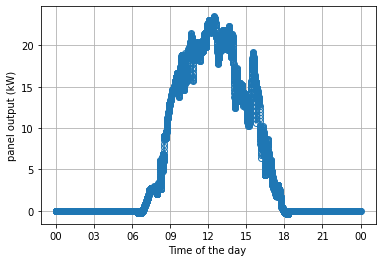

plotting for date 20170304


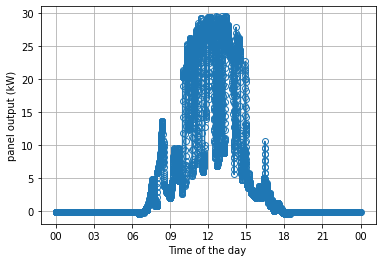

plotting for date 20170305


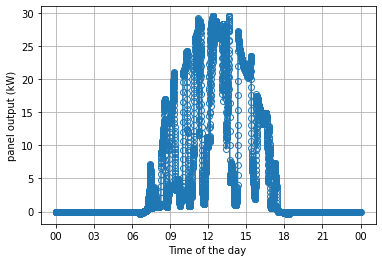

plotting for date 20170306


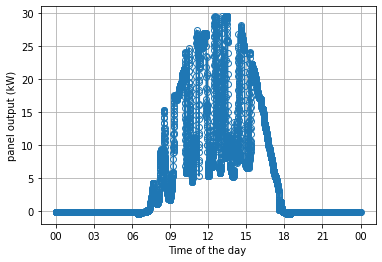

plotting for date 20170307


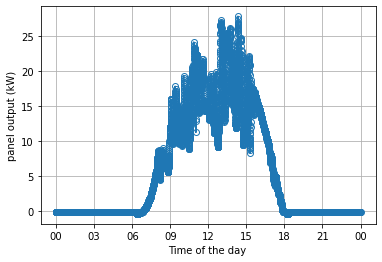

plotting for date 20170308


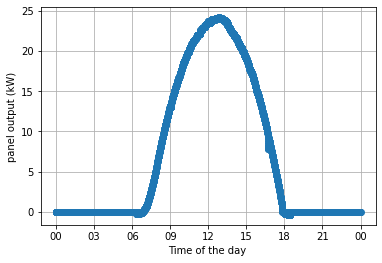

plotting for date 20170309


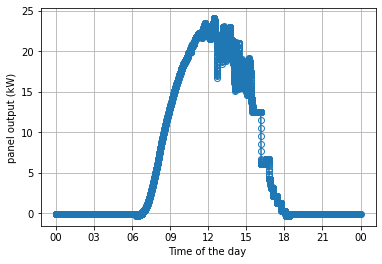

plotting for date 20170310


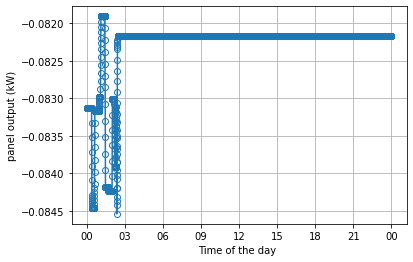

plotting for date 20170311


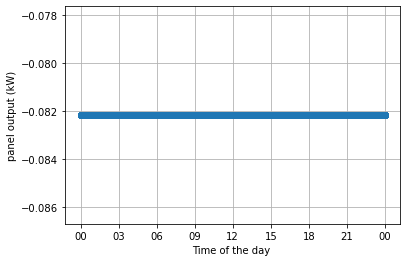

plotting for date 20170312


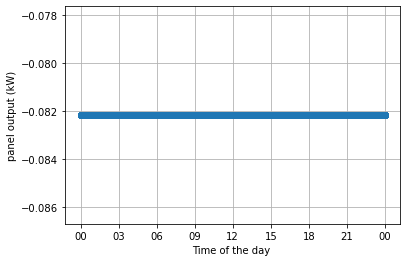

plotting for date 20170313


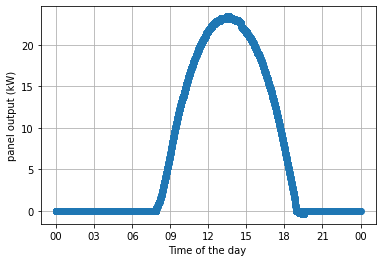

plotting for date 20170314


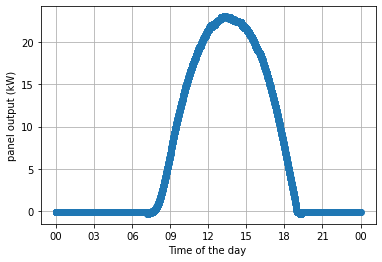

plotting for date 20170315


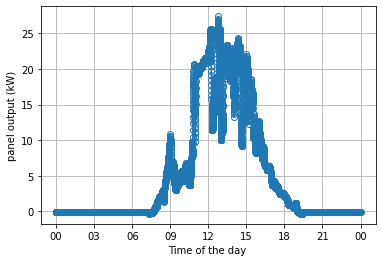

plotting for date 20170316


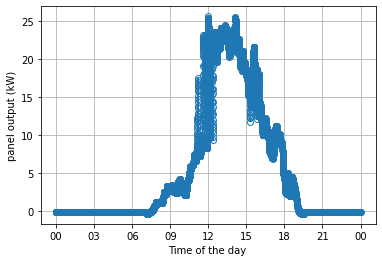

plotting for date 20170317


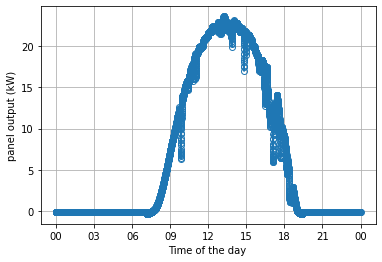

plotting for date 20170318


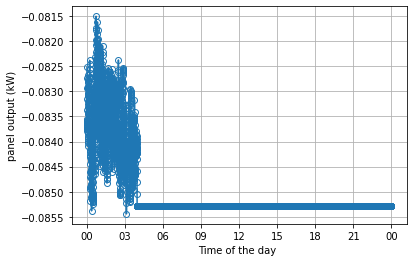

plotting for date 20170319


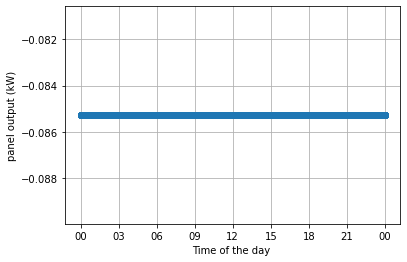

plotting for date 20170320


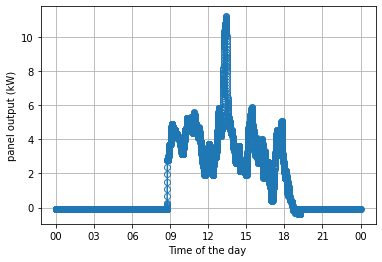

plotting for date 20170321


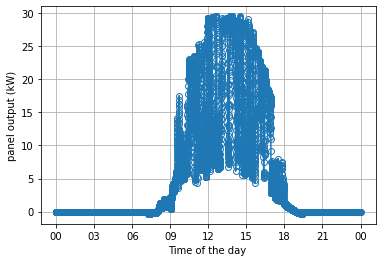

plotting for date 20170322


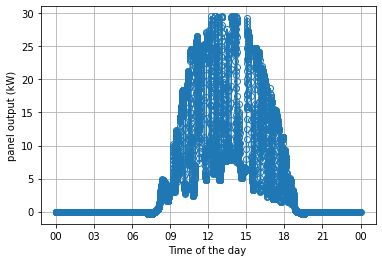

plotting for date 20170323


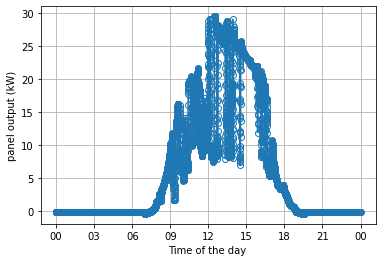

plotting for date 20170324


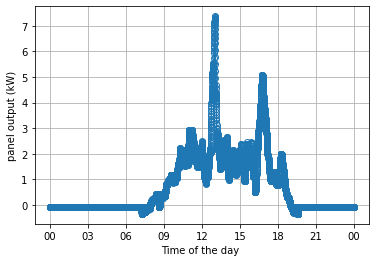

plotting for date 20170325


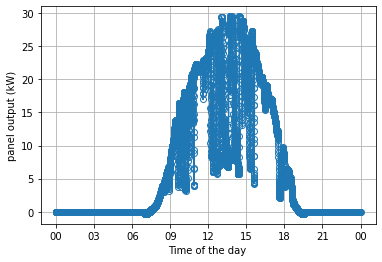

plotting for date 20170326


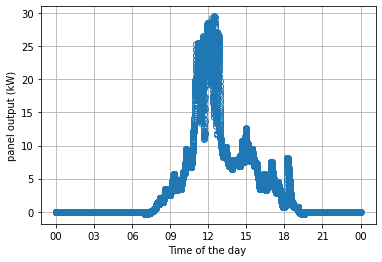

plotting for date 20170327


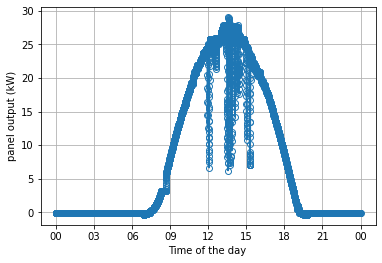

plotting for date 20170328


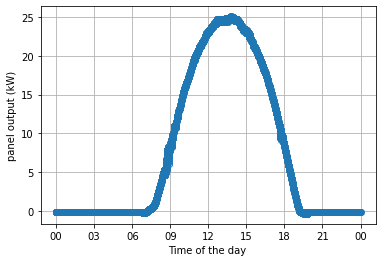

plotting for date 20170329


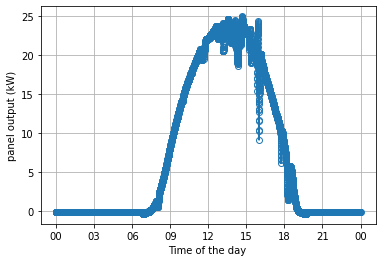

plotting for date 20170330


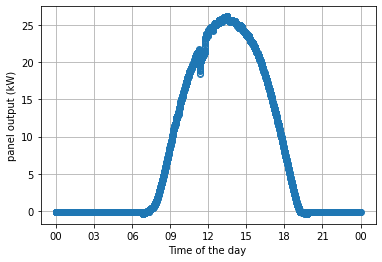

plotting for date 20170331


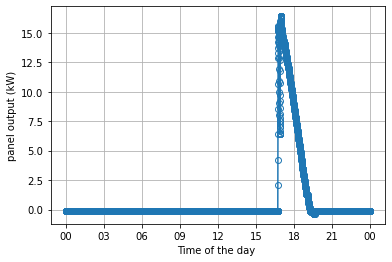

plotting for date 20170401


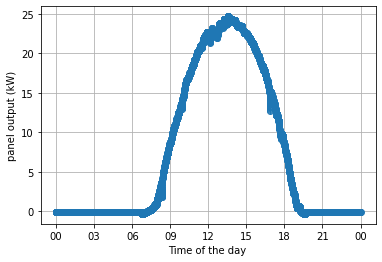

plotting for date 20170402


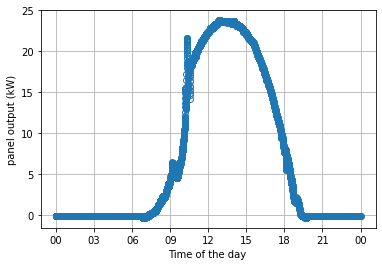

plotting for date 20170403


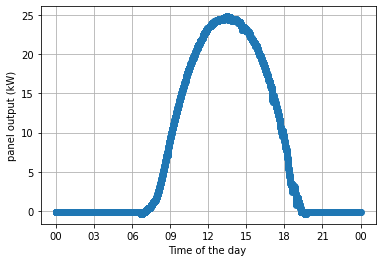

plotting for date 20170404


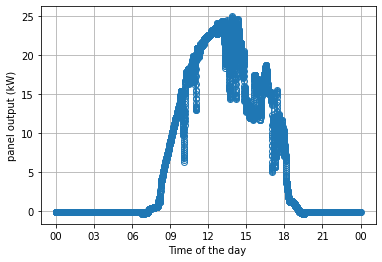

plotting for date 20170405


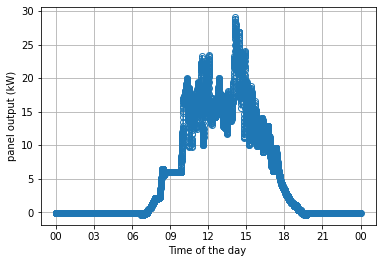

plotting for date 20170406


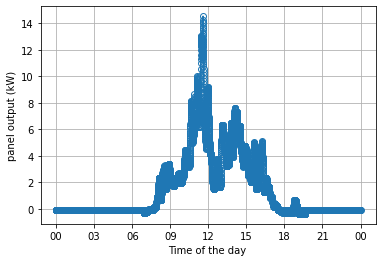

plotting for date 20170407


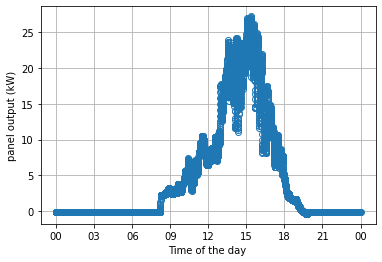

plotting for date 20170408


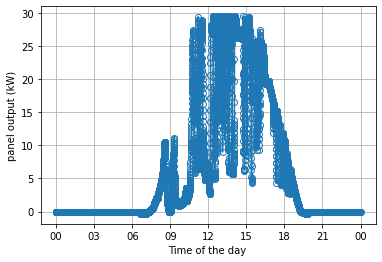

plotting for date 20170409


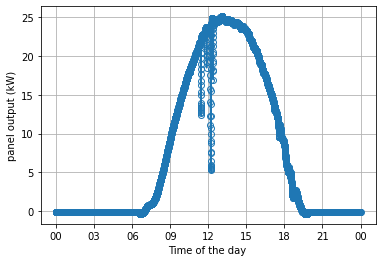

plotting for date 20170410


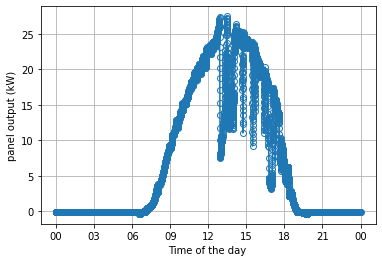

plotting for date 20170411


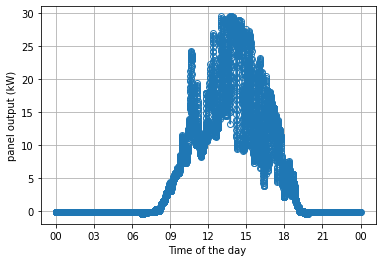

plotting for date 20170412


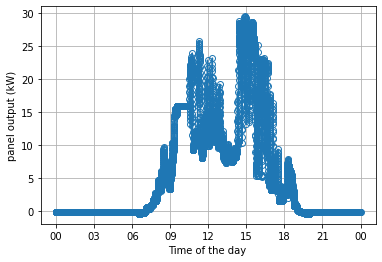

plotting for date 20170413


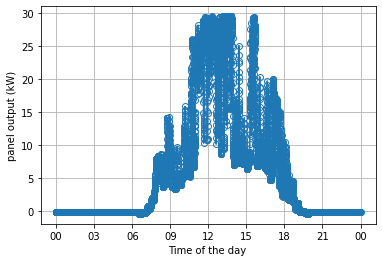

plotting for date 20170414


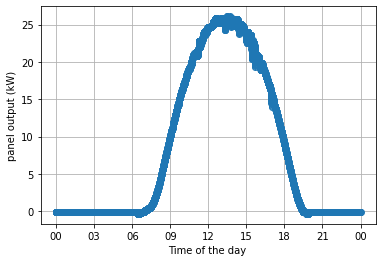

plotting for date 20170415


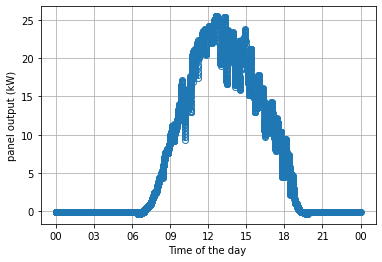

plotting for date 20170416


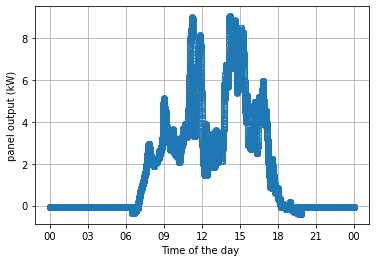

plotting for date 20170417


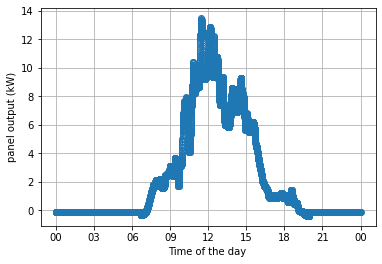

plotting for date 20170418


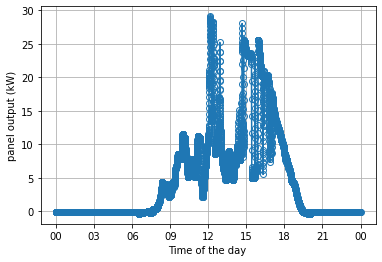

plotting for date 20170419


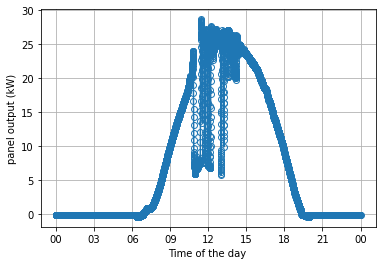

plotting for date 20170420


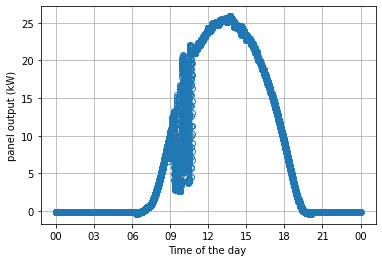

plotting for date 20170421


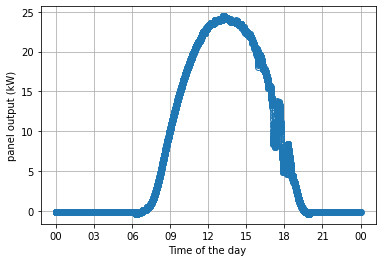

plotting for date 20170422


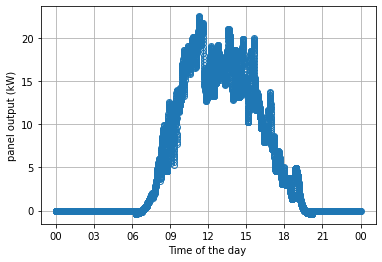

plotting for date 20170423


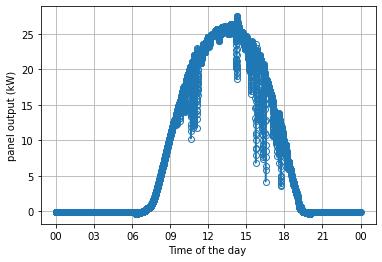

plotting for date 20170424


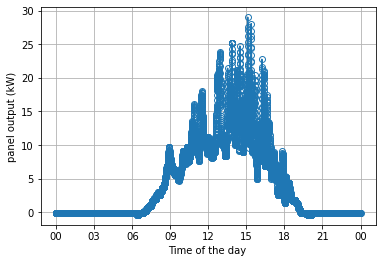

plotting for date 20170425


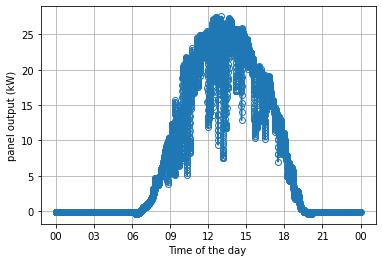

plotting for date 20170426


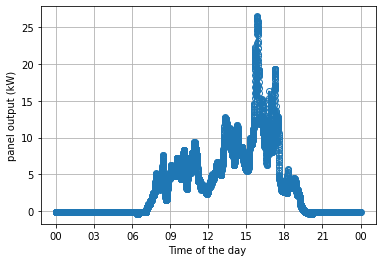

plotting for date 20170427


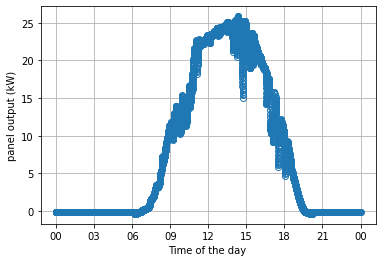

plotting for date 20170428


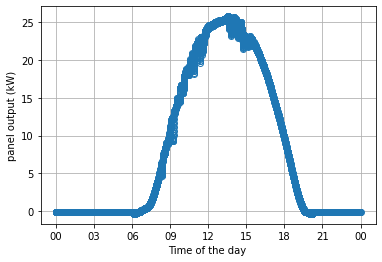

plotting for date 20170429


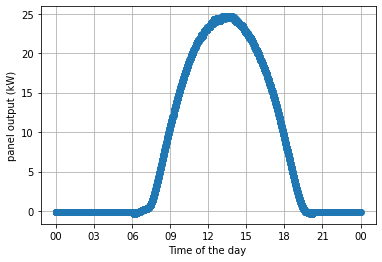

plotting for date 20170430


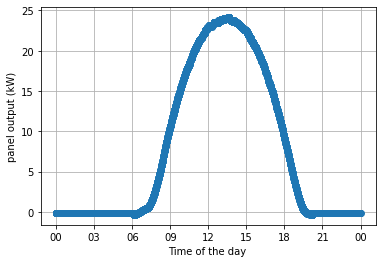

plotting for date 20170501


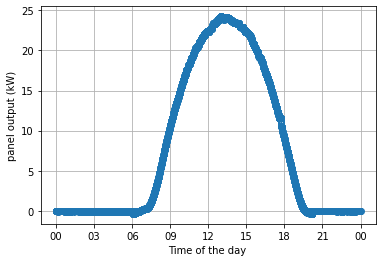

plotting for date 20170502


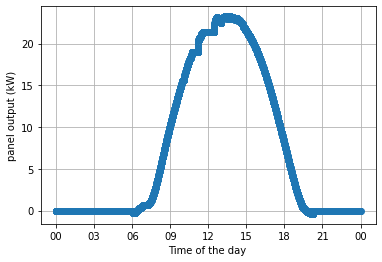

plotting for date 20170503


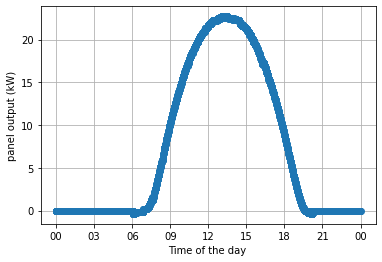

plotting for date 20170504


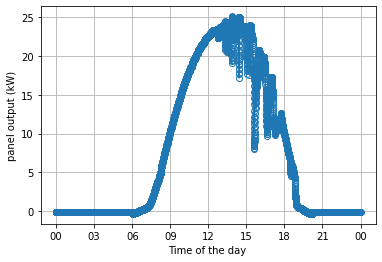

plotting for date 20170505


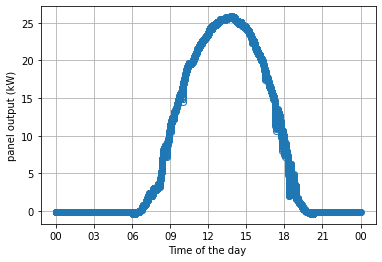

plotting for date 20170506


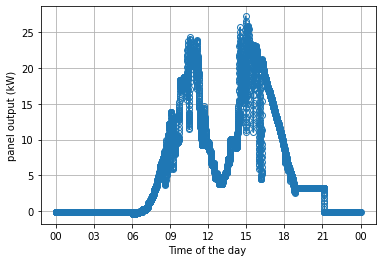

plotting for date 20170507


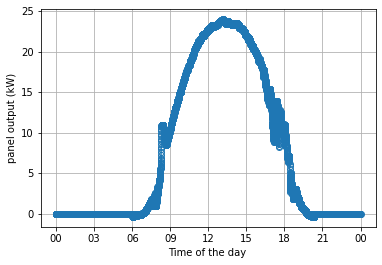

plotting for date 20170508


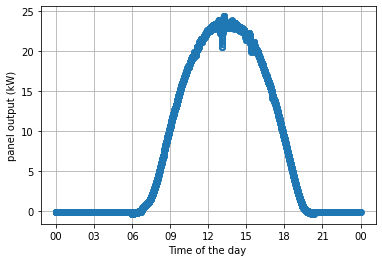

plotting for date 20170509


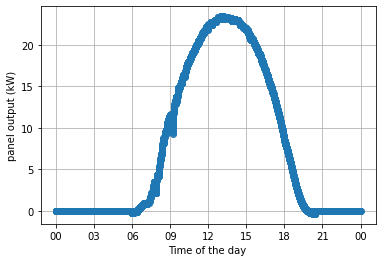

plotting for date 20170510


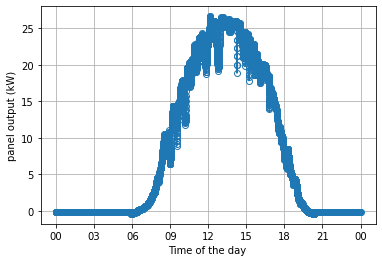

plotting for date 20170511


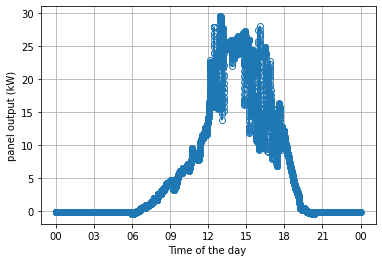

plotting for date 20170512


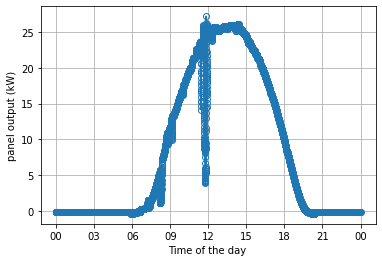

plotting for date 20170513


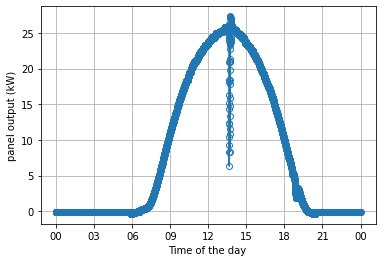

plotting for date 20170514


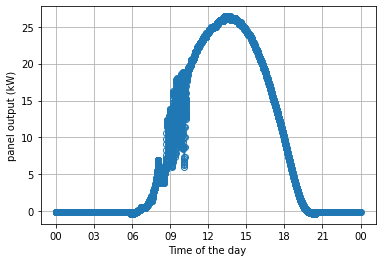

plotting for date 20170515


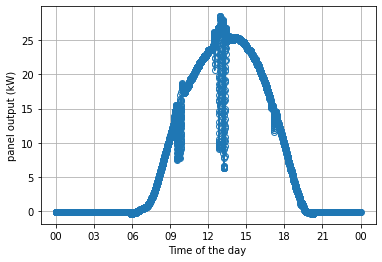

plotting for date 20170516


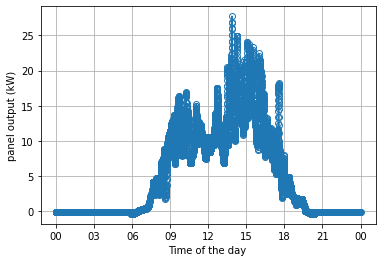

plotting for date 20170517


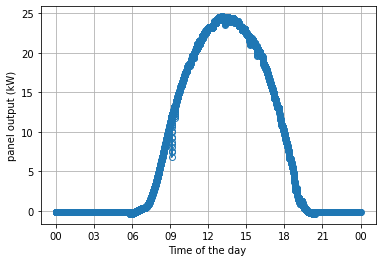

plotting for date 20170518


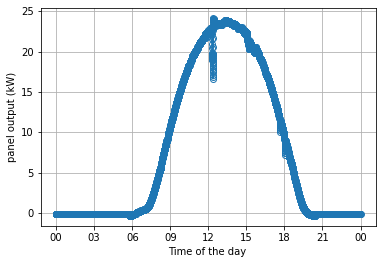

plotting for date 20170519


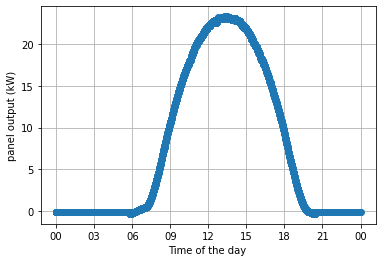

plotting for date 20170520


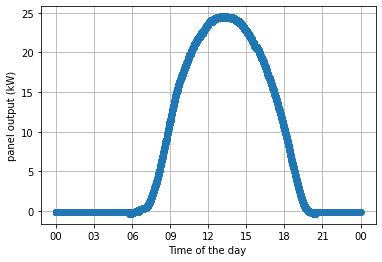

plotting for date 20170521


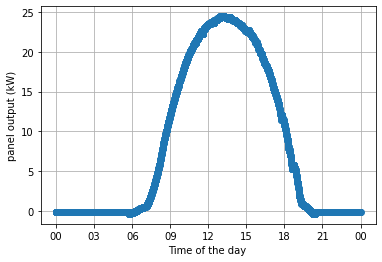

plotting for date 20170522


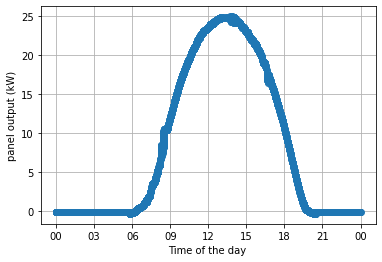

plotting for date 20170523


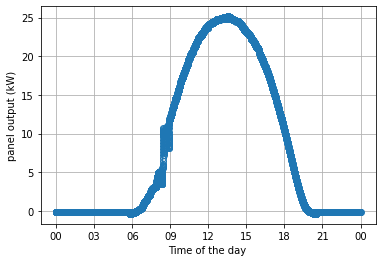

plotting for date 20170524


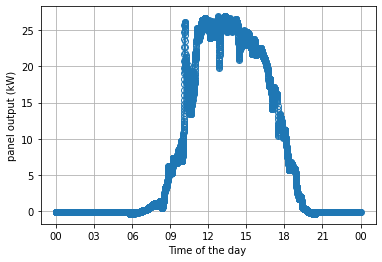

plotting for date 20170525


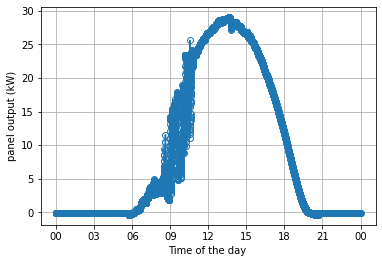

plotting for date 20170526


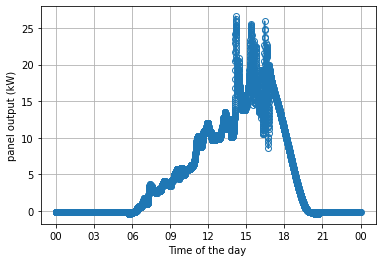

plotting for date 20170527


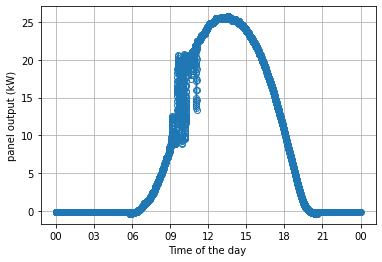

plotting for date 20170528


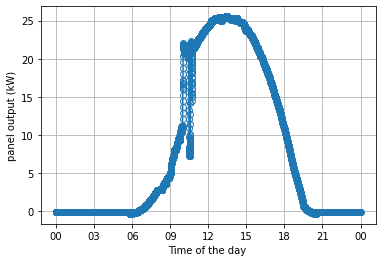

plotting for date 20170529


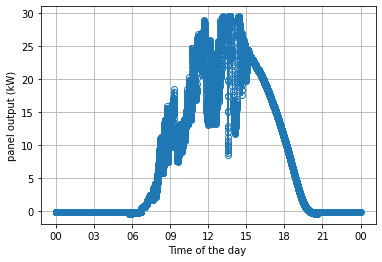

plotting for date 20170530


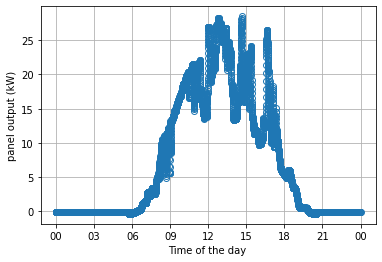

plotting for date 20170531


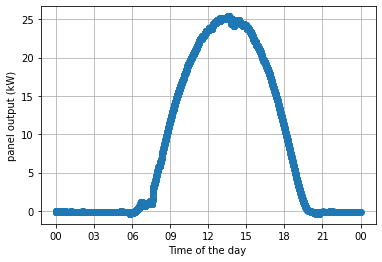

plotting for date 20170601


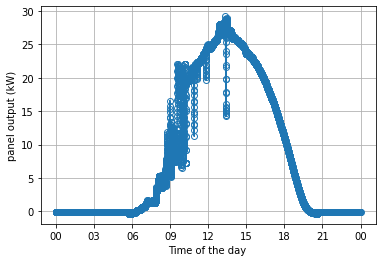

plotting for date 20170602


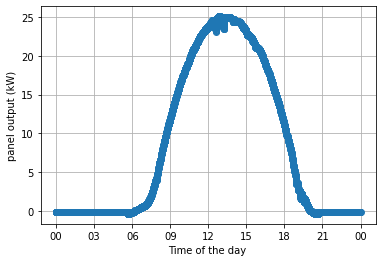

plotting for date 20170603


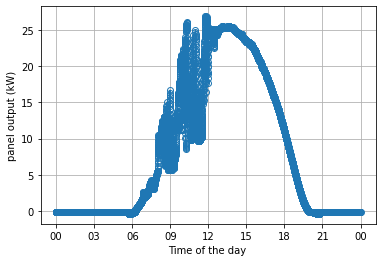

plotting for date 20170604


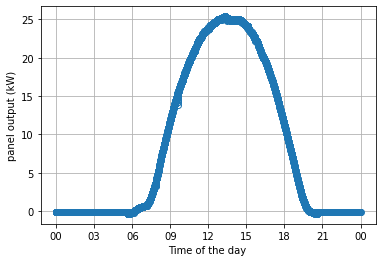

plotting for date 20170605


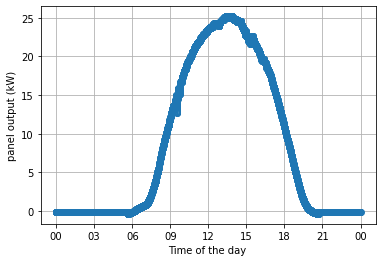

plotting for date 20170606


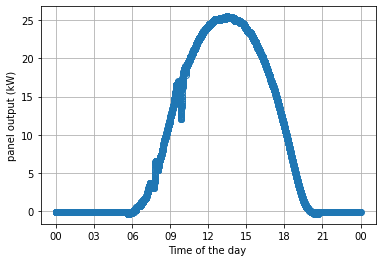

plotting for date 20170607


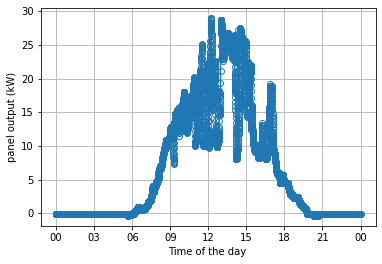

plotting for date 20170608


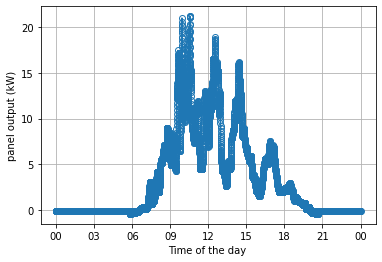

plotting for date 20170609


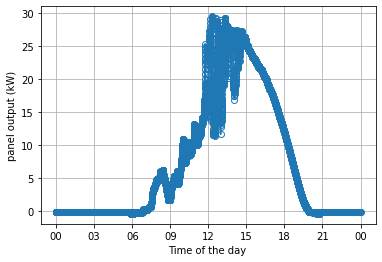

plotting for date 20170610


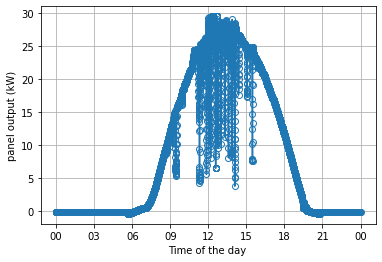

plotting for date 20170611


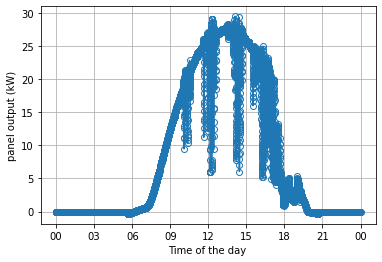

plotting for date 20170612


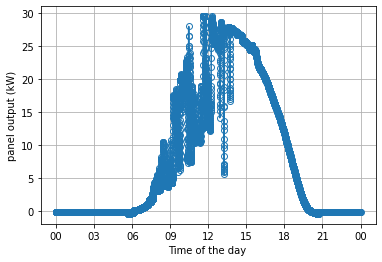

plotting for date 20170613


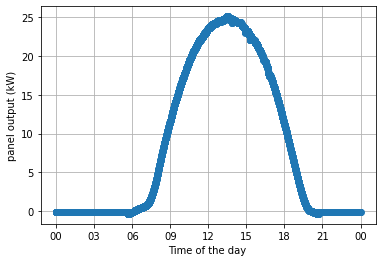

plotting for date 20170614


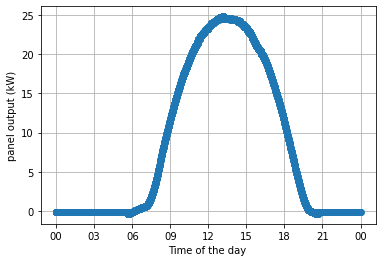

plotting for date 20170615


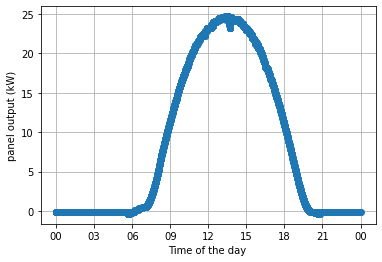

plotting for date 20170616


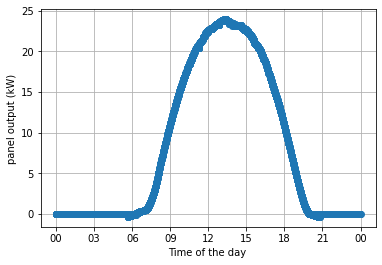

plotting for date 20170617


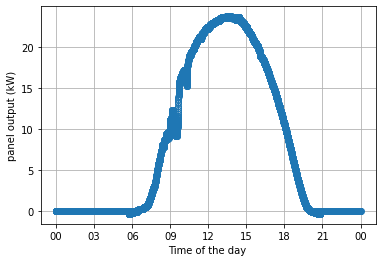

plotting for date 20170618


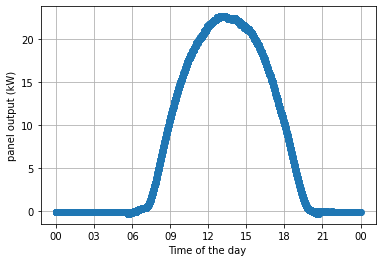

plotting for date 20170619


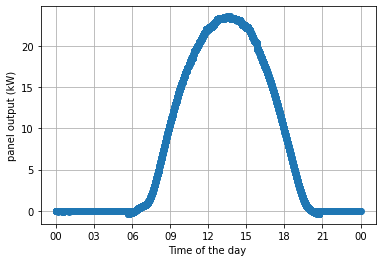

plotting for date 20170620


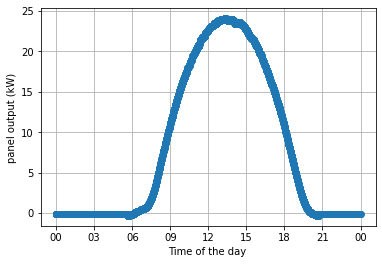

plotting for date 20170621


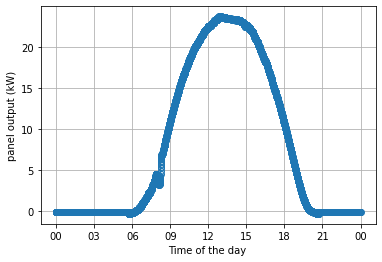

plotting for date 20170622


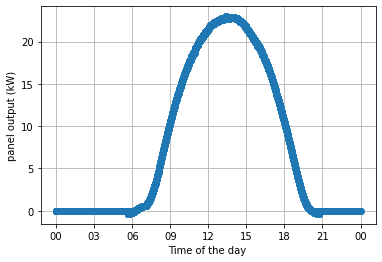

plotting for date 20170623


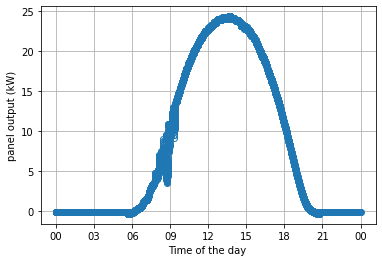

plotting for date 20170624


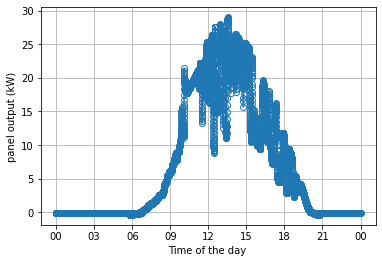

plotting for date 20170625


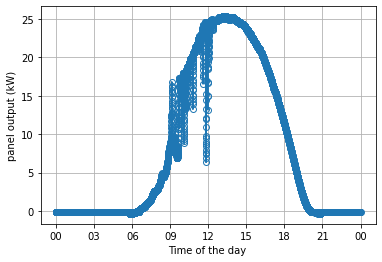

plotting for date 20170626


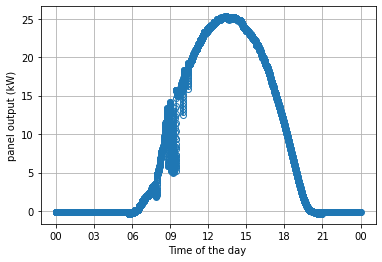

plotting for date 20170627


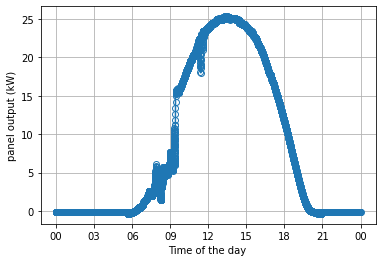

plotting for date 20170628


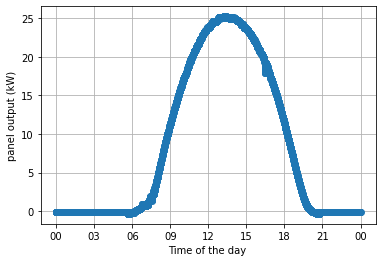

plotting for date 20170629


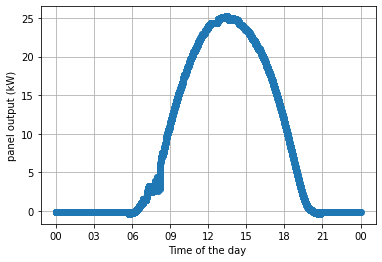

plotting for date 20170630


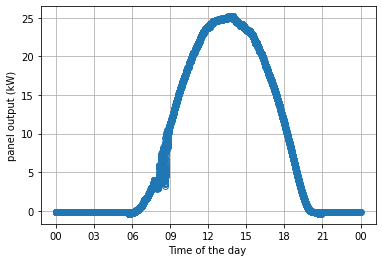

plotting for date 20170701


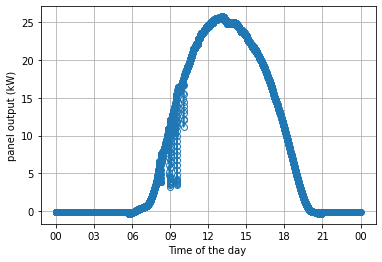

plotting for date 20170702


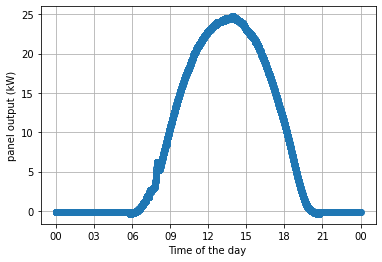

plotting for date 20170703


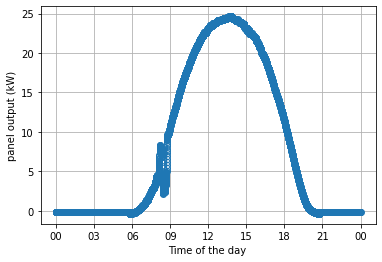

plotting for date 20170704


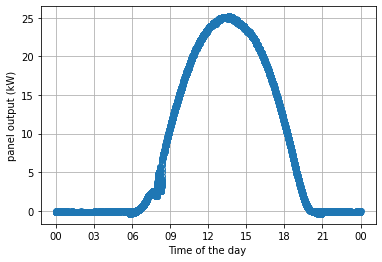

plotting for date 20170705


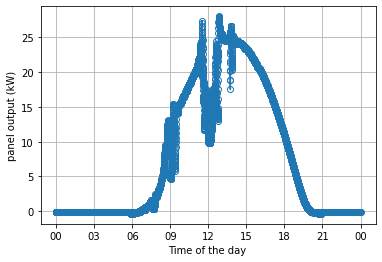

plotting for date 20170706


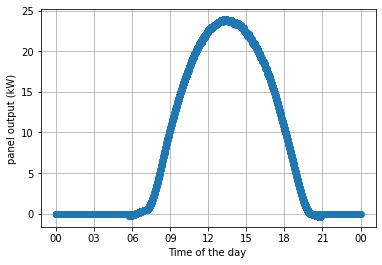

plotting for date 20170707


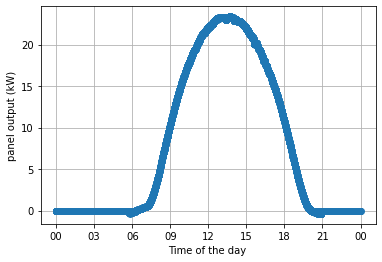

plotting for date 20170708


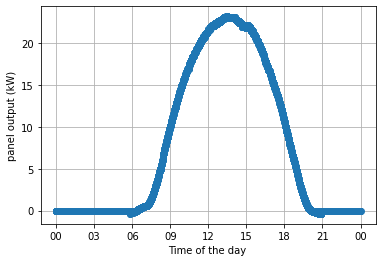

plotting for date 20170709


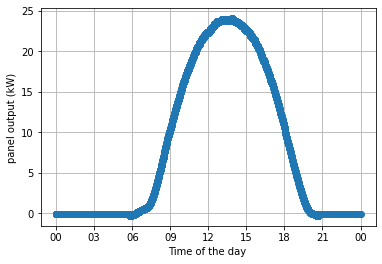

plotting for date 20170710


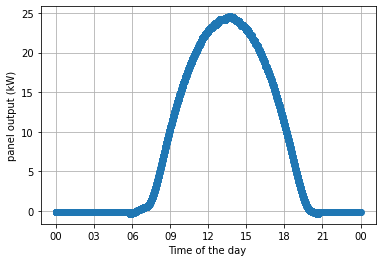

plotting for date 20170711


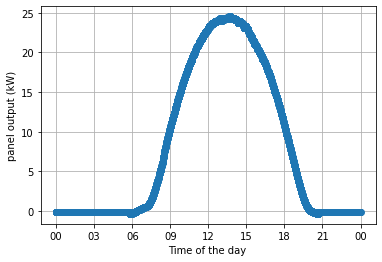

plotting for date 20170712


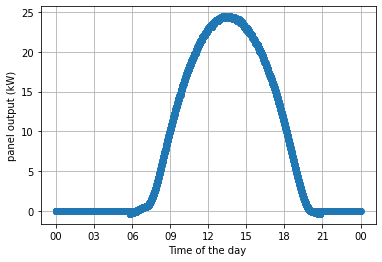

plotting for date 20170713


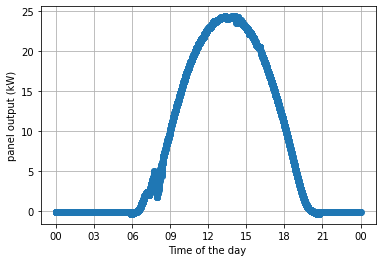

plotting for date 20170714


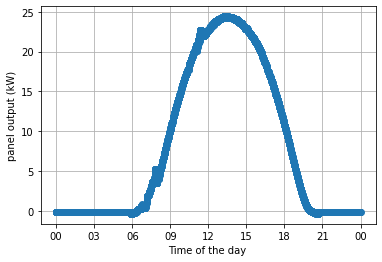

plotting for date 20170715


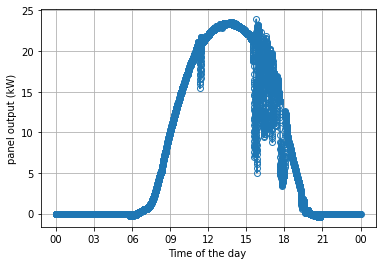

plotting for date 20170716


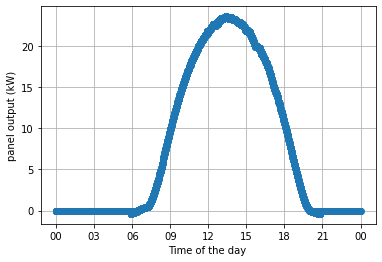

plotting for date 20170717


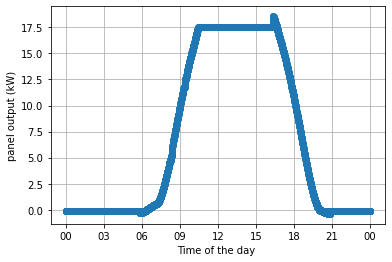

plotting for date 20170718


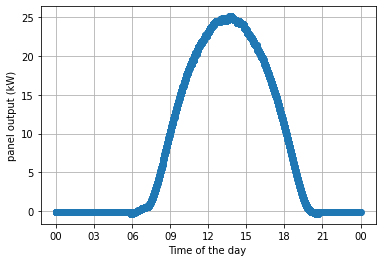

plotting for date 20170719


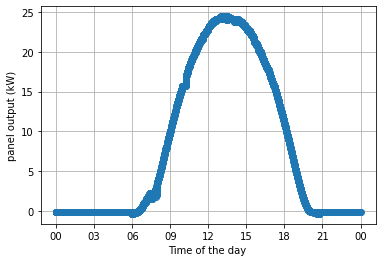

plotting for date 20170720


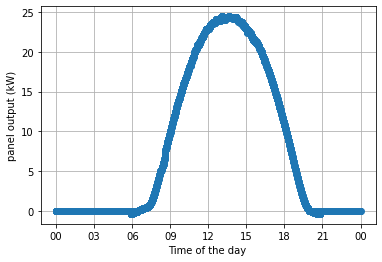

plotting for date 20170721


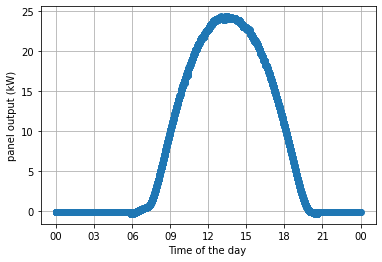

plotting for date 20170722


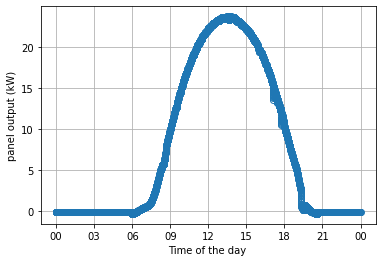

plotting for date 20170723


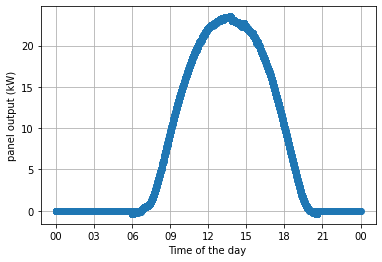

plotting for date 20170724


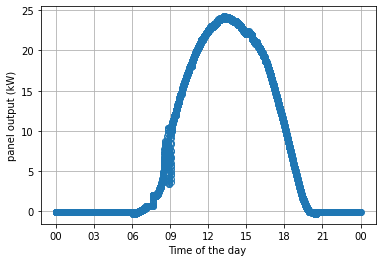

plotting for date 20170725


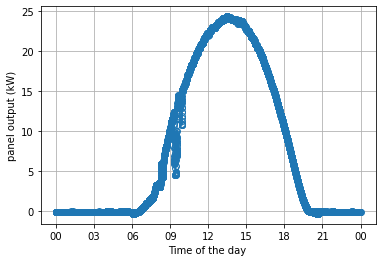

plotting for date 20170726


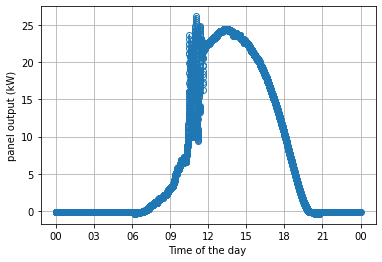

plotting for date 20170727


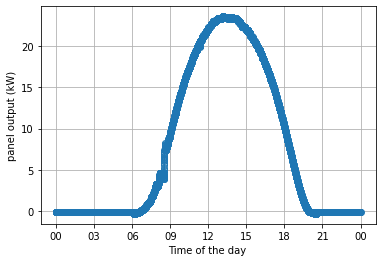

plotting for date 20170728


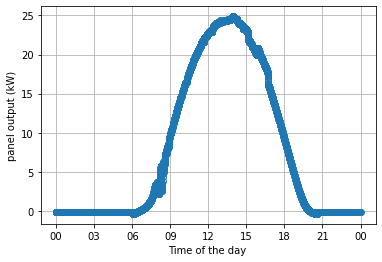

plotting for date 20170729


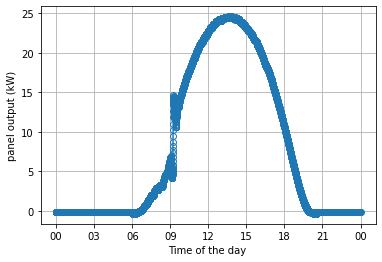

plotting for date 20170730


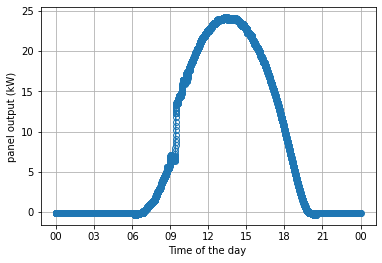

plotting for date 20170731


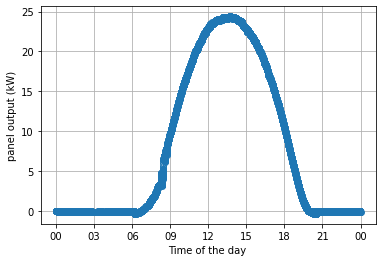

plotting for date 20170801


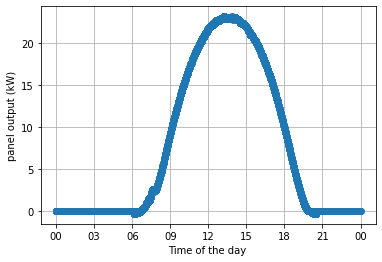

plotting for date 20170802


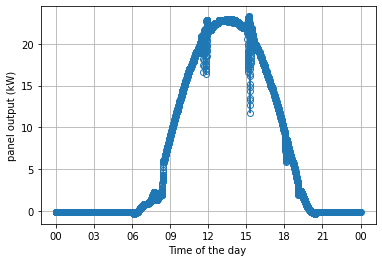

plotting for date 20170803


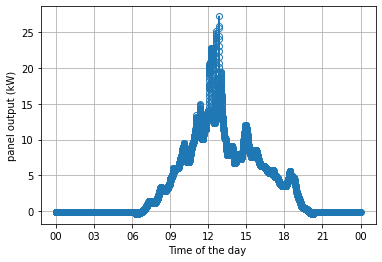

plotting for date 20170804


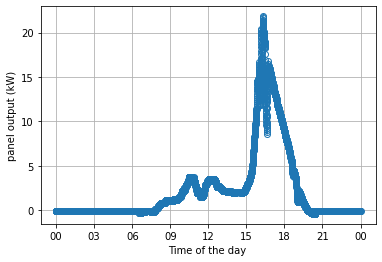

plotting for date 20170805


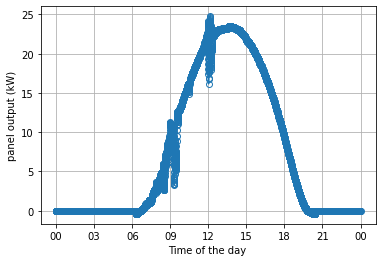

plotting for date 20170806


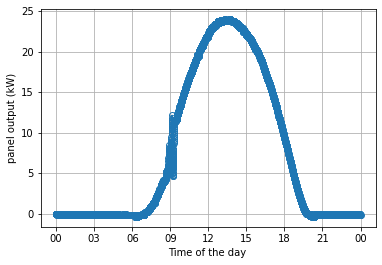

plotting for date 20170807


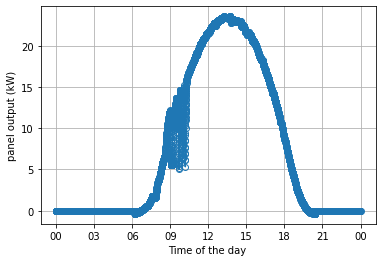

plotting for date 20170808


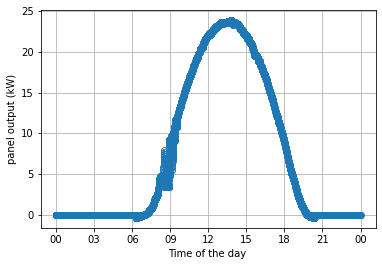

plotting for date 20170809


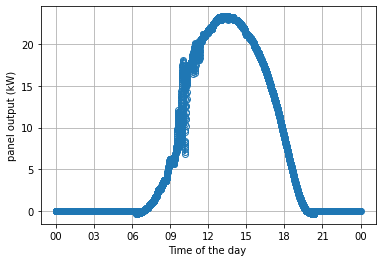

plotting for date 20170810


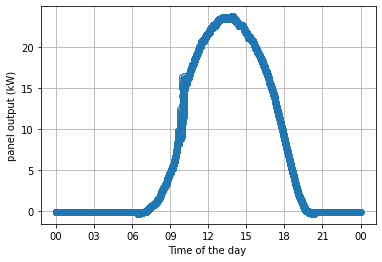

plotting for date 20170811


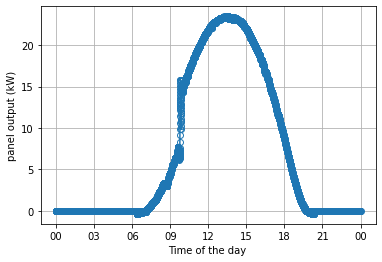

plotting for date 20170812


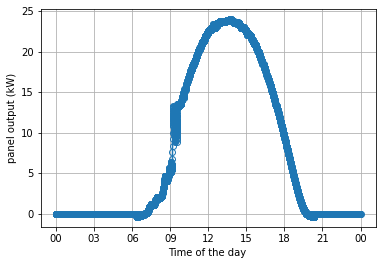

plotting for date 20170813


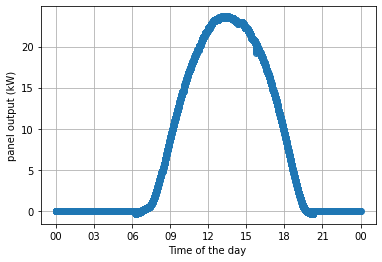

plotting for date 20170814


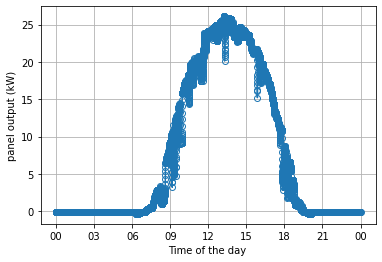

plotting for date 20170815


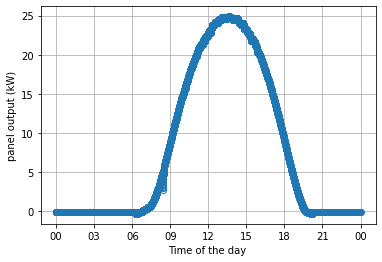

plotting for date 20170816


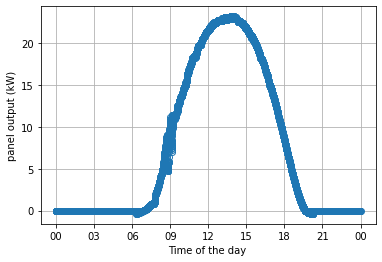

plotting for date 20170817


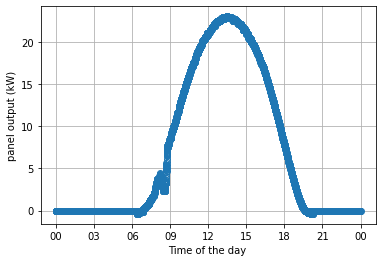

plotting for date 20170818


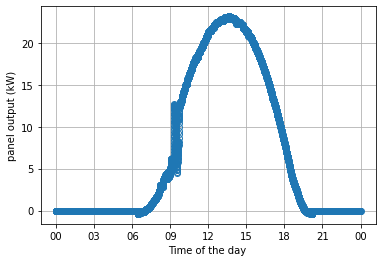

plotting for date 20170819


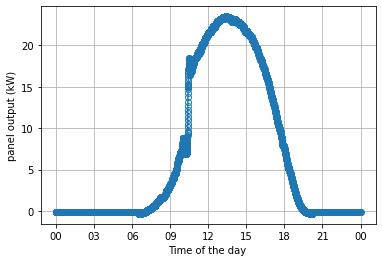

plotting for date 20170820


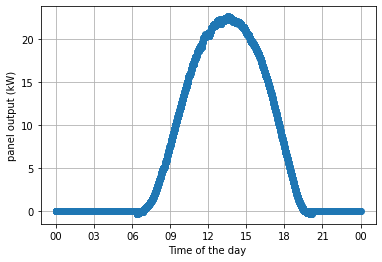

plotting for date 20170821


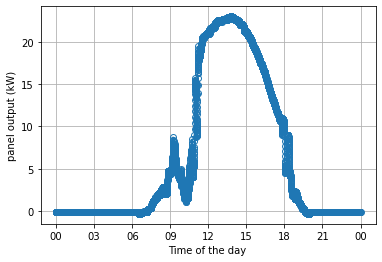

plotting for date 20170822


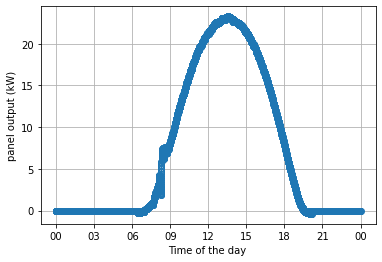

plotting for date 20170823


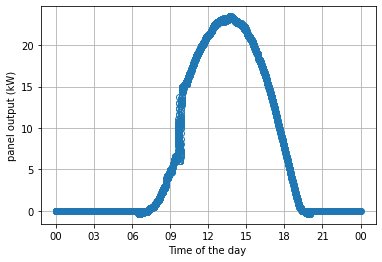

plotting for date 20170824


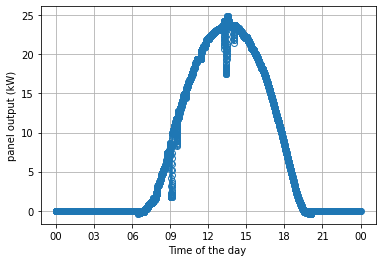

plotting for date 20170825


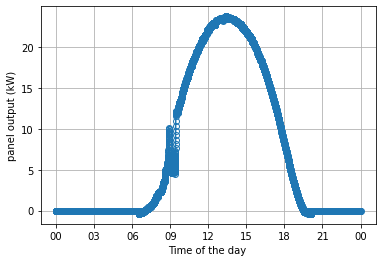

plotting for date 20170826


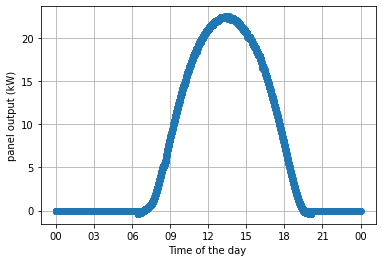

plotting for date 20170827


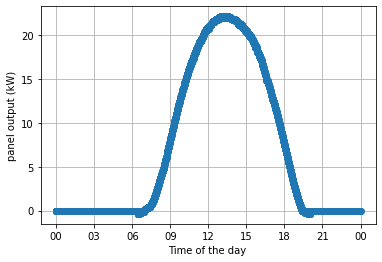

plotting for date 20170828


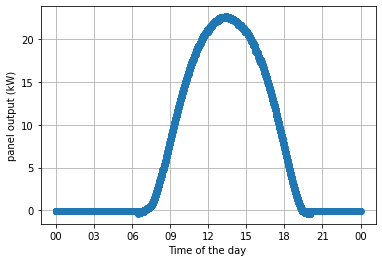

plotting for date 20170829


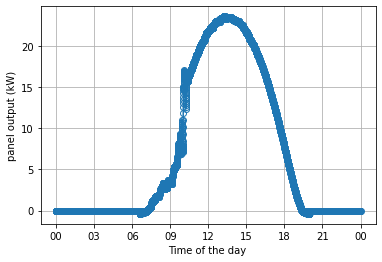

plotting for date 20170830


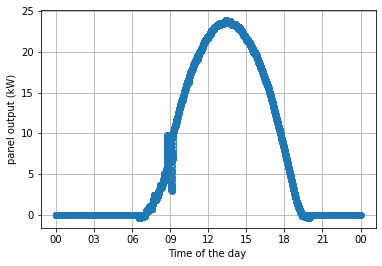

plotting for date 20170831


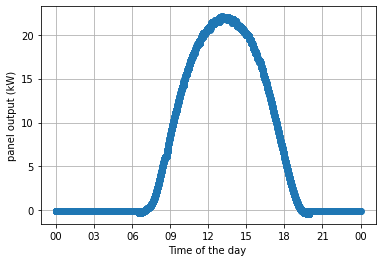

plotting for date 20170901


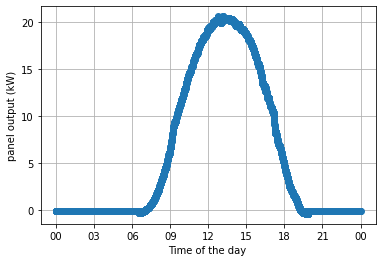

plotting for date 20170902


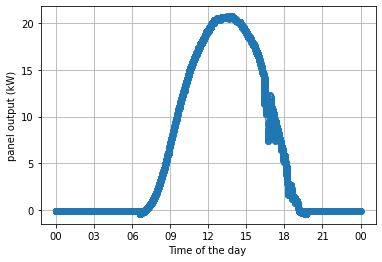

plotting for date 20170903


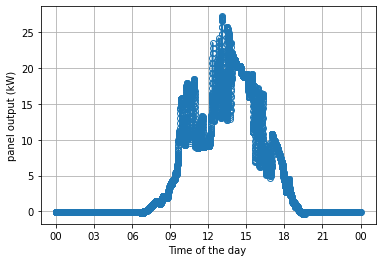

plotting for date 20170904


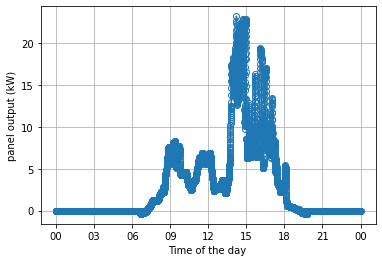

plotting for date 20170905


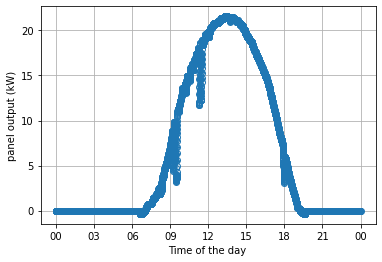

plotting for date 20170906


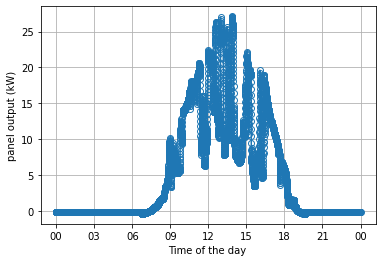

plotting for date 20170907


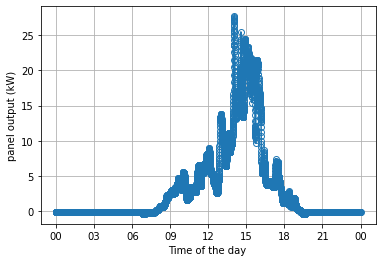

plotting for date 20170908


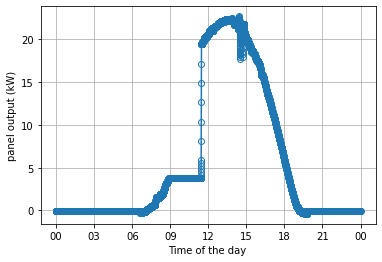

plotting for date 20170909


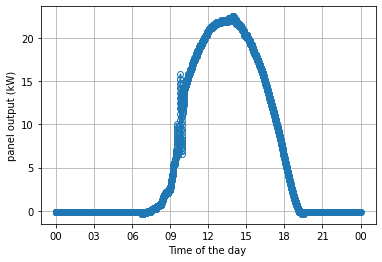

plotting for date 20170910


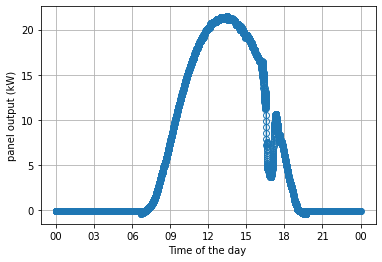

plotting for date 20170911


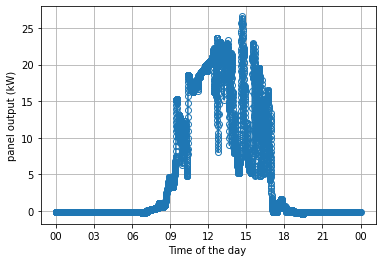

plotting for date 20170912


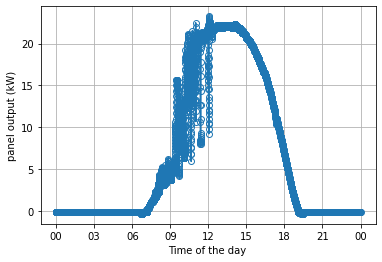

plotting for date 20170913


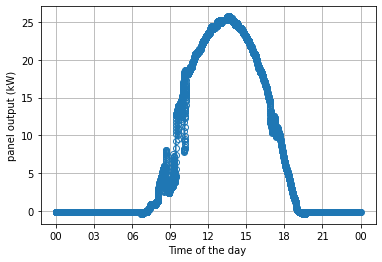

plotting for date 20170914


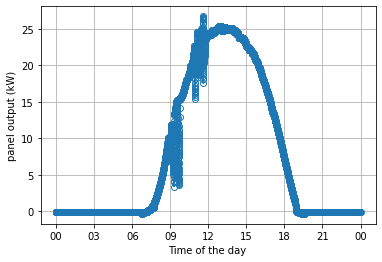

plotting for date 20170915


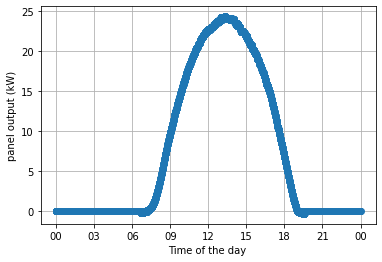

plotting for date 20170916


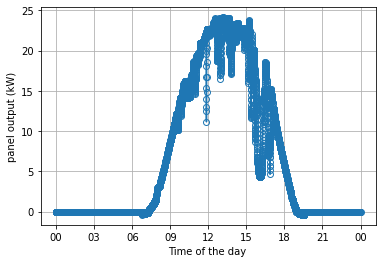

plotting for date 20170917


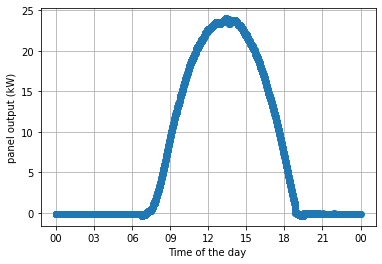

plotting for date 20170918


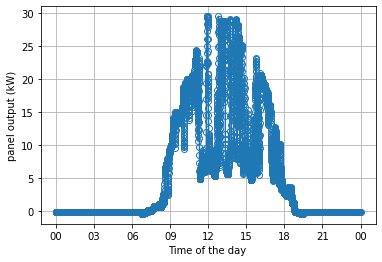

plotting for date 20170919


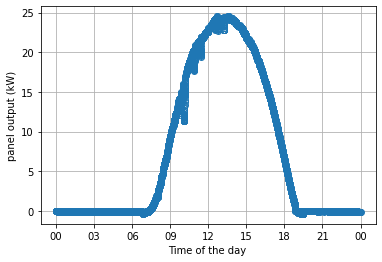

plotting for date 20170920


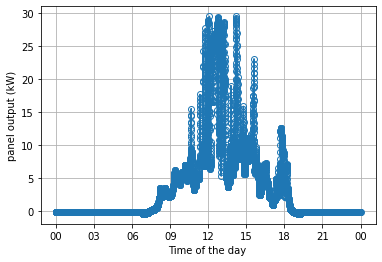

plotting for date 20170921


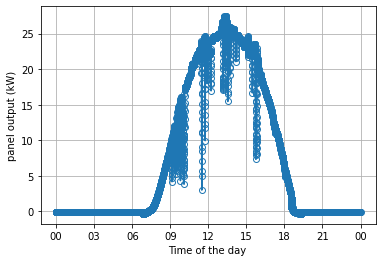

plotting for date 20170922


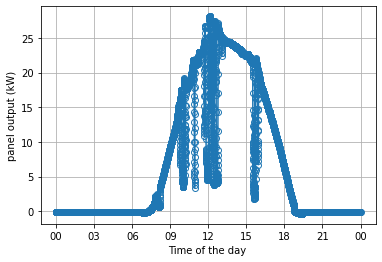

plotting for date 20170923


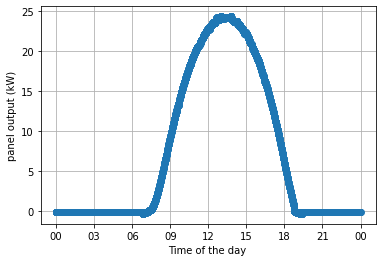

plotting for date 20170924


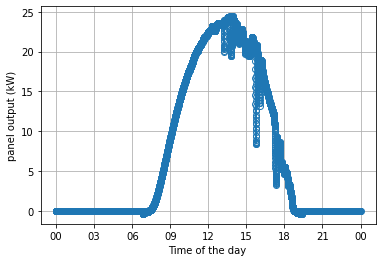

plotting for date 20170925


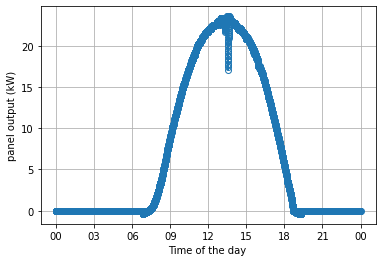

plotting for date 20170926


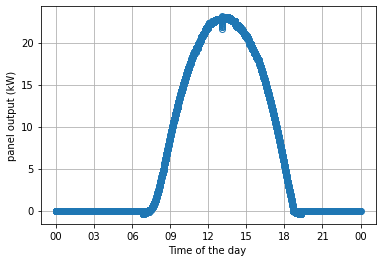

plotting for date 20170927


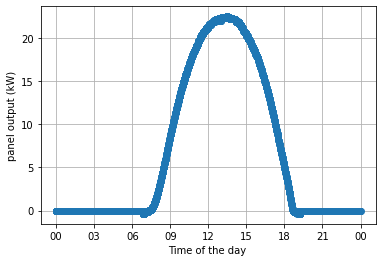

plotting for date 20170928


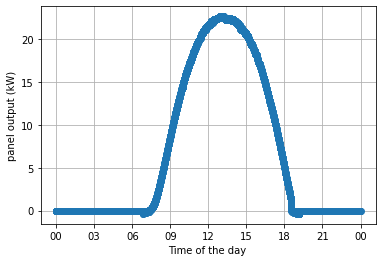

plotting for date 20170929


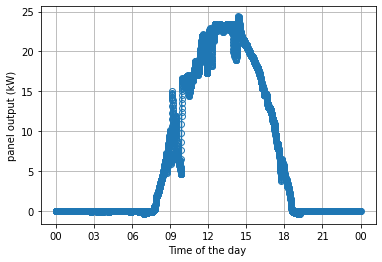

plotting for date 20170930


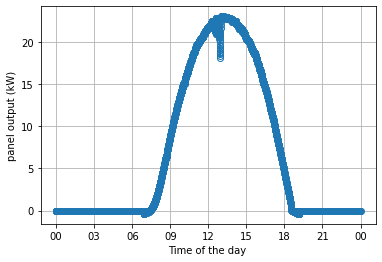

plotting for date 20171001


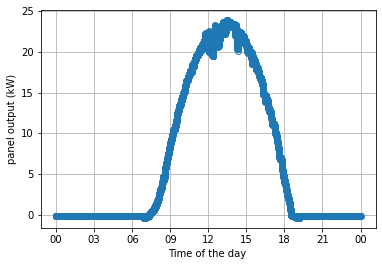

plotting for date 20171002


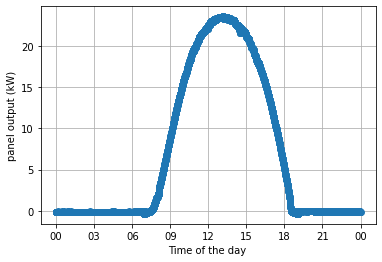

plotting for date 20171003


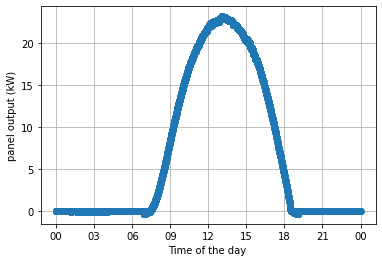

plotting for date 20171004


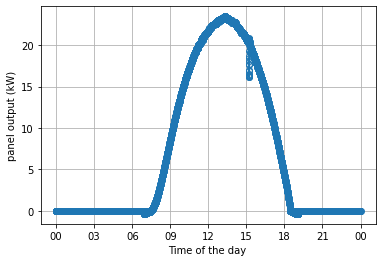

plotting for date 20171005


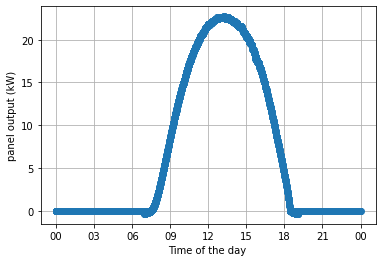

plotting for date 20171006


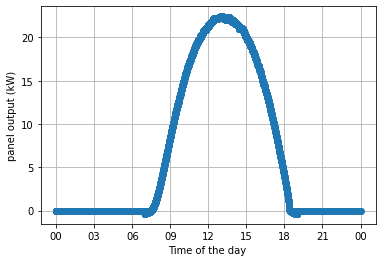

plotting for date 20171007


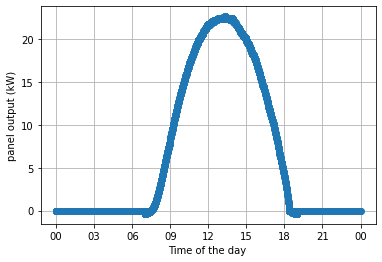

plotting for date 20171008


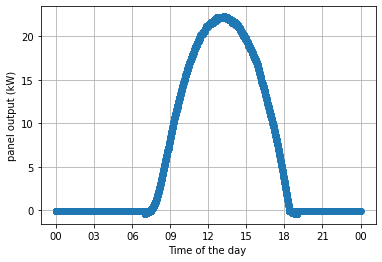

plotting for date 20171009


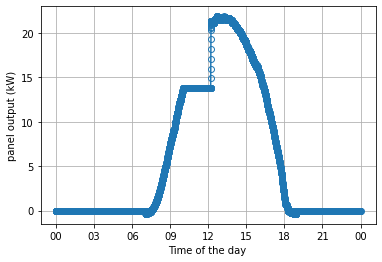

plotting for date 20171010


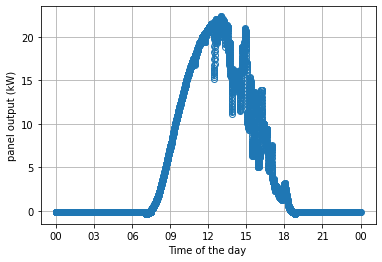

plotting for date 20171011


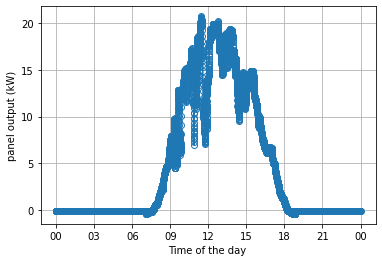

plotting for date 20171012


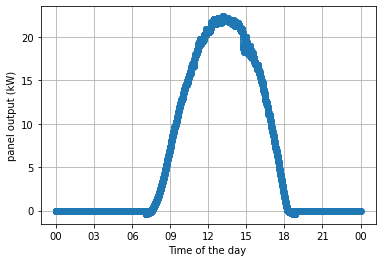

plotting for date 20171013


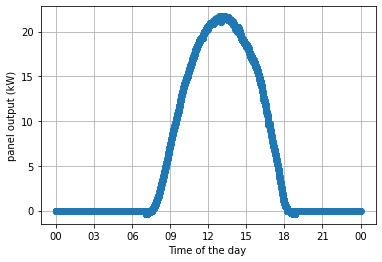

plotting for date 20171014


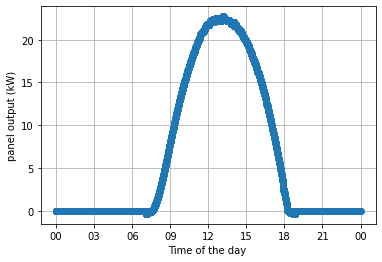

plotting for date 20171015


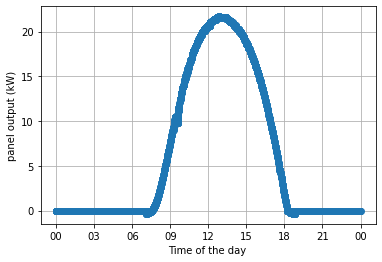

plotting for date 20171016


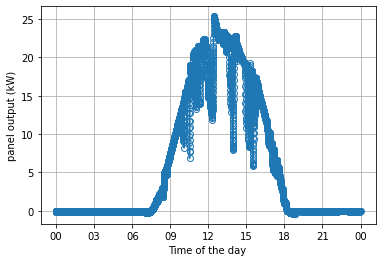

plotting for date 20171017


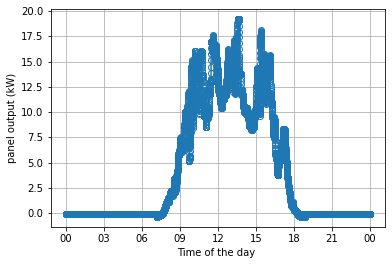

plotting for date 20171018


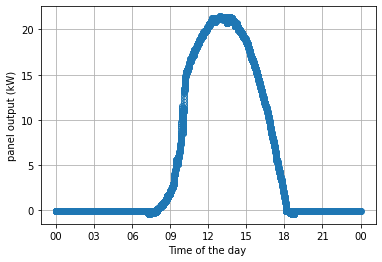

plotting for date 20171019


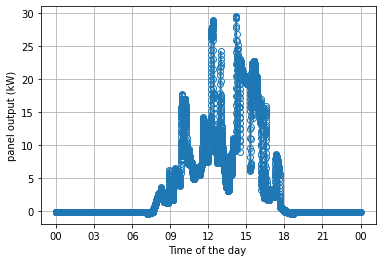

plotting for date 20171020


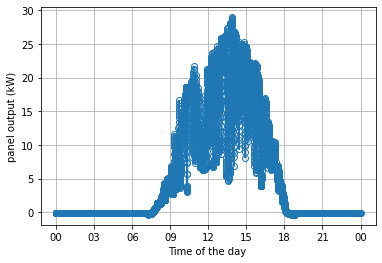

plotting for date 20171021


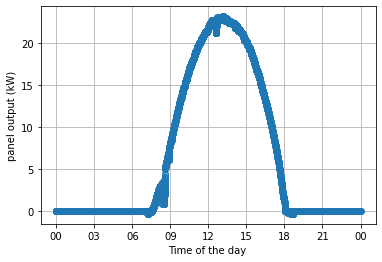

plotting for date 20171022


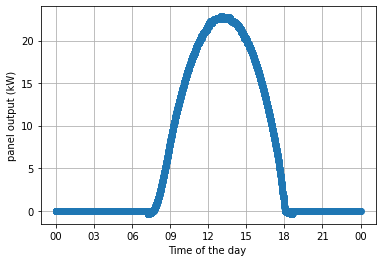

plotting for date 20171023


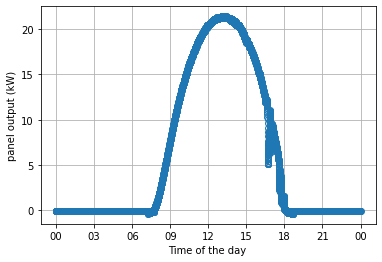

plotting for date 20171024


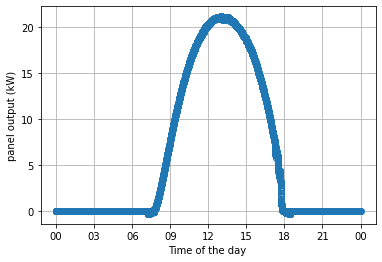

plotting for date 20171025


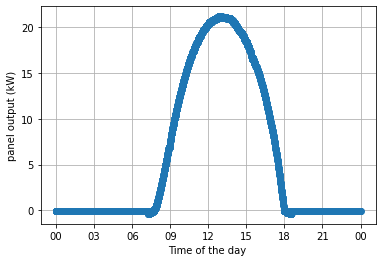

plotting for date 20171026


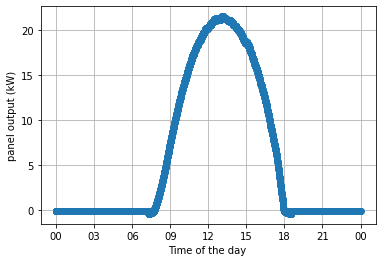

plotting for date 20171027


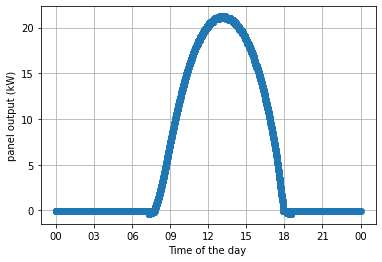

plotting for date 20171028


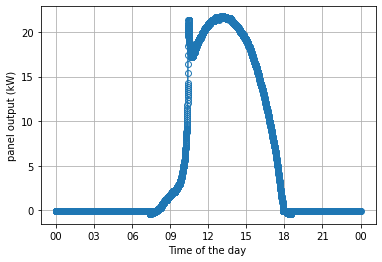

plotting for date 20171029


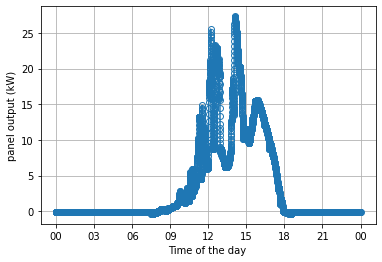

plotting for date 20171030


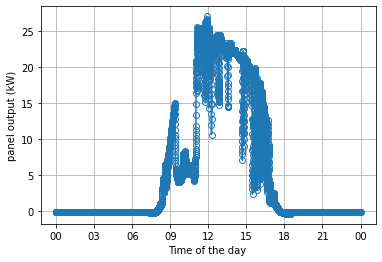

plotting for date 20171031


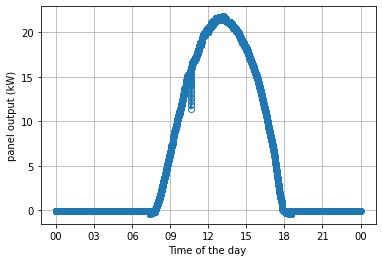

plotting for date 20171101


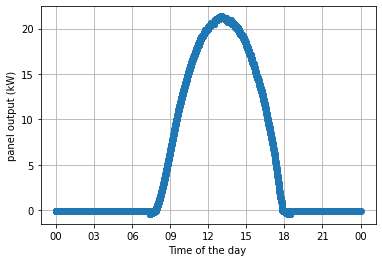

plotting for date 20171102


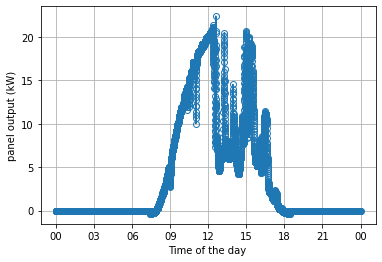

plotting for date 20171103


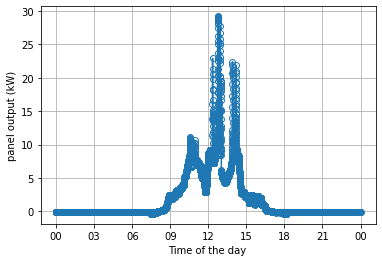

plotting for date 20171104


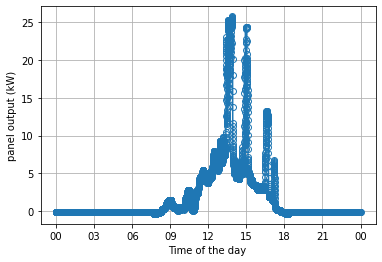

plotting for date 20171105


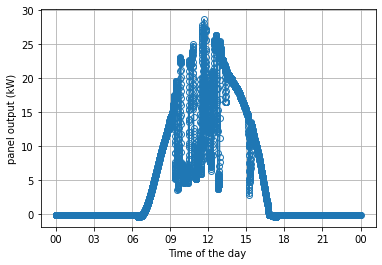

plotting for date 20171106


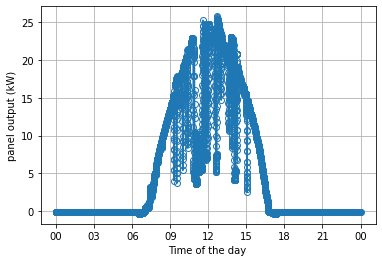

plotting for date 20171107


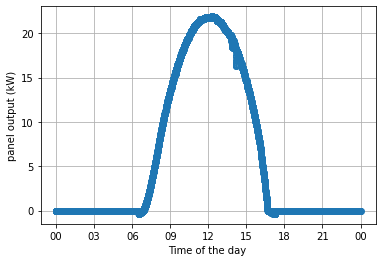

plotting for date 20171108


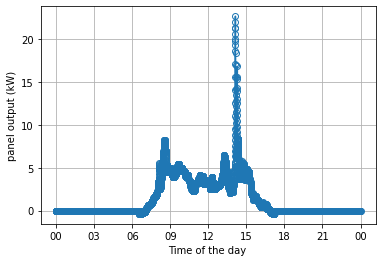

plotting for date 20171109


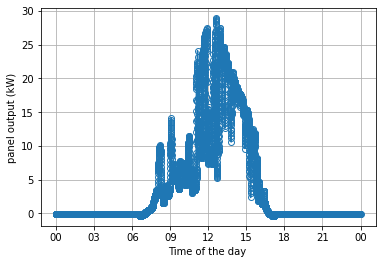

plotting for date 20171110


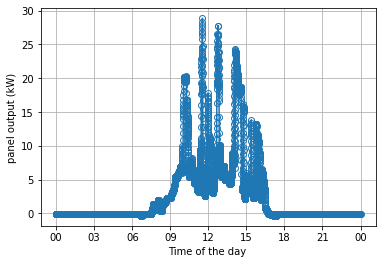

plotting for date 20171111


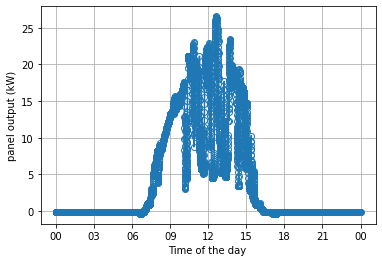

plotting for date 20171112


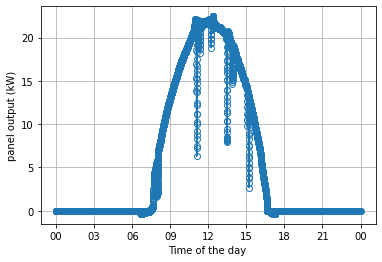

plotting for date 20171113


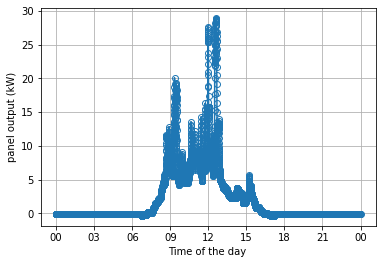

plotting for date 20171114


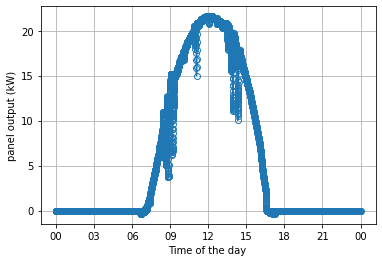

plotting for date 20171115


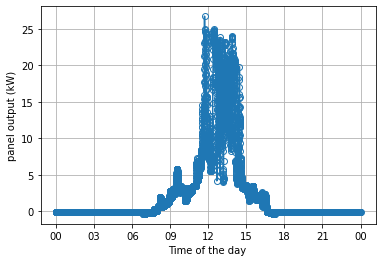

plotting for date 20171116


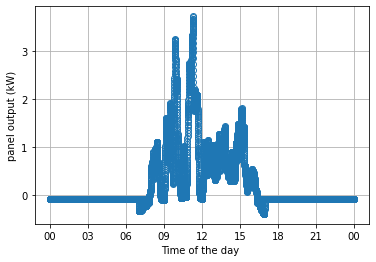

plotting for date 20171117


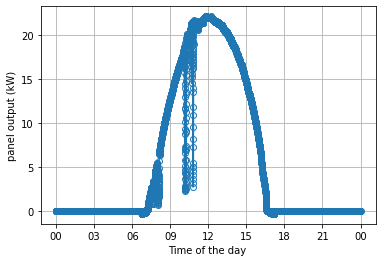

plotting for date 20171118


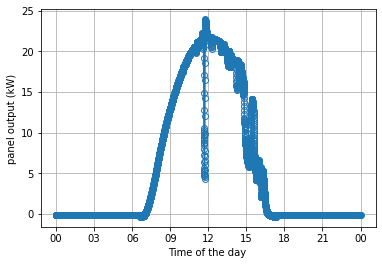

plotting for date 20171119


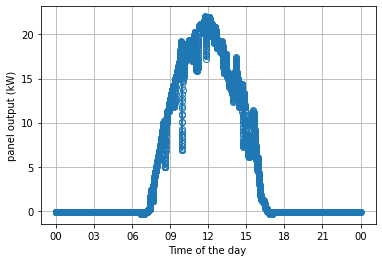

plotting for date 20171120


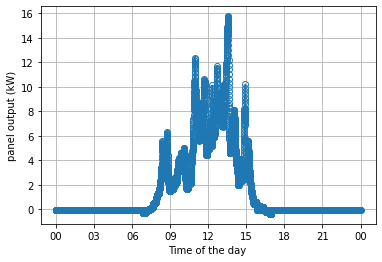

plotting for date 20171121


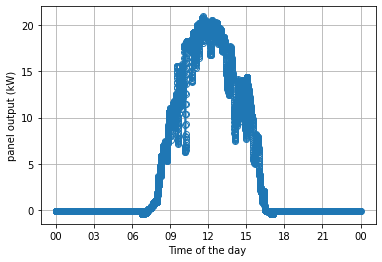

plotting for date 20171122


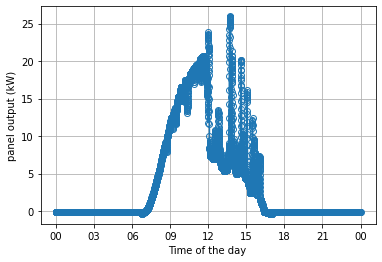

plotting for date 20171123


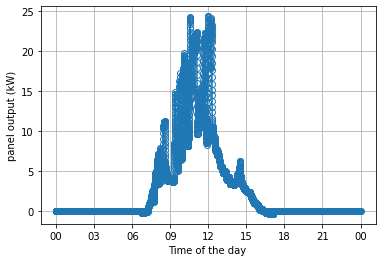

plotting for date 20171124


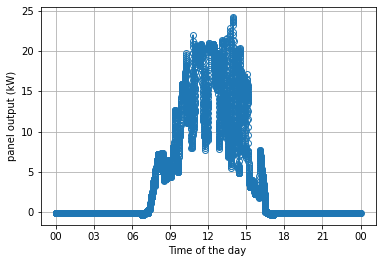

plotting for date 20171125


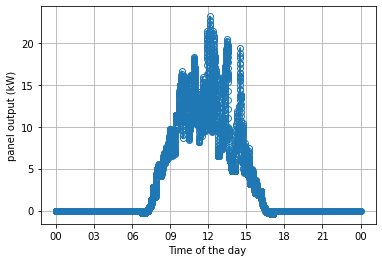

plotting for date 20171126


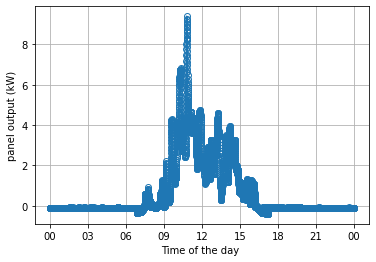

plotting for date 20171127


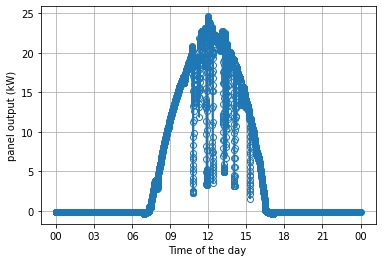

plotting for date 20171128


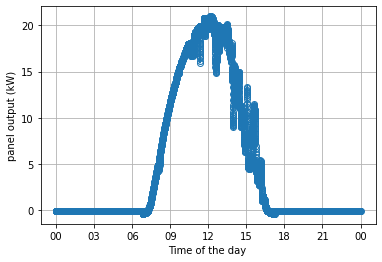

plotting for date 20171129


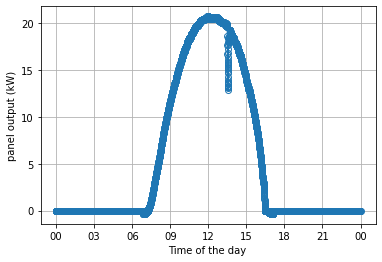

plotting for date 20171130


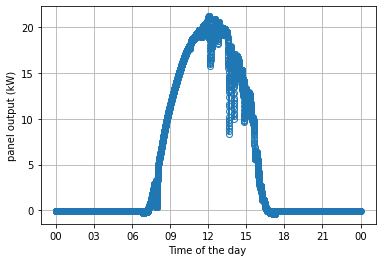

plotting for date 20171201


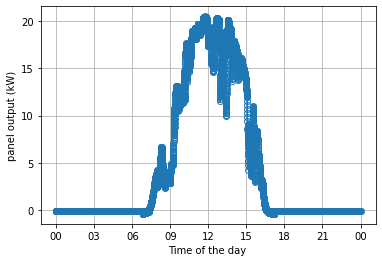

plotting for date 20171202


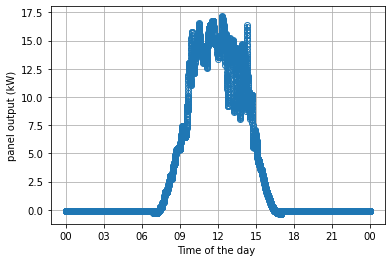

plotting for date 20171203


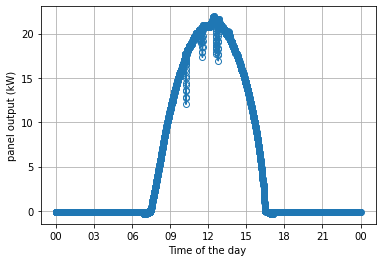

plotting for date 20171204


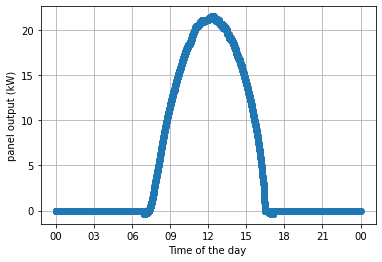

plotting for date 20171205


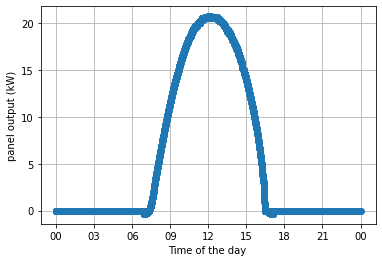

plotting for date 20171206


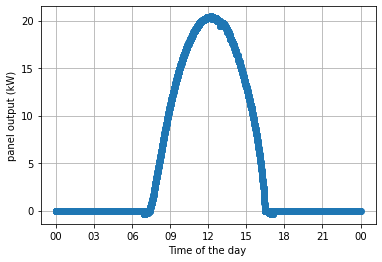

plotting for date 20171207


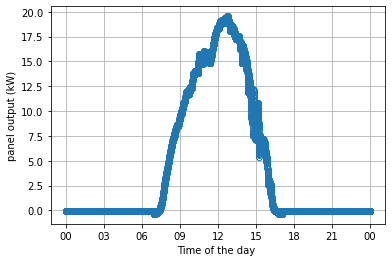

plotting for date 20171208


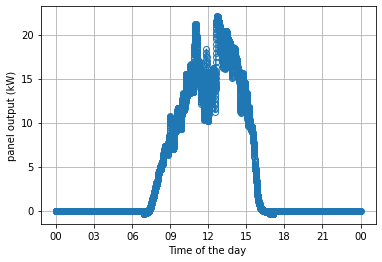

plotting for date 20171209


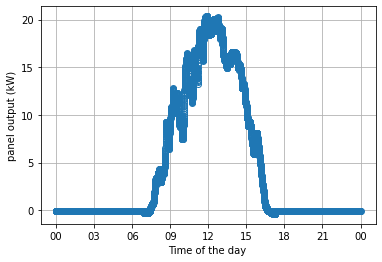

plotting for date 20171210


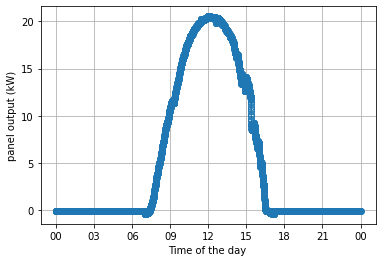

plotting for date 20171211


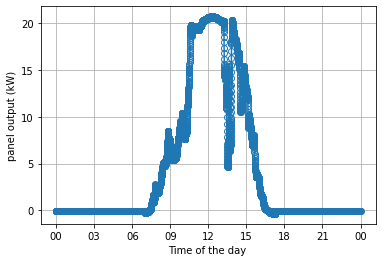

plotting for date 20171212


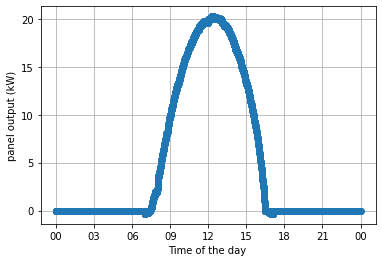

plotting for date 20171213


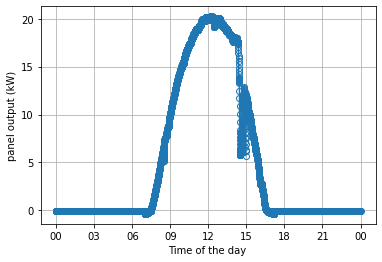

plotting for date 20171214


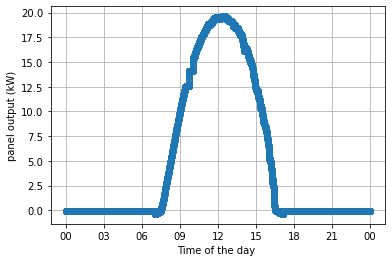

plotting for date 20171215


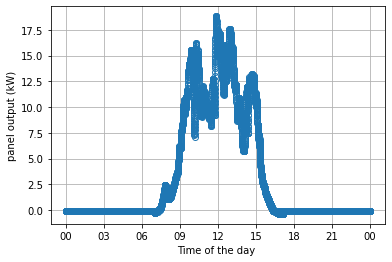

plotting for date 20171216


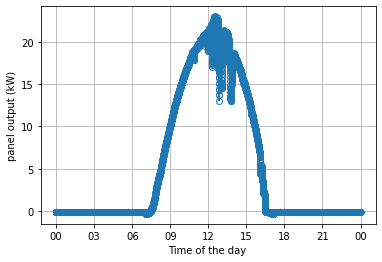

plotting for date 20171217


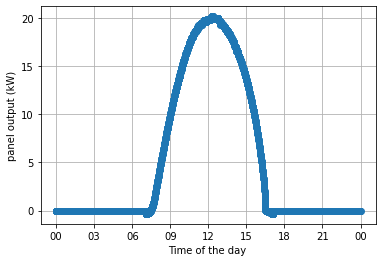

plotting for date 20171218


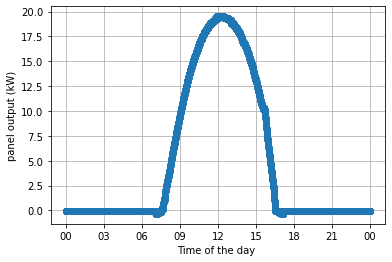

plotting for date 20171219


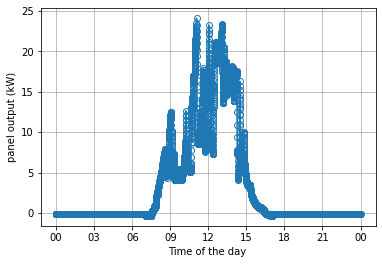

plotting for date 20171220


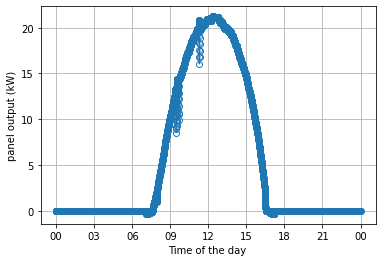

plotting for date 20171221


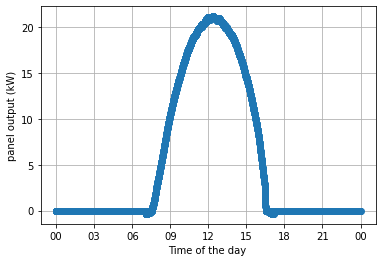

plotting for date 20171222


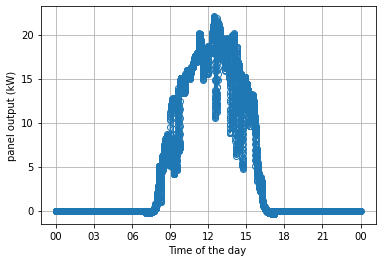

plotting for date 20171223


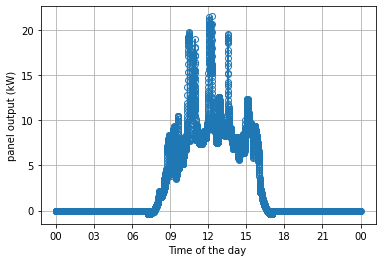

plotting for date 20171224


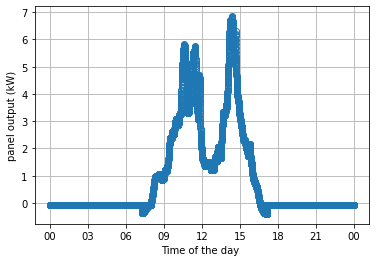

plotting for date 20171225


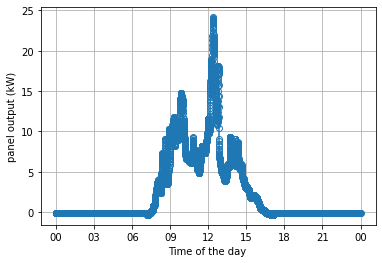

plotting for date 20171226


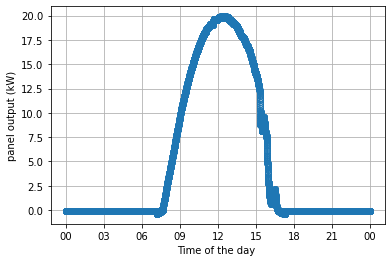

plotting for date 20171227


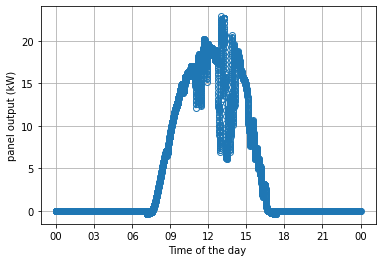

plotting for date 20171228


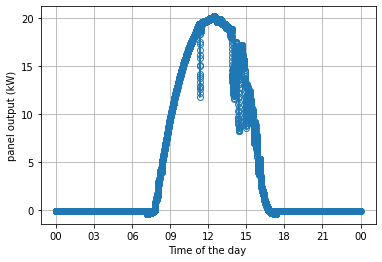

plotting for date 20171229


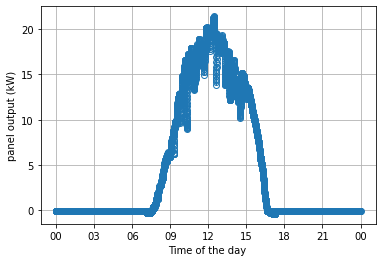

plotting for date 20171230


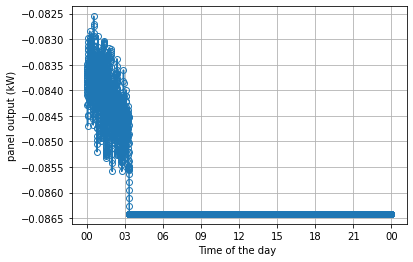

plotting for date 20171231


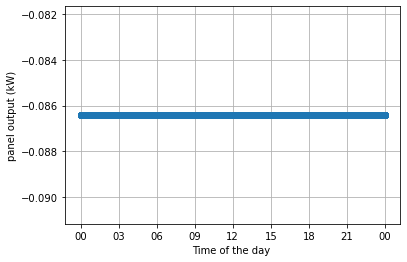

plotting for date 20180101


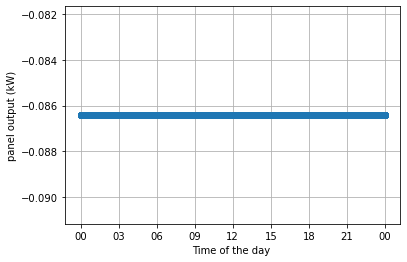

plotting for date 20180102


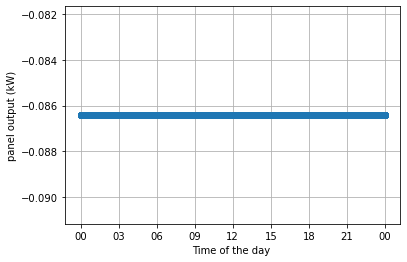

plotting for date 20180103


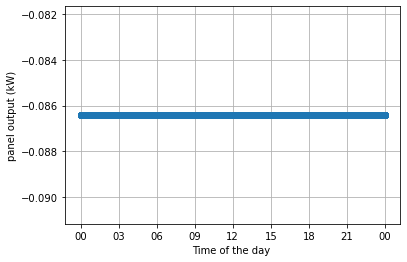

plotting for date 20180104


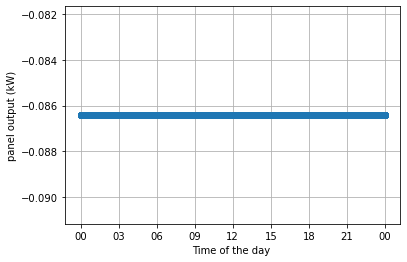

plotting for date 20180105


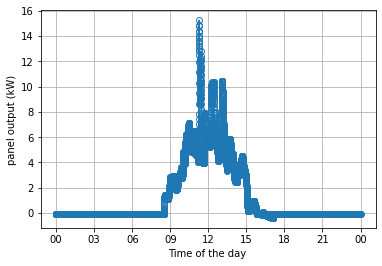

plotting for date 20180106


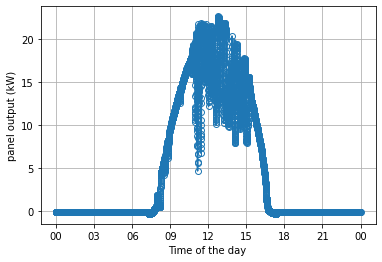

plotting for date 20180107


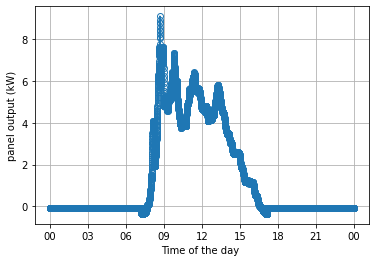

plotting for date 20180108


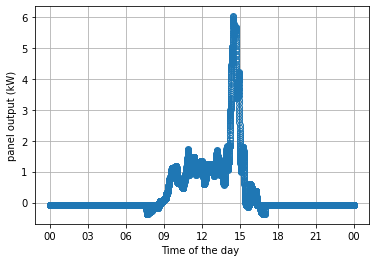

plotting for date 20180109


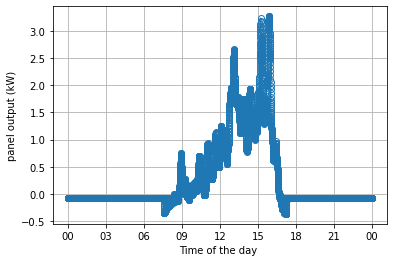

plotting for date 20180110


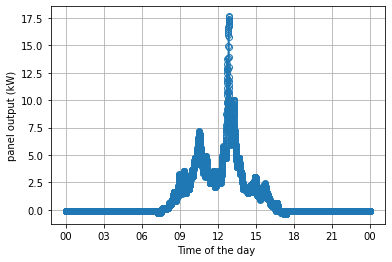

plotting for date 20180111


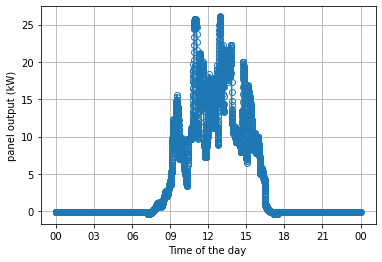

plotting for date 20180112


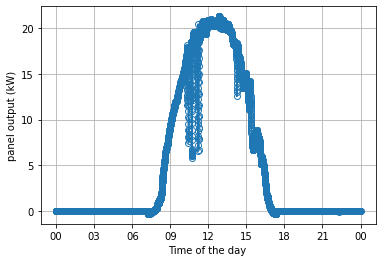

plotting for date 20180113


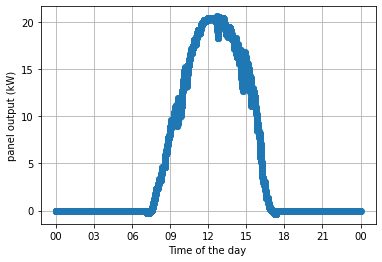

plotting for date 20180114


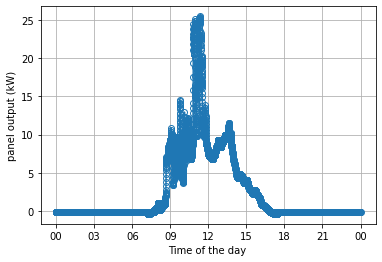

plotting for date 20180115


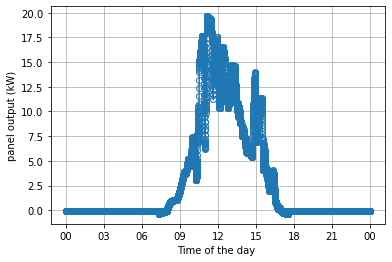

plotting for date 20180116


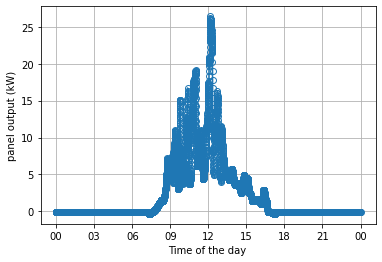

plotting for date 20180117


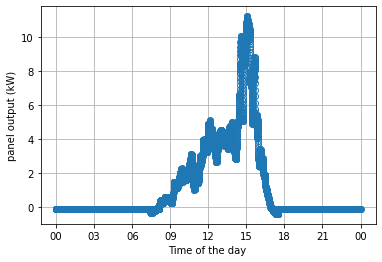

plotting for date 20180118


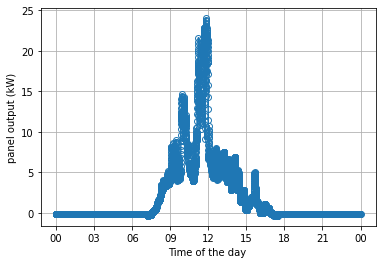

plotting for date 20180119


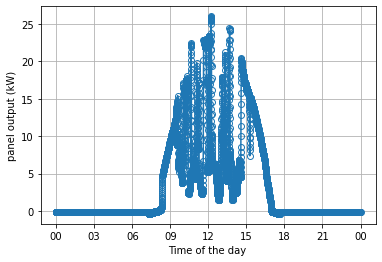

plotting for date 20180120


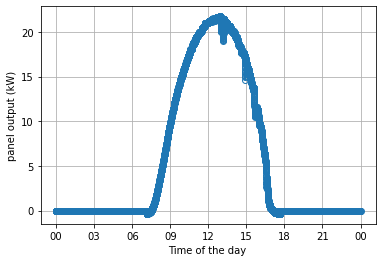

plotting for date 20180121


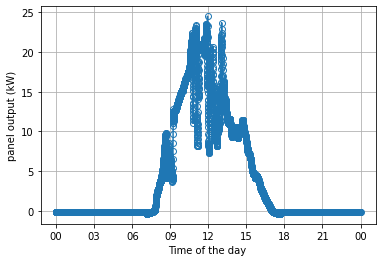

plotting for date 20180122


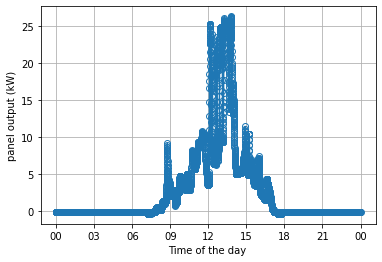

plotting for date 20180123


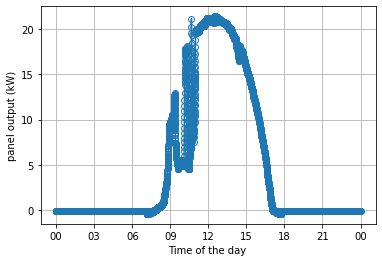

plotting for date 20180124


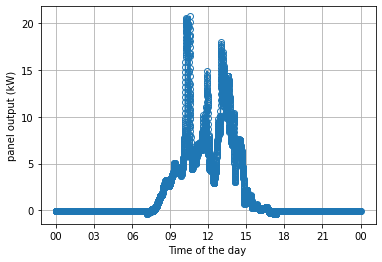

plotting for date 20180125


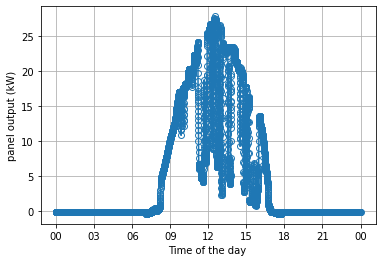

plotting for date 20180126


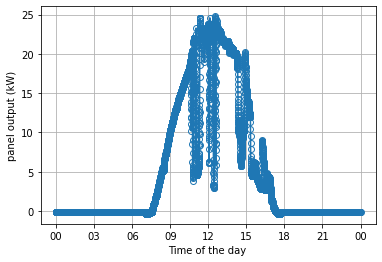

plotting for date 20180127


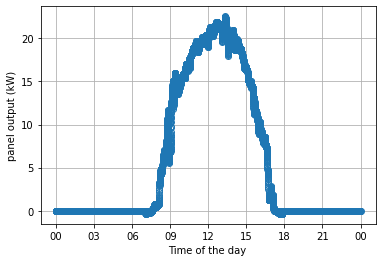

plotting for date 20180128


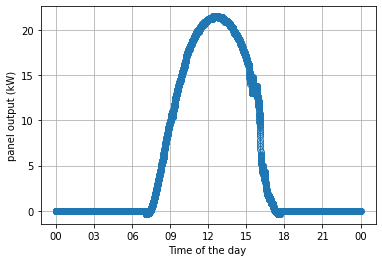

plotting for date 20180129


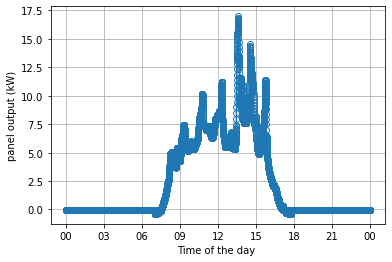

plotting for date 20180130


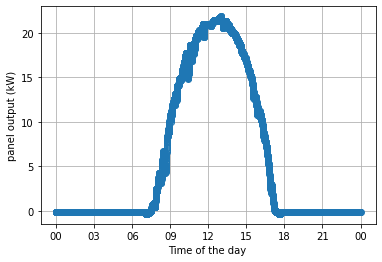

plotting for date 20180131


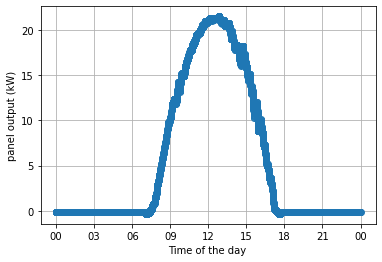

plotting for date 20180201


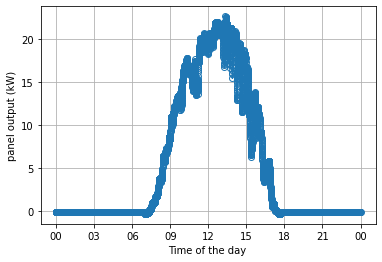

plotting for date 20180202


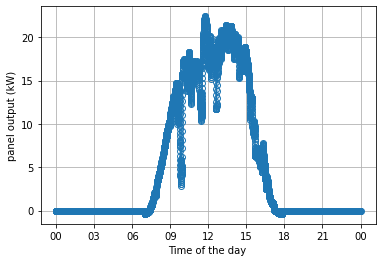

plotting for date 20180203


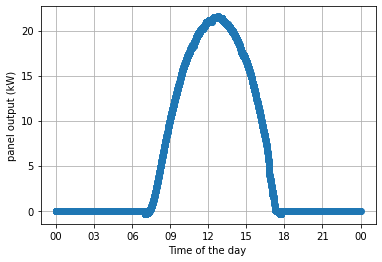

plotting for date 20180204


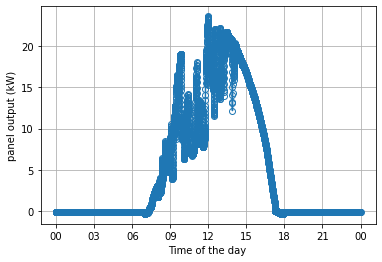

plotting for date 20180205


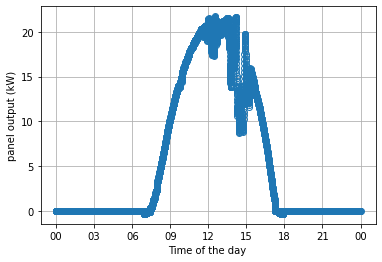

plotting for date 20180206


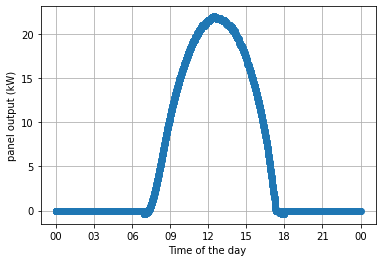

plotting for date 20180207


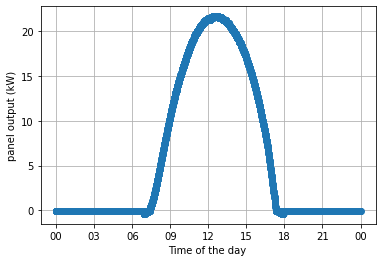

plotting for date 20180208


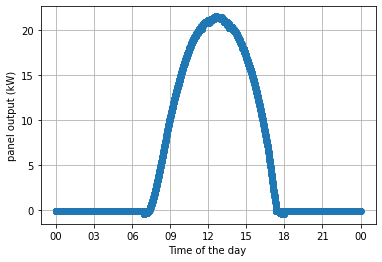

plotting for date 20180209


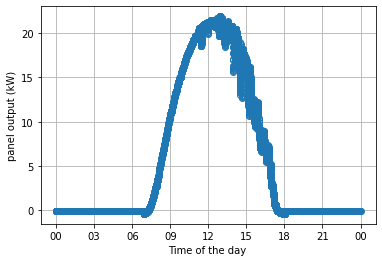

plotting for date 20180210


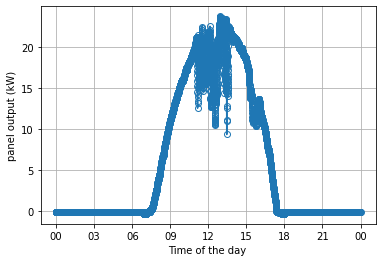

plotting for date 20180211


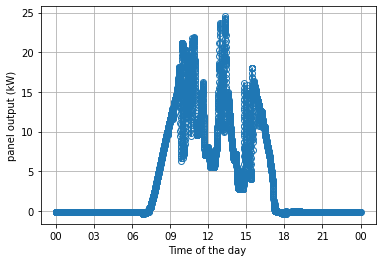

plotting for date 20180212


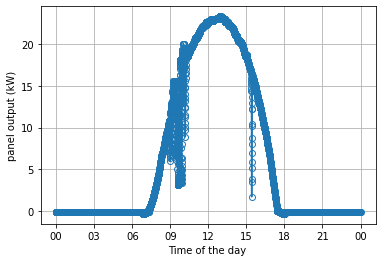

plotting for date 20180213


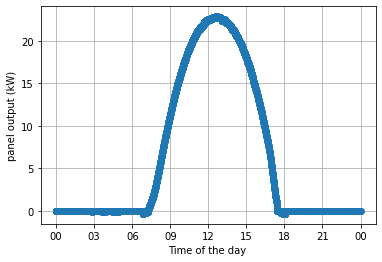

plotting for date 20180214


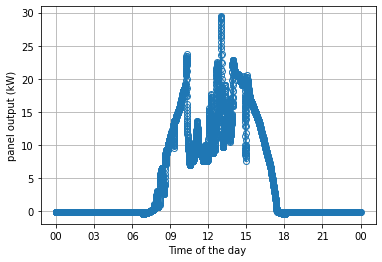

plotting for date 20180215


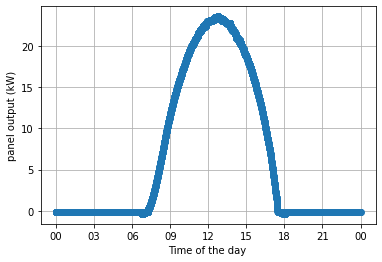

plotting for date 20180216


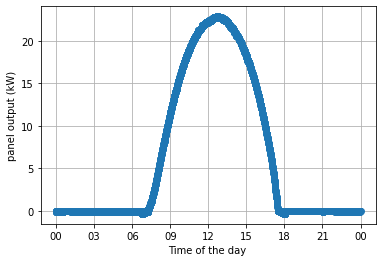

plotting for date 20180217


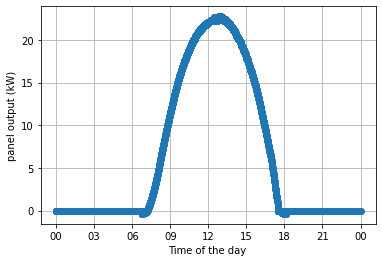

plotting for date 20180218


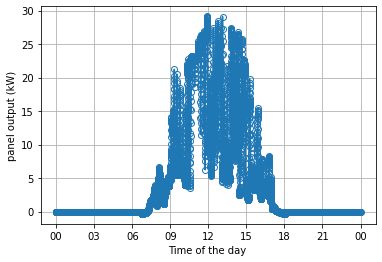

plotting for date 20180219


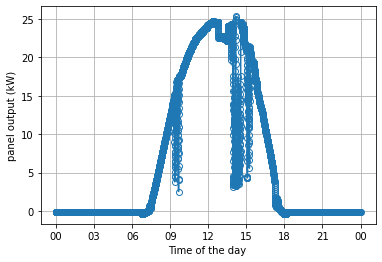

plotting for date 20180220


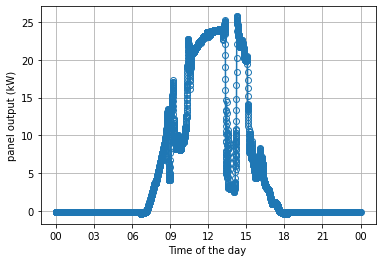

plotting for date 20180221


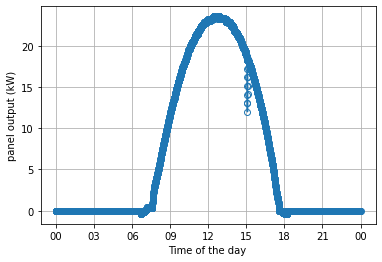

plotting for date 20180222


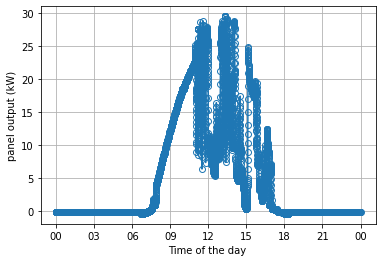

plotting for date 20180223


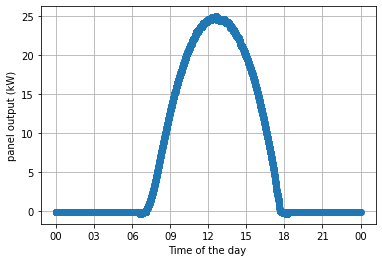

plotting for date 20180224


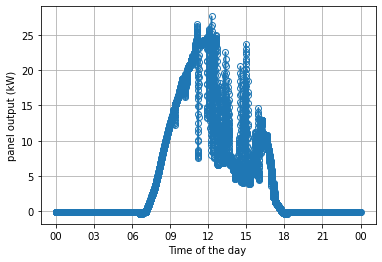

plotting for date 20180225


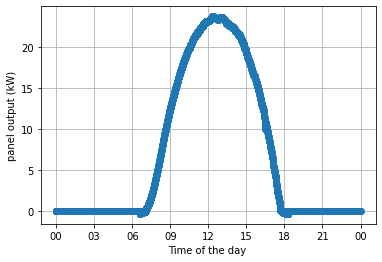

plotting for date 20180226


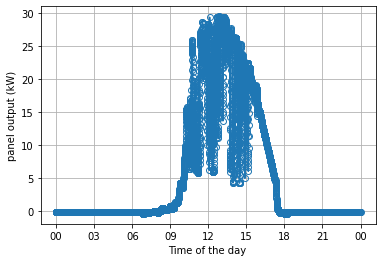

plotting for date 20180227


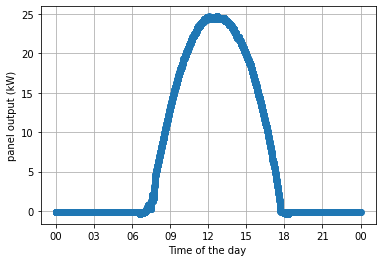

plotting for date 20180228


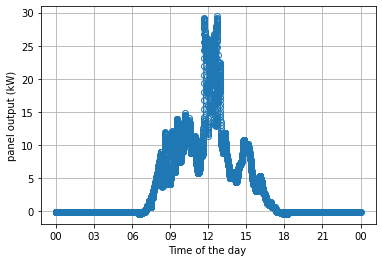

plotting for date 20180301


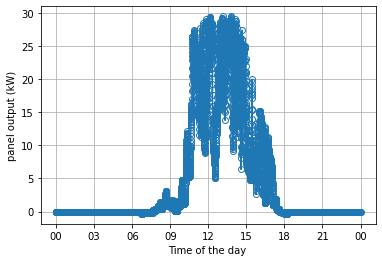

plotting for date 20180302


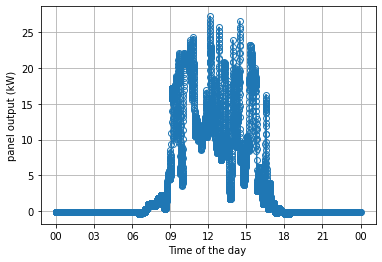

plotting for date 20180303


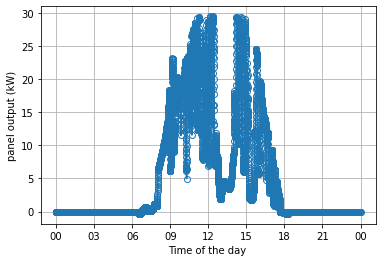

plotting for date 20180304


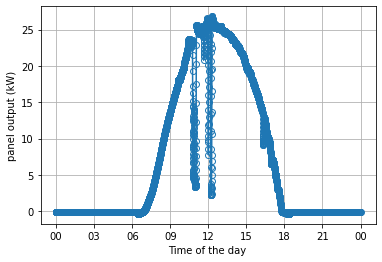

plotting for date 20180305


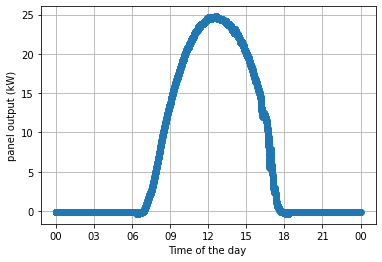

plotting for date 20180306


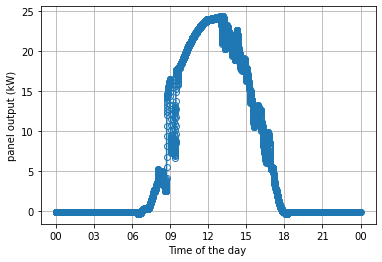

plotting for date 20180307


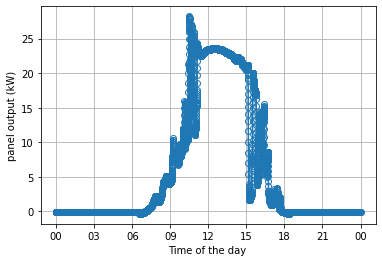

plotting for date 20180308


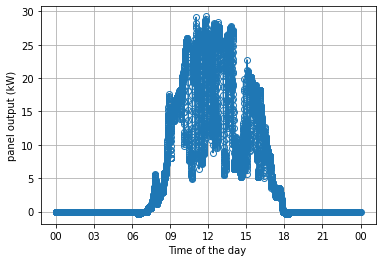

plotting for date 20180309


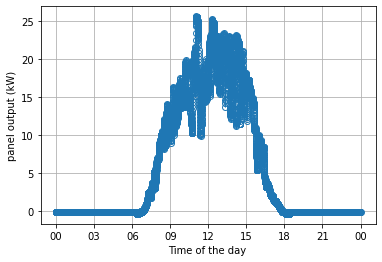

plotting for date 20180310


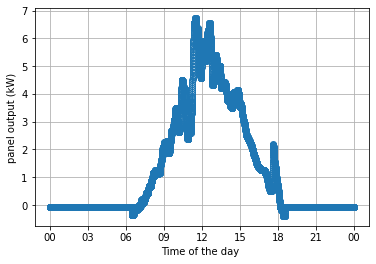

plotting for date 20180311


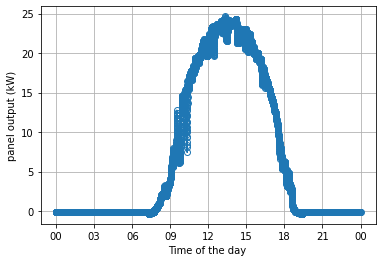

plotting for date 20180312


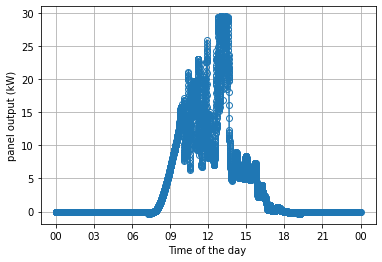

plotting for date 20180313


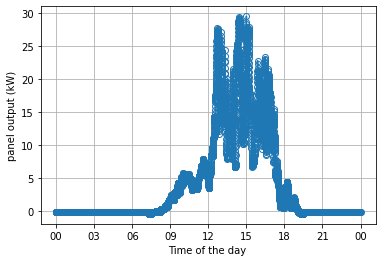

plotting for date 20180314


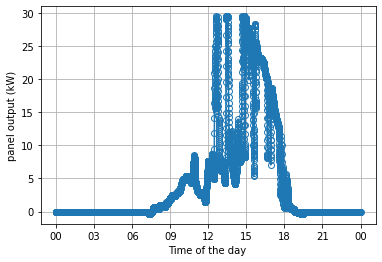

plotting for date 20180315


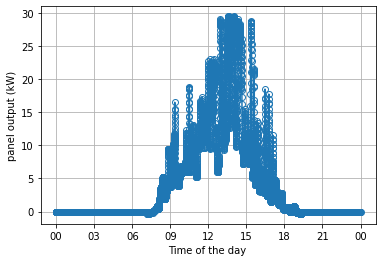

plotting for date 20180316


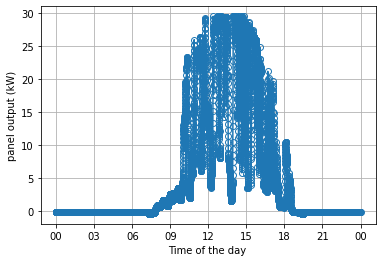

plotting for date 20180317


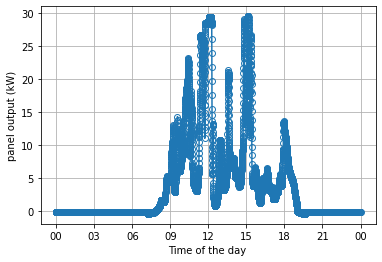

plotting for date 20180318


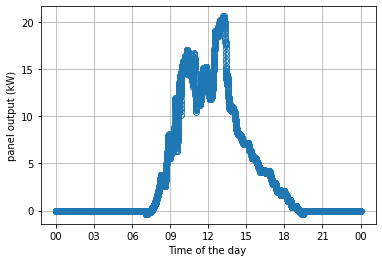

plotting for date 20180319


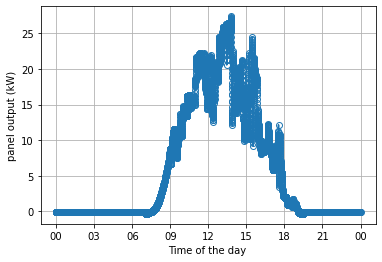

plotting for date 20180320


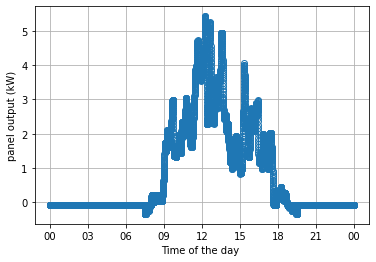

plotting for date 20180321


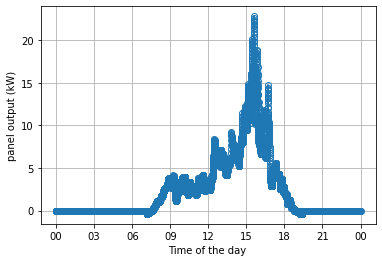

plotting for date 20180322


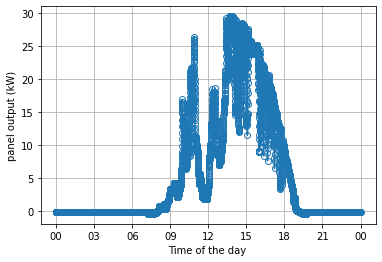

plotting for date 20180323


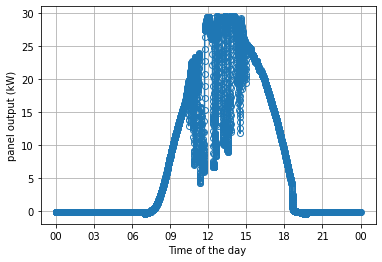

plotting for date 20180324


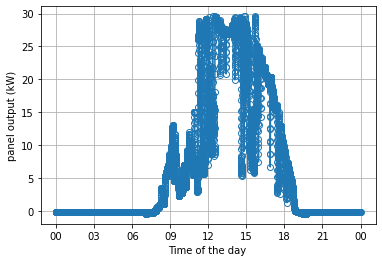

plotting for date 20180325


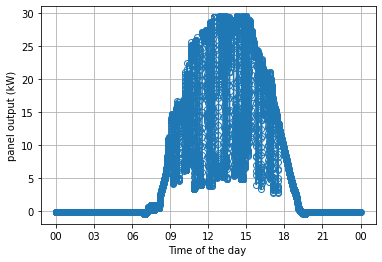

plotting for date 20180326


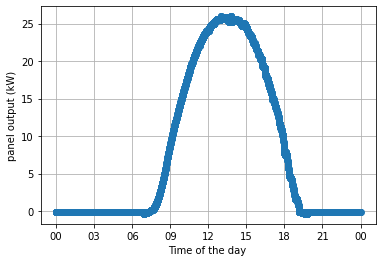

plotting for date 20180327


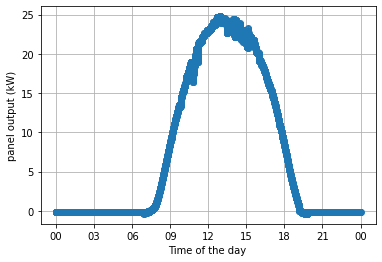

plotting for date 20180328


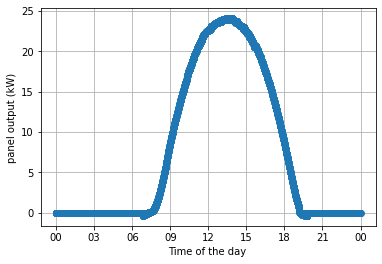

plotting for date 20180329


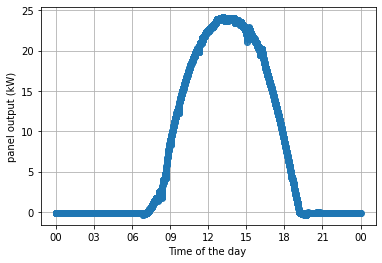

plotting for date 20180330


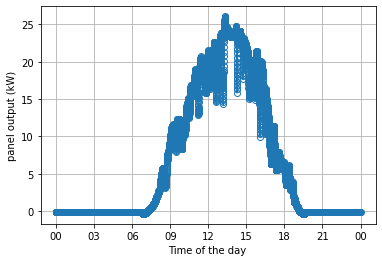

plotting for date 20180331


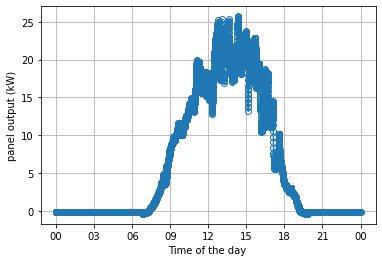

plotting for date 20180401


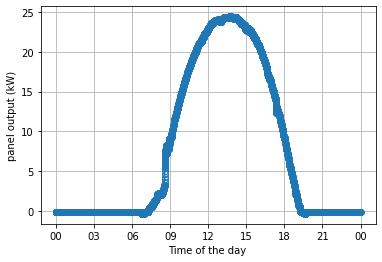

plotting for date 20180402


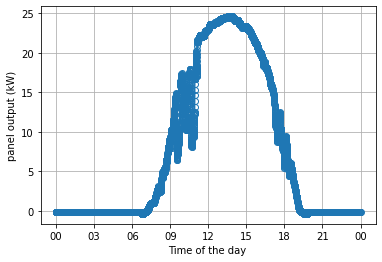

plotting for date 20180403


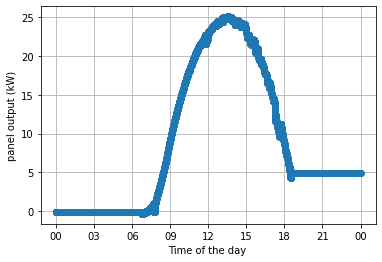

plotting for date 20180404


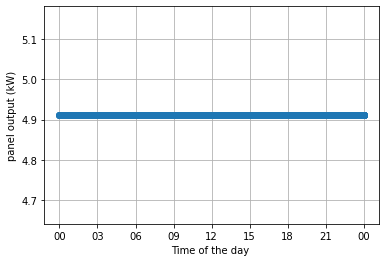

plotting for date 20180405


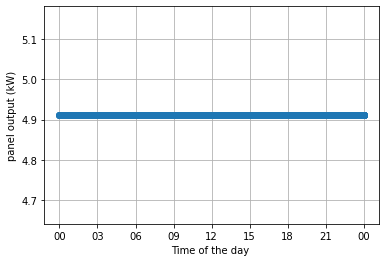

plotting for date 20180406


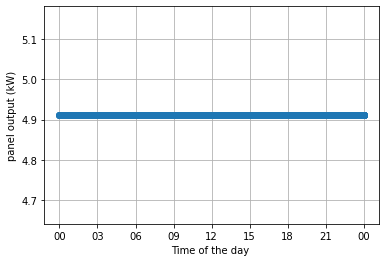

plotting for date 20180407


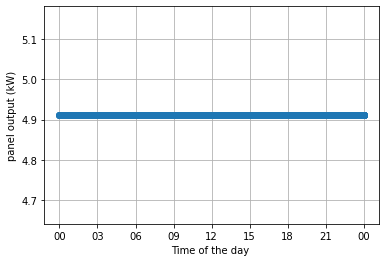

plotting for date 20180408


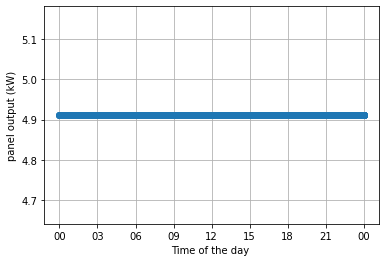

plotting for date 20180409


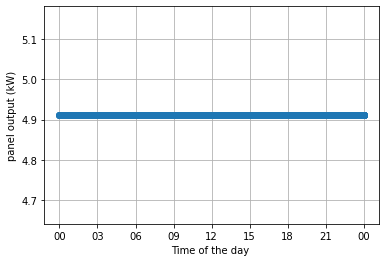

plotting for date 20180410


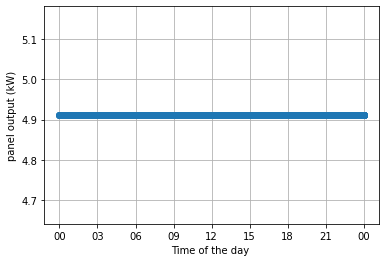

plotting for date 20180411


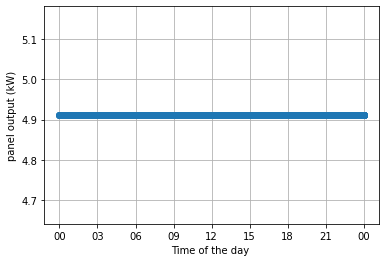

plotting for date 20180412


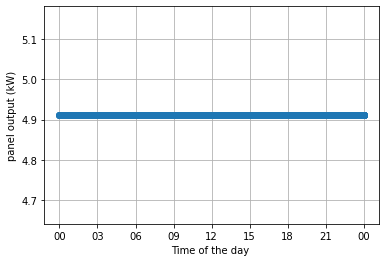

plotting for date 20180413


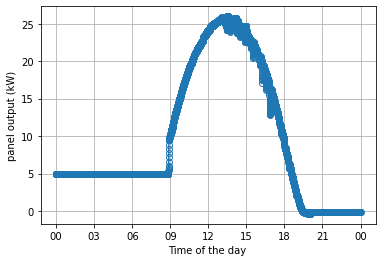

plotting for date 20180414


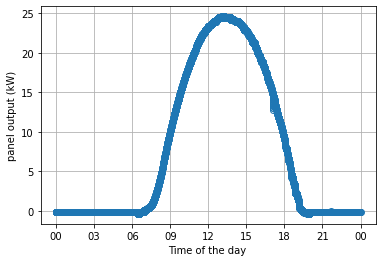

plotting for date 20180415


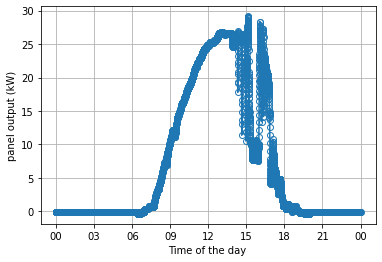

plotting for date 20180416


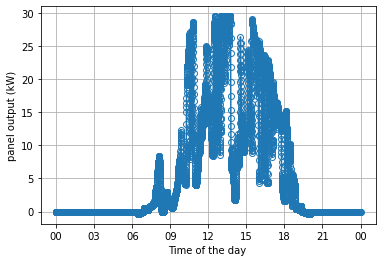

plotting for date 20180417


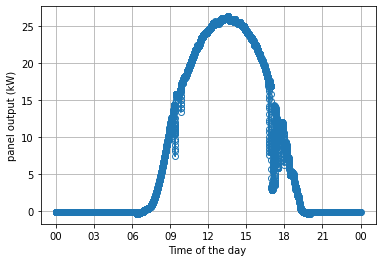

plotting for date 20180418


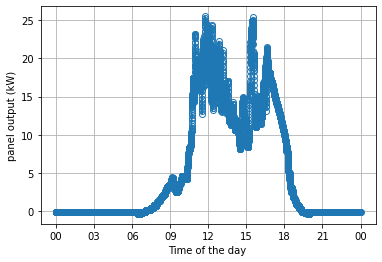

plotting for date 20180419


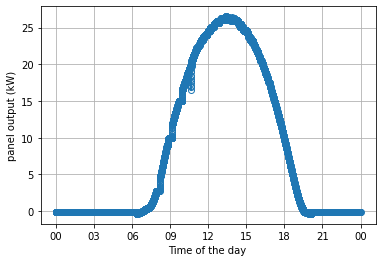

plotting for date 20180420


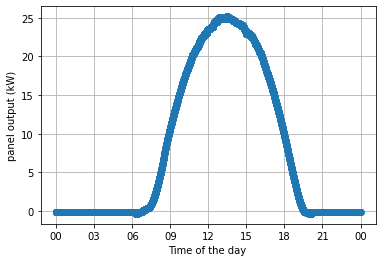

plotting for date 20180421


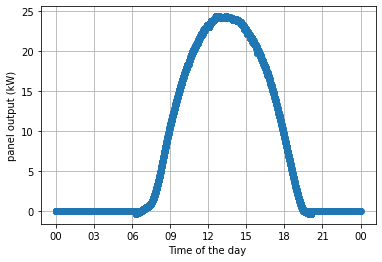

plotting for date 20180422


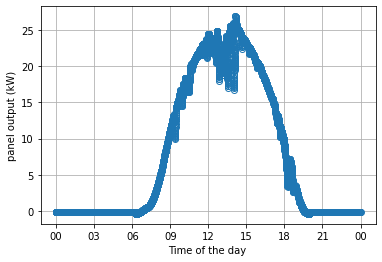

plotting for date 20180423


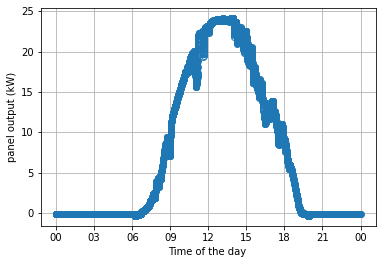

plotting for date 20180424


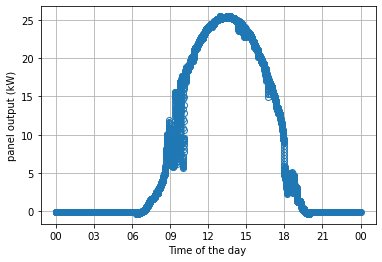

plotting for date 20180425


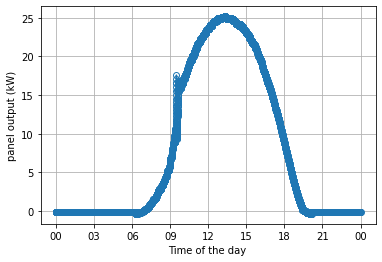

plotting for date 20180426


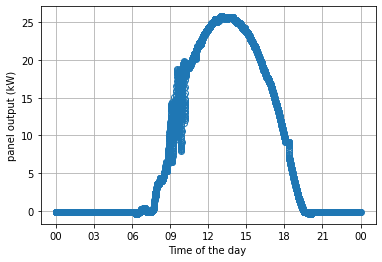

plotting for date 20180427


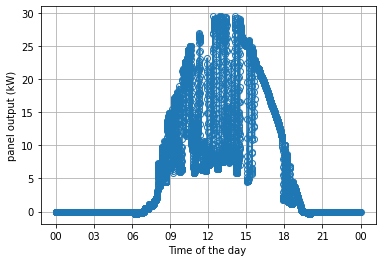

plotting for date 20180428


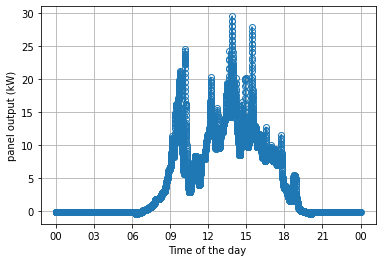

plotting for date 20180429


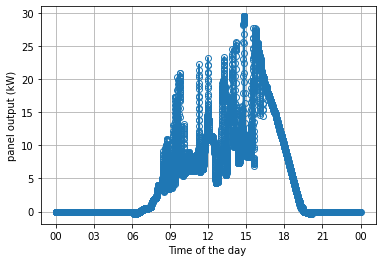

plotting for date 20180430


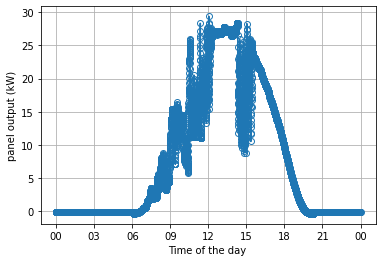

plotting for date 20180501


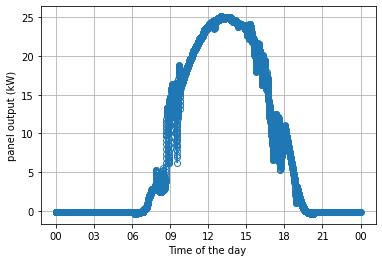

plotting for date 20180502


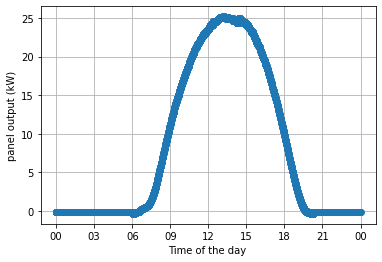

plotting for date 20180503


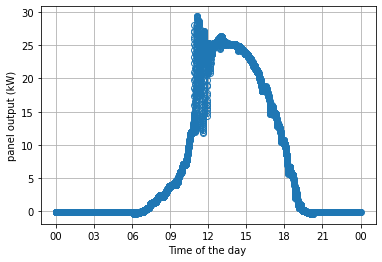

plotting for date 20180504


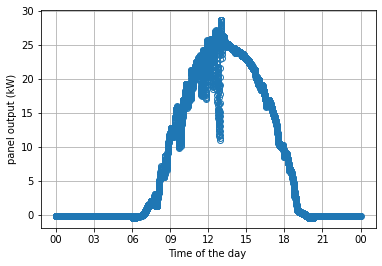

plotting for date 20180505


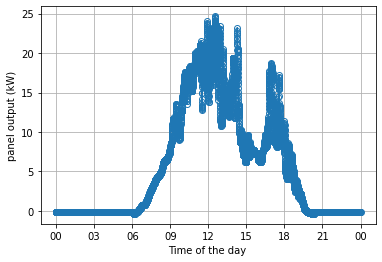

plotting for date 20180506


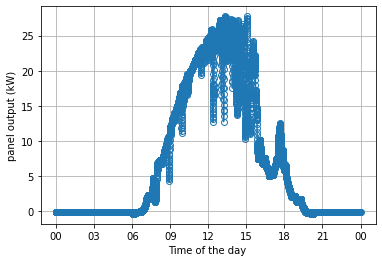

plotting for date 20180507


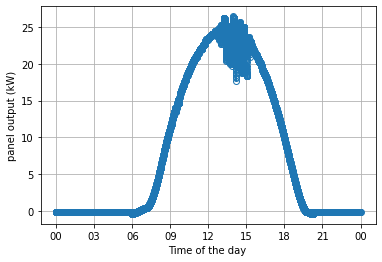

plotting for date 20180508


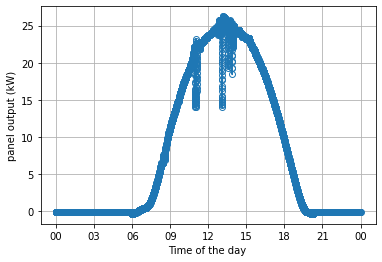

plotting for date 20180509


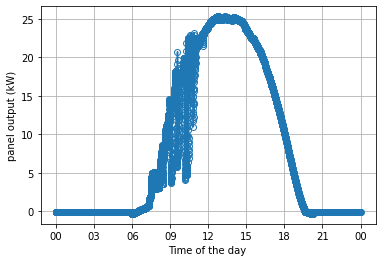

plotting for date 20180510


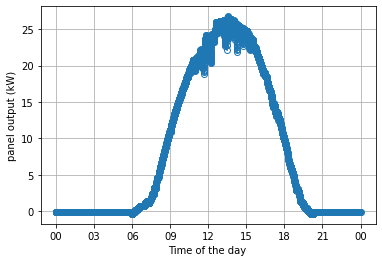

plotting for date 20180511


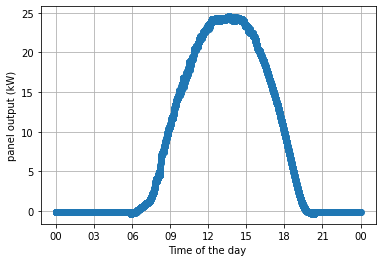

plotting for date 20180512


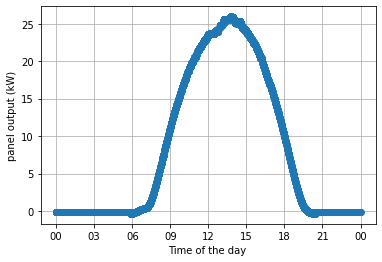

plotting for date 20180513


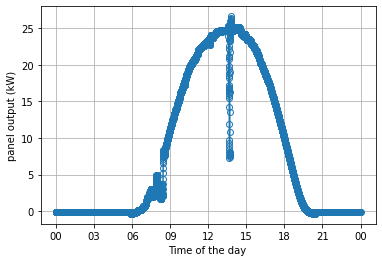

plotting for date 20180514


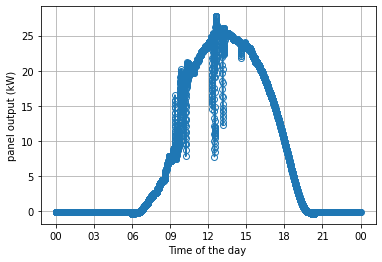

plotting for date 20180515


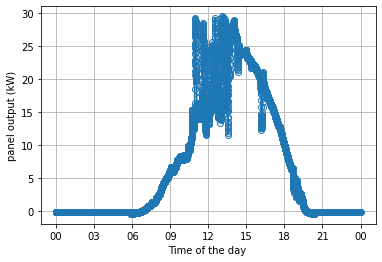

plotting for date 20180516


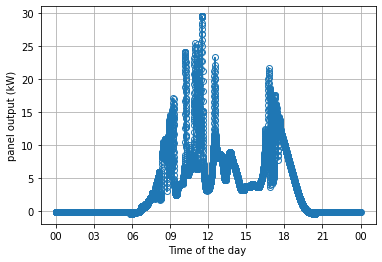

plotting for date 20180517


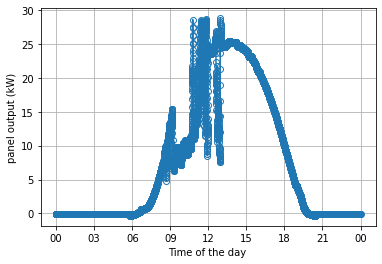

plotting for date 20180518


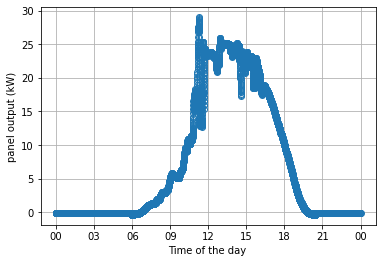

plotting for date 20180519


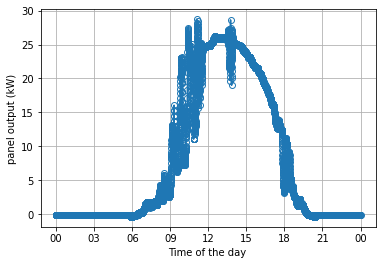

plotting for date 20180520


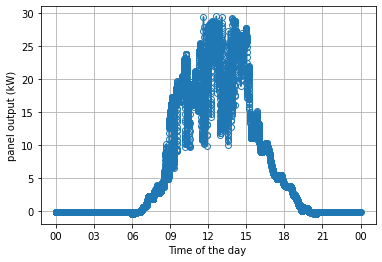

plotting for date 20180521


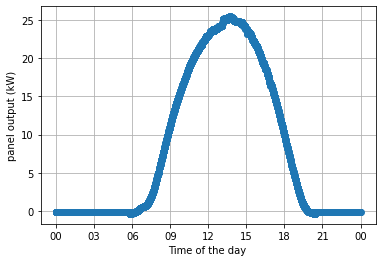

plotting for date 20180522


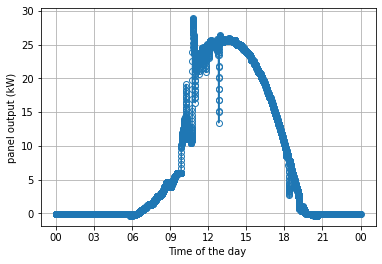

plotting for date 20180523


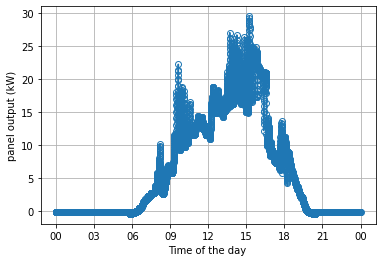

plotting for date 20180524


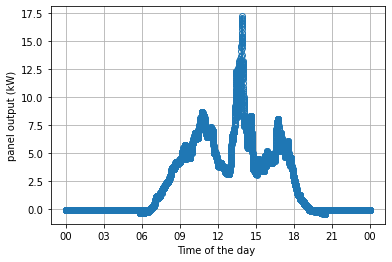

plotting for date 20180525


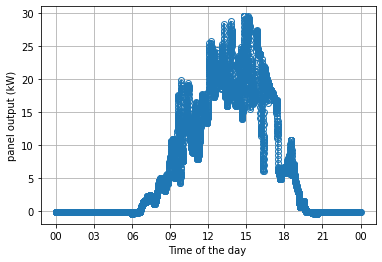

plotting for date 20180526


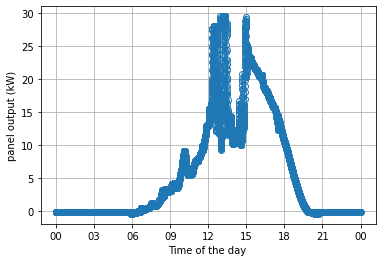

plotting for date 20180527


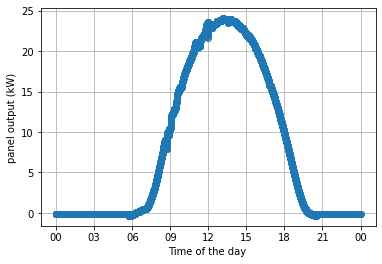

plotting for date 20180528


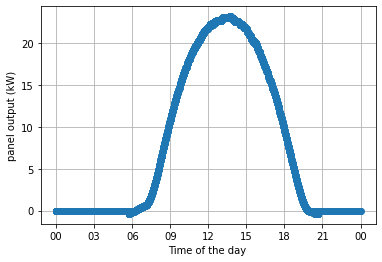

plotting for date 20180529


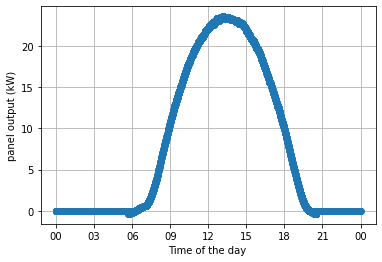

plotting for date 20180530


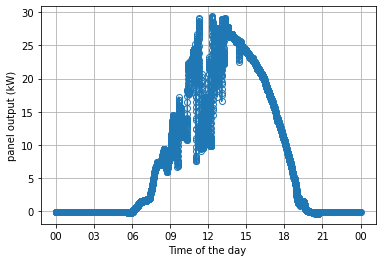

plotting for date 20180531


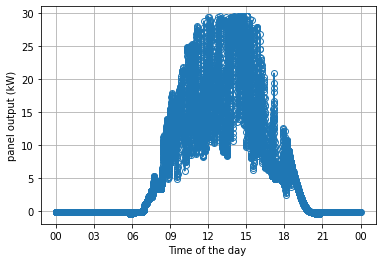

plotting for date 20180601


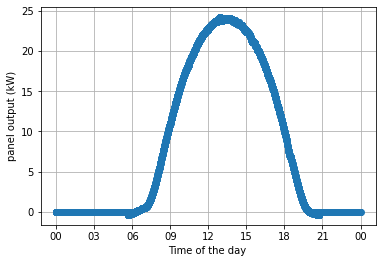

plotting for date 20180602


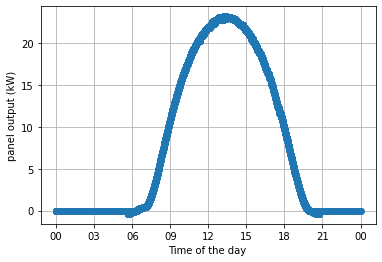

plotting for date 20180603


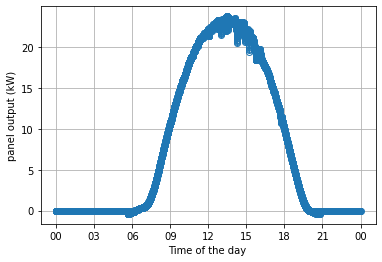

plotting for date 20180604


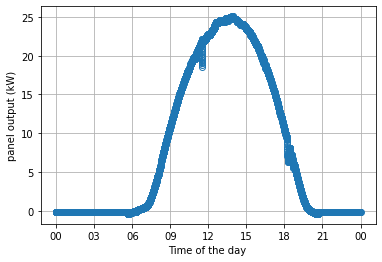

plotting for date 20180605


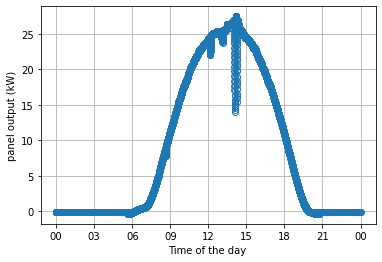

plotting for date 20180606


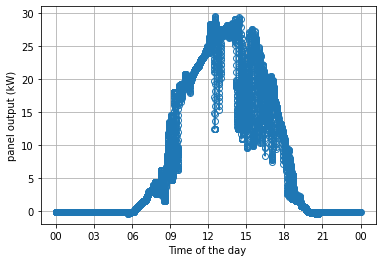

plotting for date 20180607


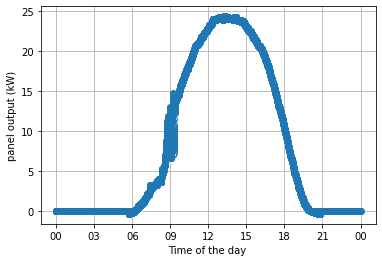

plotting for date 20180608


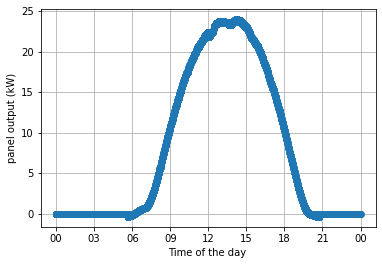

plotting for date 20180609


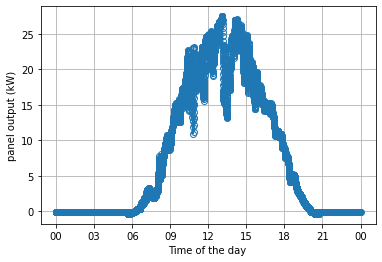

plotting for date 20180610


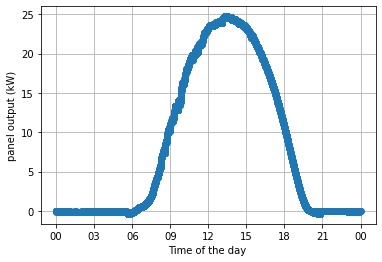

plotting for date 20180611


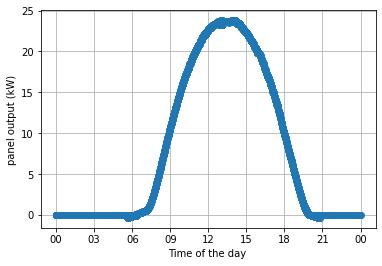

plotting for date 20180612


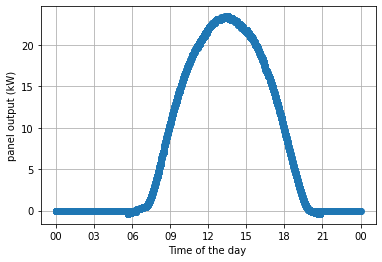

plotting for date 20180613


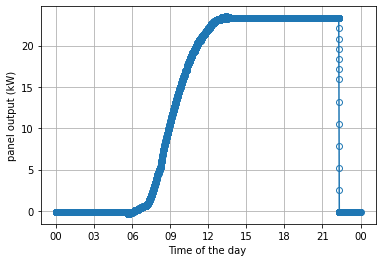

plotting for date 20180614


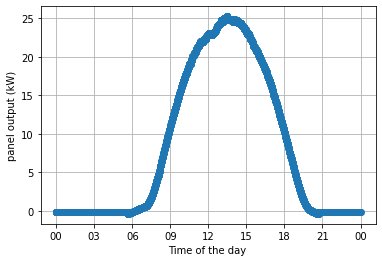

plotting for date 20180615


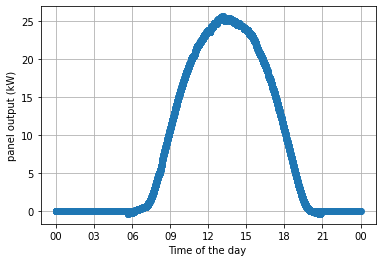

plotting for date 20180616


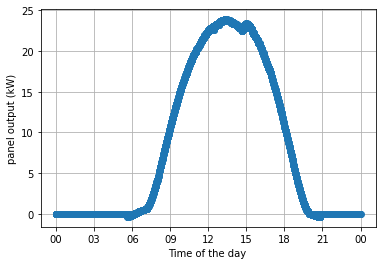

plotting for date 20180617


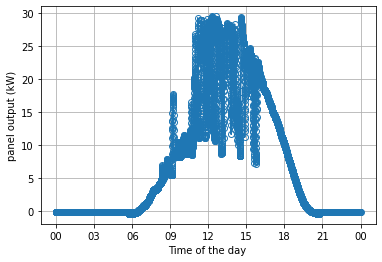

plotting for date 20180618


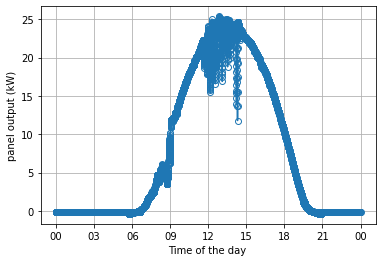

plotting for date 20180619


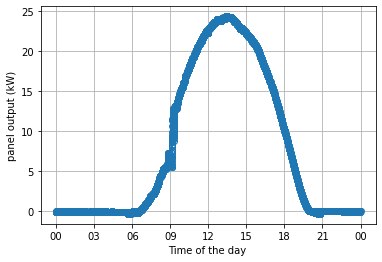

plotting for date 20180620


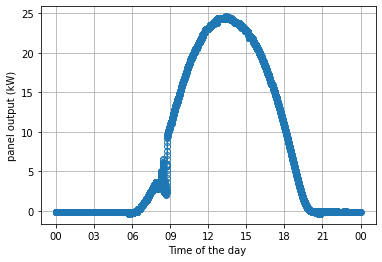

plotting for date 20180621


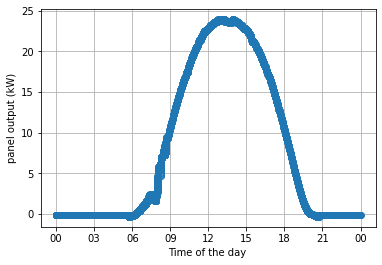

plotting for date 20180622


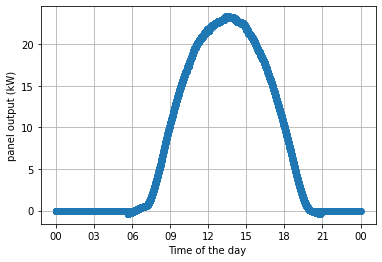

plotting for date 20180623


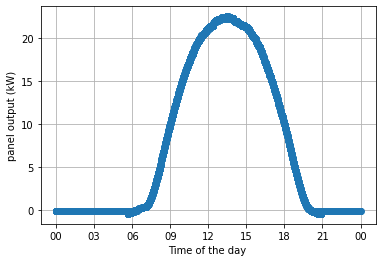

plotting for date 20180624


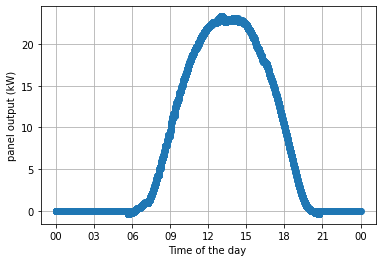

plotting for date 20180625


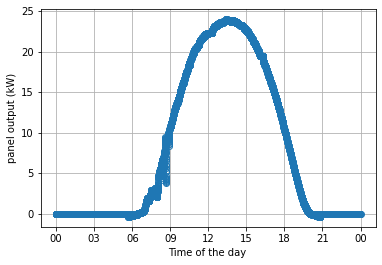

plotting for date 20180626


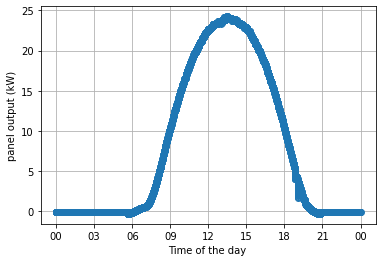

plotting for date 20180627


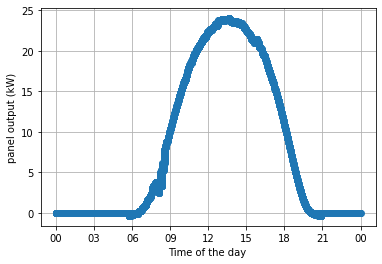

plotting for date 20180628


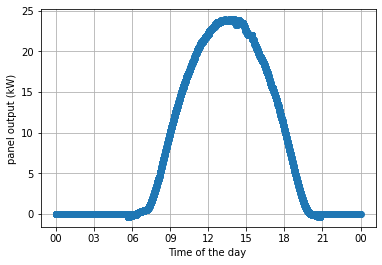

plotting for date 20180629


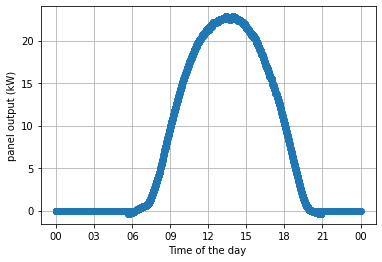

plotting for date 20180630


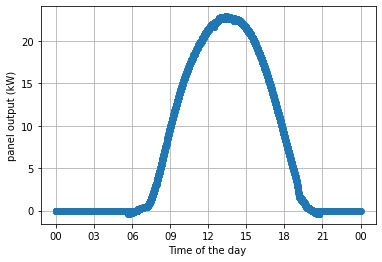

plotting for date 20180701


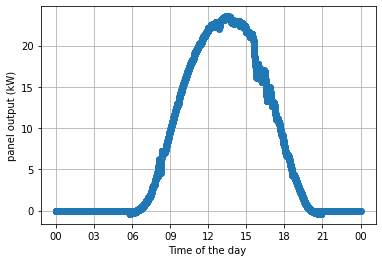

plotting for date 20180702


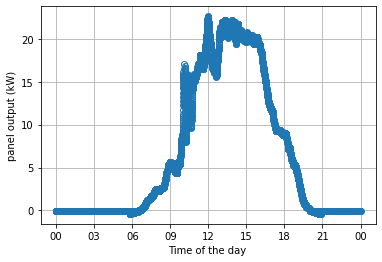

plotting for date 20180703


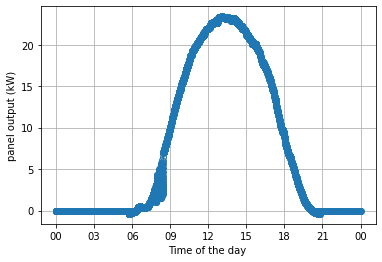

plotting for date 20180704


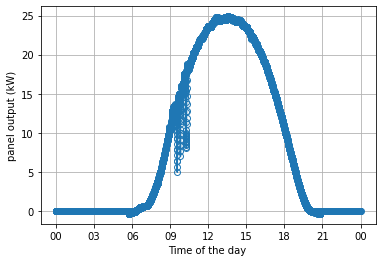

plotting for date 20180705


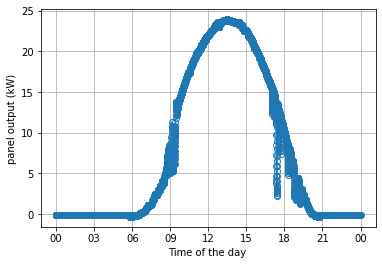

plotting for date 20180706


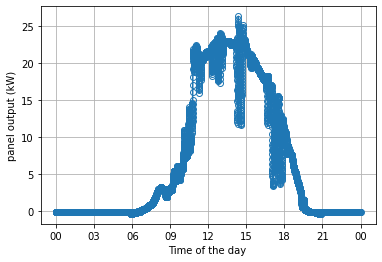

plotting for date 20180707


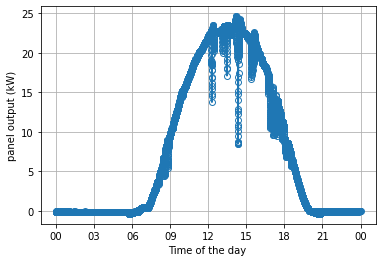

plotting for date 20180708


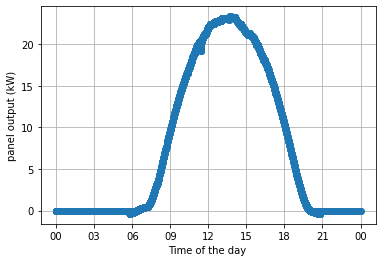

plotting for date 20180709


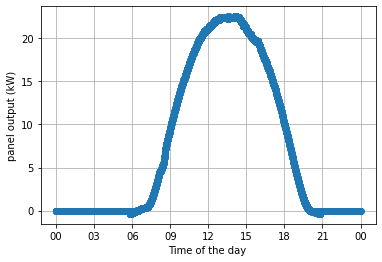

plotting for date 20180710


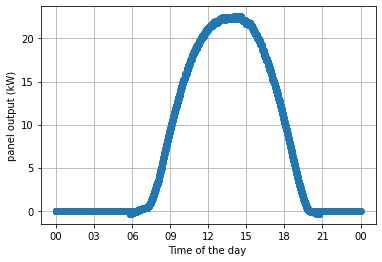

plotting for date 20180711


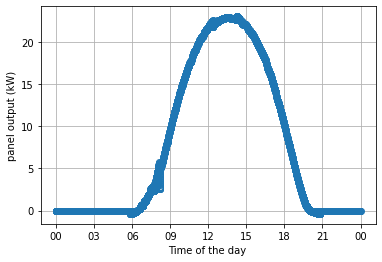

plotting for date 20180712


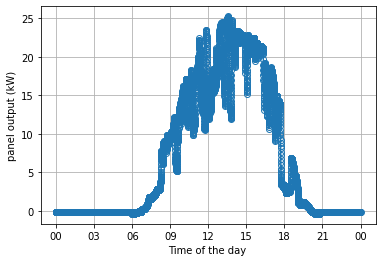

plotting for date 20180713


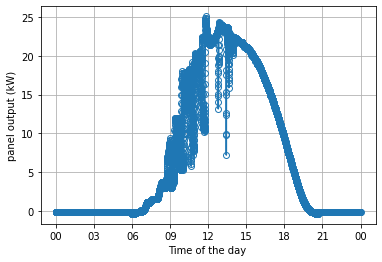

plotting for date 20180714


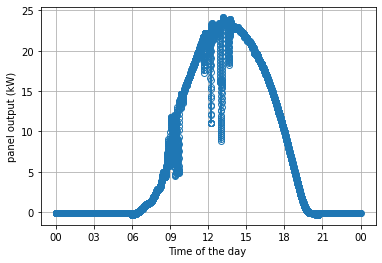

plotting for date 20180715


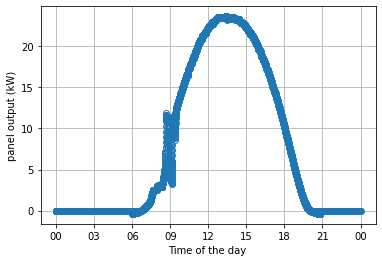

plotting for date 20180716


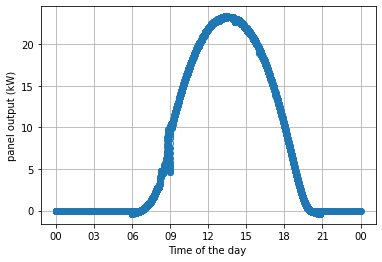

plotting for date 20180717


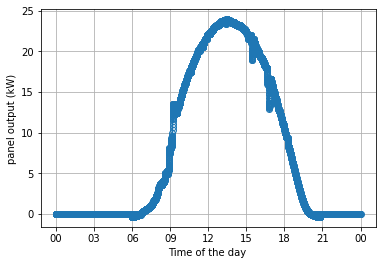

plotting for date 20180718


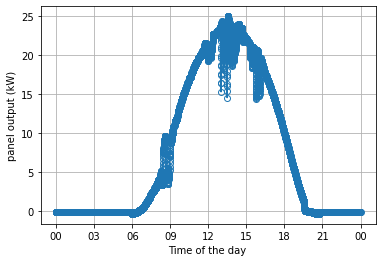

plotting for date 20180719


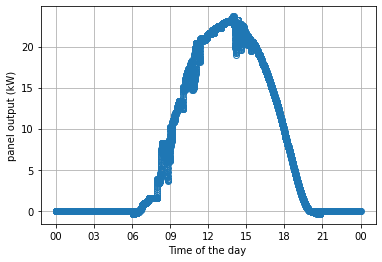

plotting for date 20180720


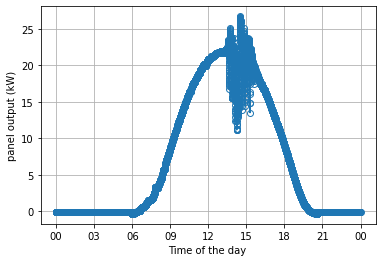

plotting for date 20180721


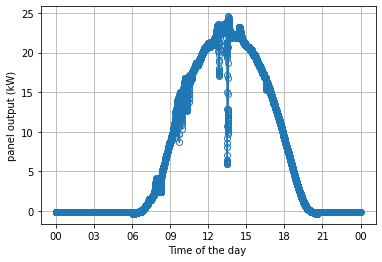

plotting for date 20180722


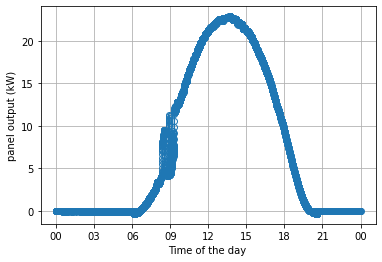

plotting for date 20180723


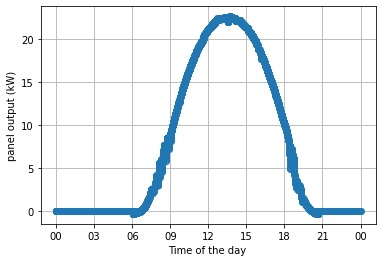

plotting for date 20180724


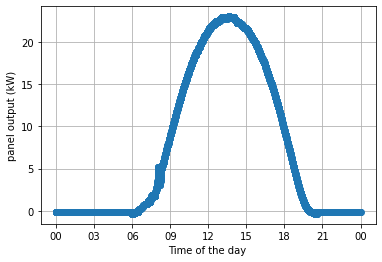

plotting for date 20180725


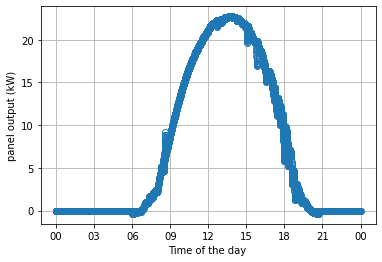

plotting for date 20180726


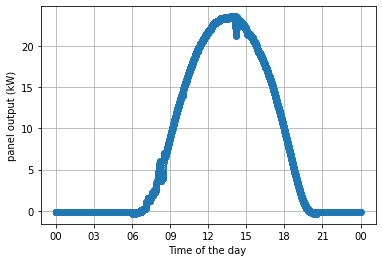

plotting for date 20180727


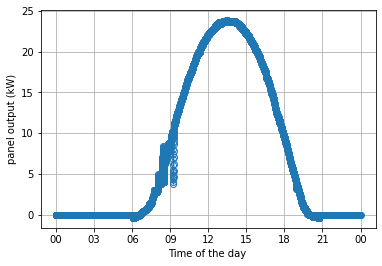

plotting for date 20180728


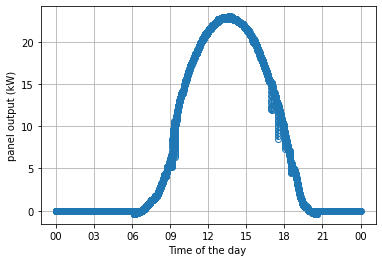

plotting for date 20180729


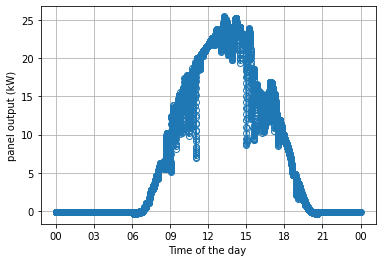

plotting for date 20180730


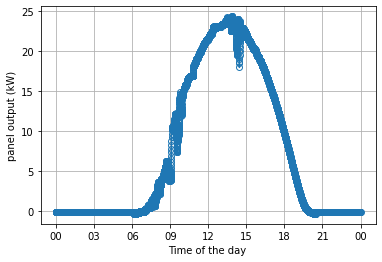

plotting for date 20180731


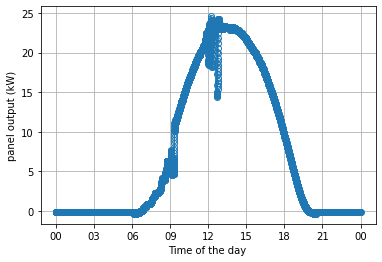

plotting for date 20180801


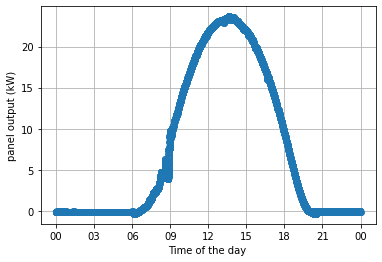

plotting for date 20180802


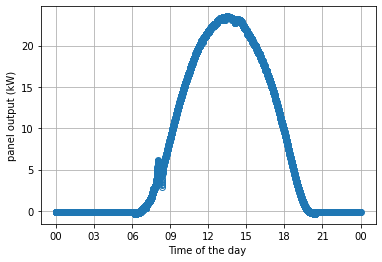

plotting for date 20180803


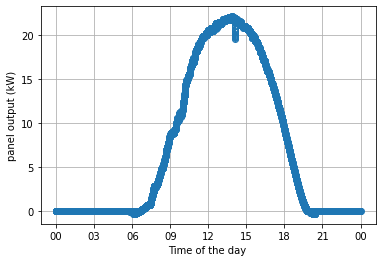

plotting for date 20180804


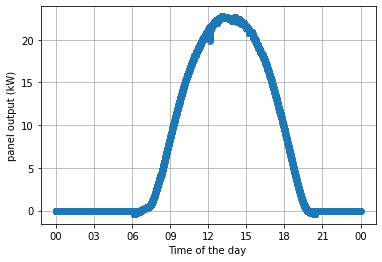

plotting for date 20180805


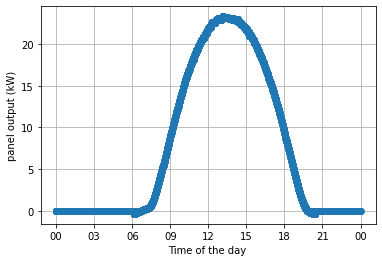

plotting for date 20180806


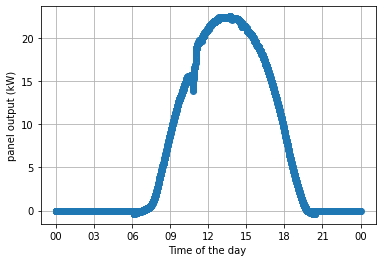

plotting for date 20180807


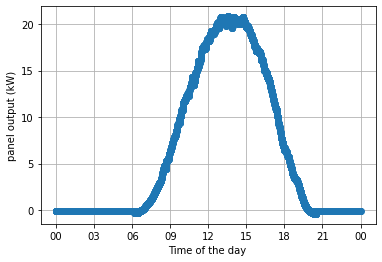

plotting for date 20180808


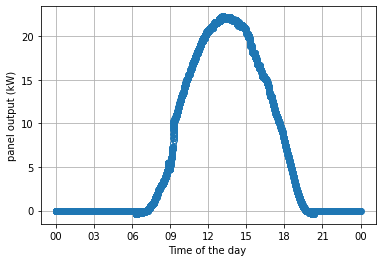

plotting for date 20180809


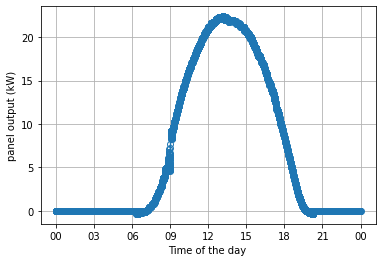

plotting for date 20180810


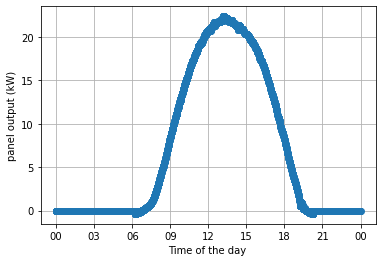

plotting for date 20180811


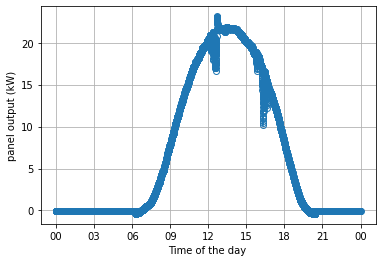

plotting for date 20180812


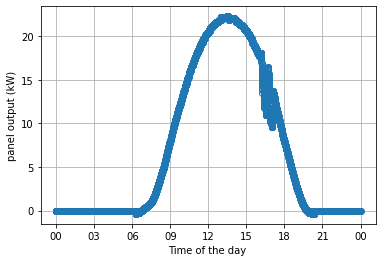

plotting for date 20180813


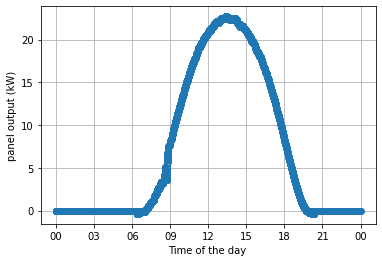

plotting for date 20180814


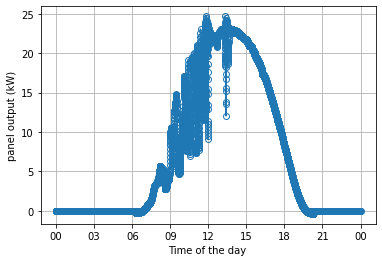

plotting for date 20180815


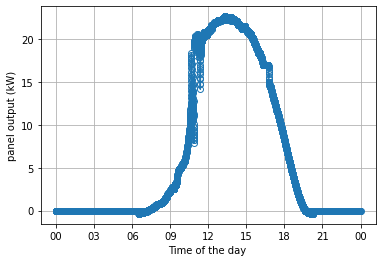

plotting for date 20180816


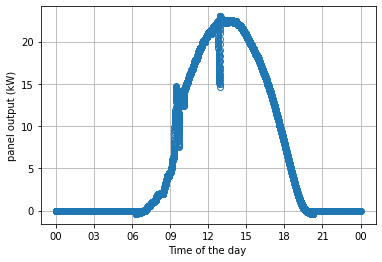

plotting for date 20180817


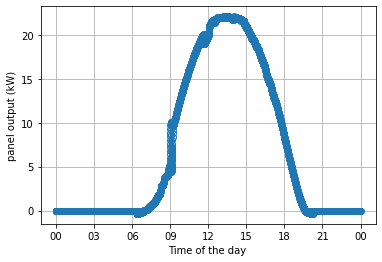

plotting for date 20180818


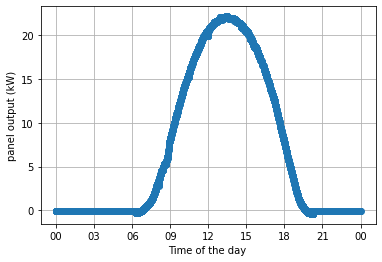

plotting for date 20180819


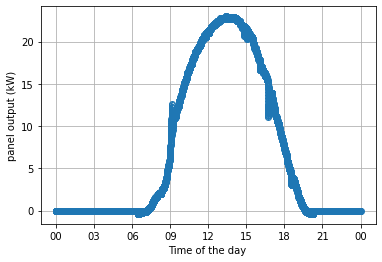

plotting for date 20180820


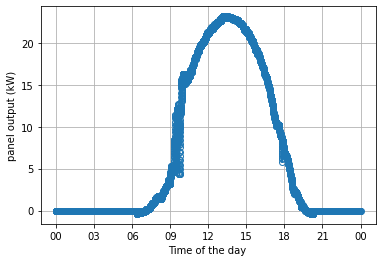

plotting for date 20180821


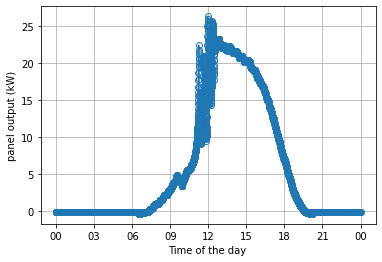

plotting for date 20180822


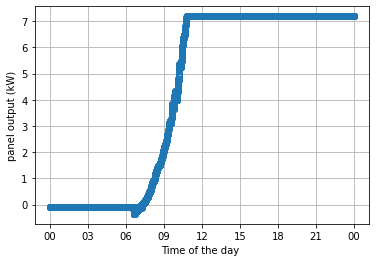

plotting for date 20180823


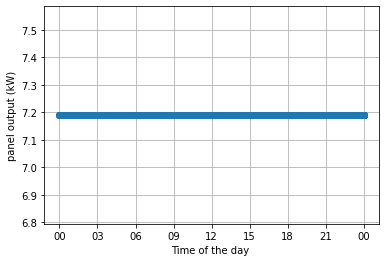

plotting for date 20180824


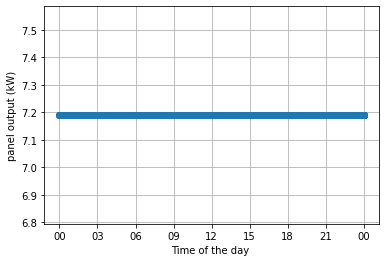

plotting for date 20180825


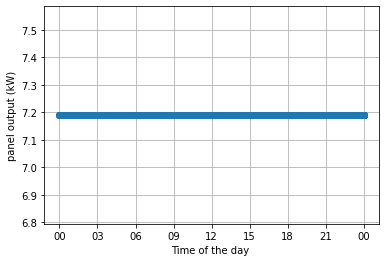

plotting for date 20180826


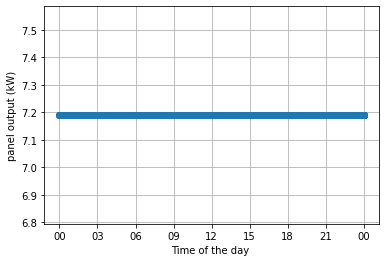

plotting for date 20180827


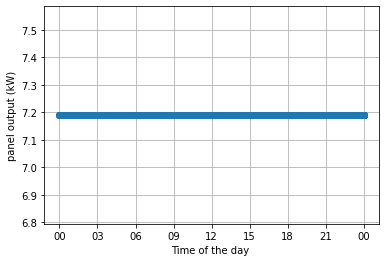

plotting for date 20180828


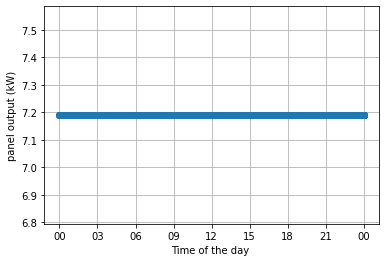

plotting for date 20180829


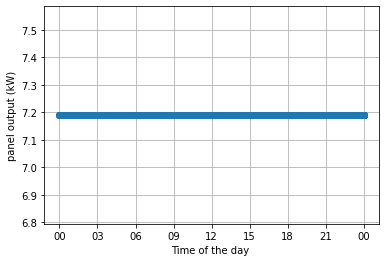

plotting for date 20180830


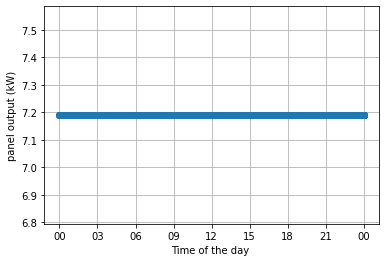

plotting for date 20180831


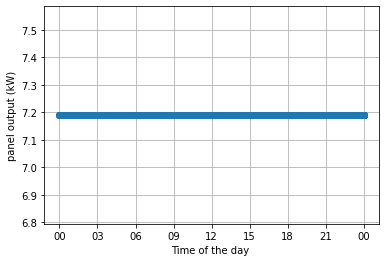

plotting for date 20180901


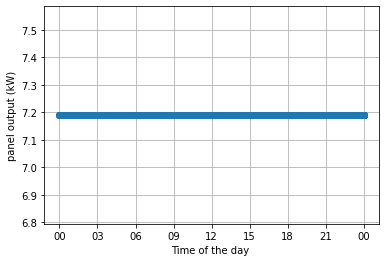

plotting for date 20180902


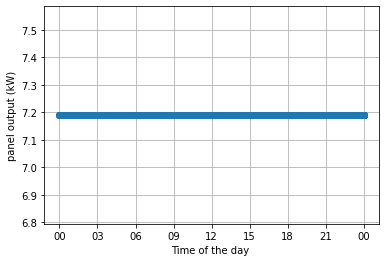

plotting for date 20180903


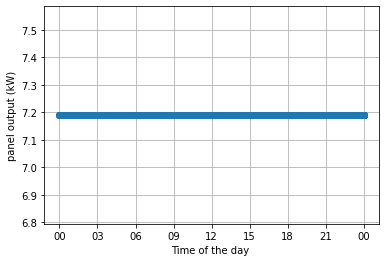

plotting for date 20180904


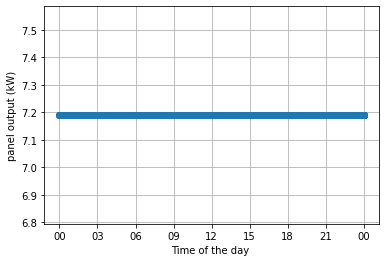

plotting for date 20180905


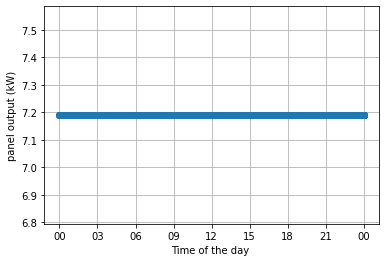

plotting for date 20180906


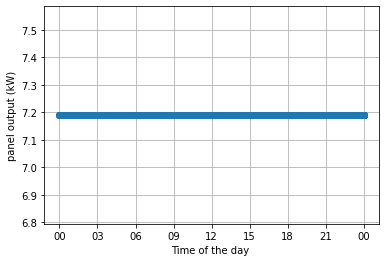

plotting for date 20180907


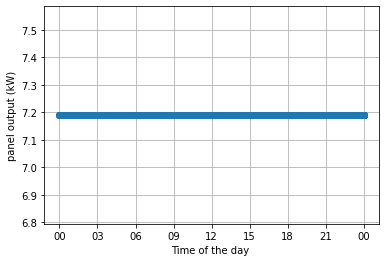

plotting for date 20180908


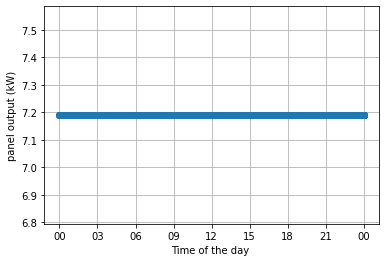

plotting for date 20180909


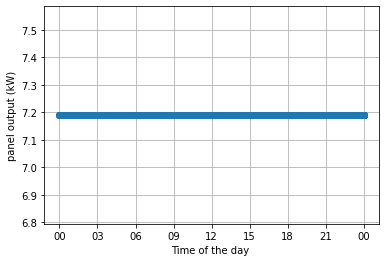

plotting for date 20180910


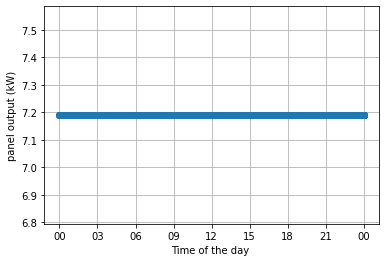

plotting for date 20180911


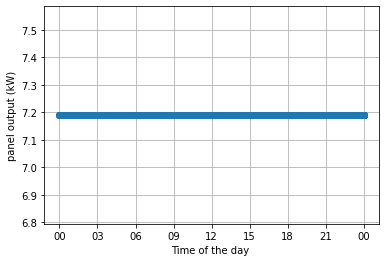

plotting for date 20180912


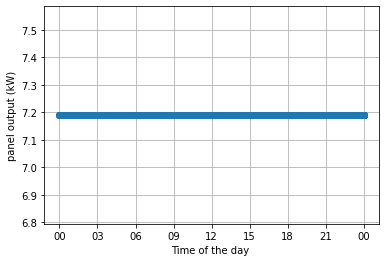

plotting for date 20180913


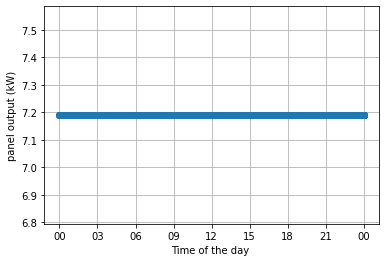

plotting for date 20180914


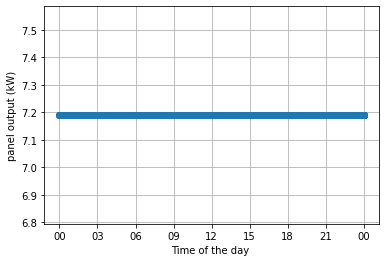

plotting for date 20180915


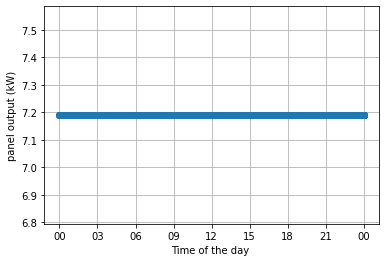

plotting for date 20180916


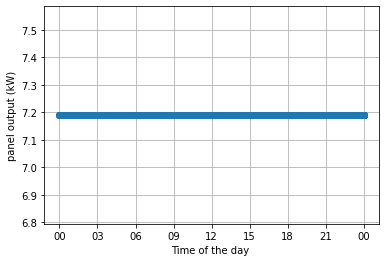

plotting for date 20180917


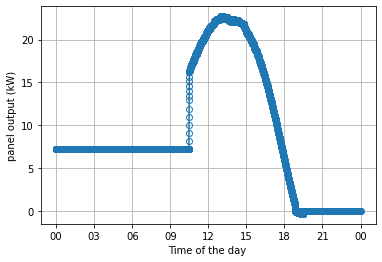

plotting for date 20180918


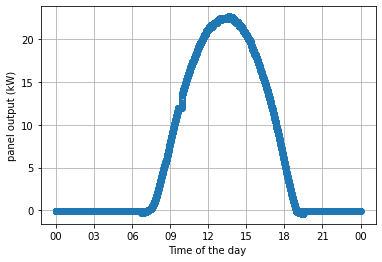

plotting for date 20180919


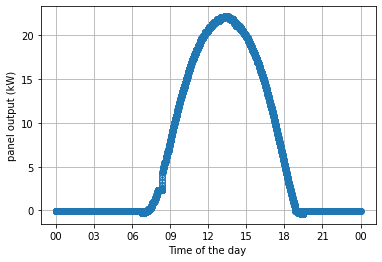

plotting for date 20180920


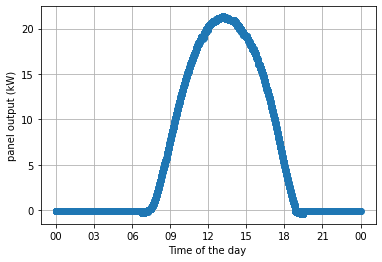

plotting for date 20180921


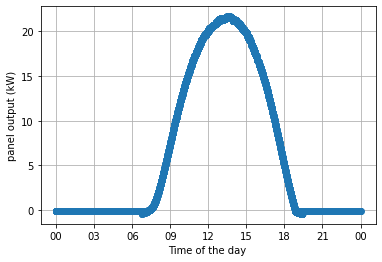

plotting for date 20180922


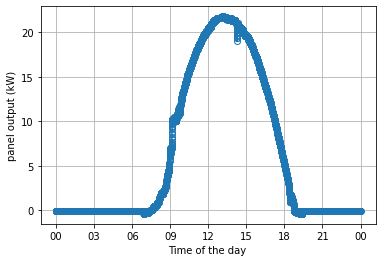

plotting for date 20180923


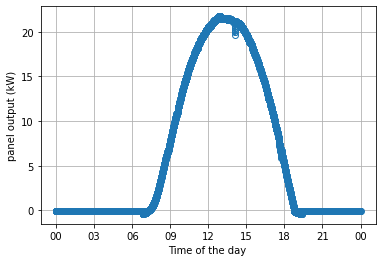

plotting for date 20180924


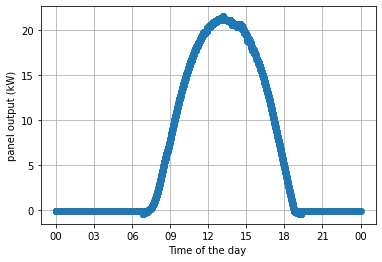

plotting for date 20180925


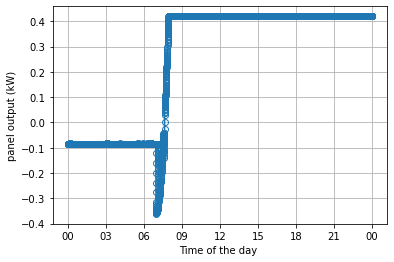

plotting for date 20180926


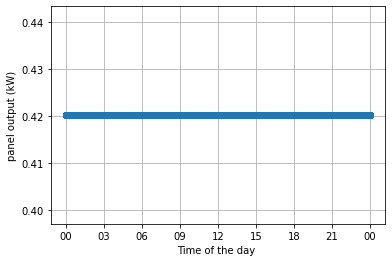

plotting for date 20180927


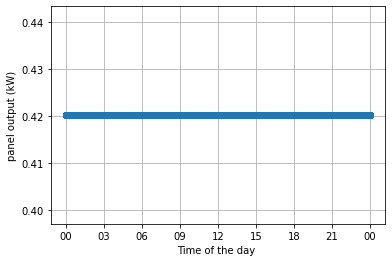

plotting for date 20180928


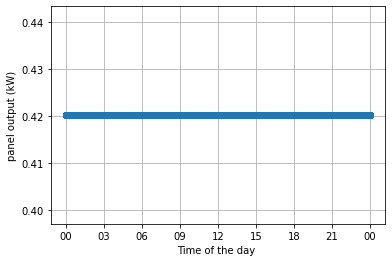

plotting for date 20180929


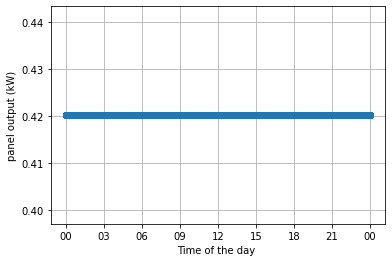

plotting for date 20180930


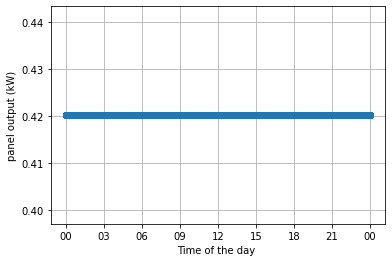

plotting for date 20181001


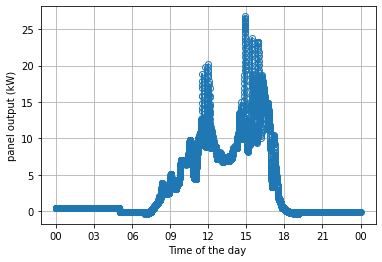

plotting for date 20181002


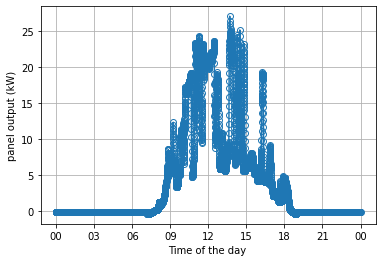

plotting for date 20181003


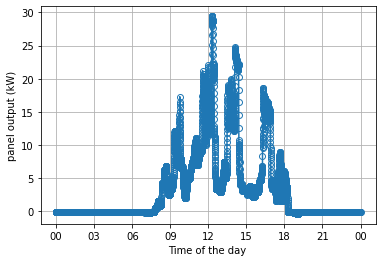

plotting for date 20181004


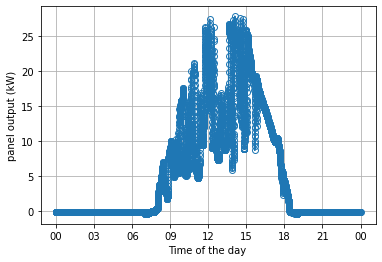

plotting for date 20181005


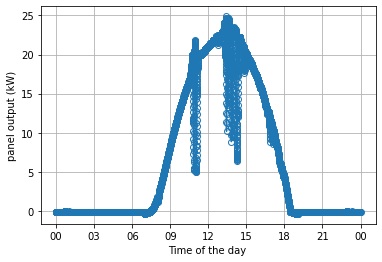

plotting for date 20181006


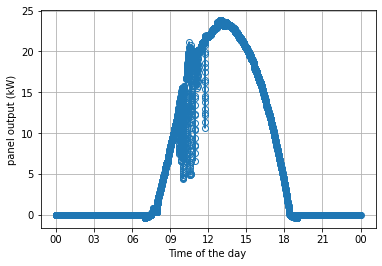

plotting for date 20181007


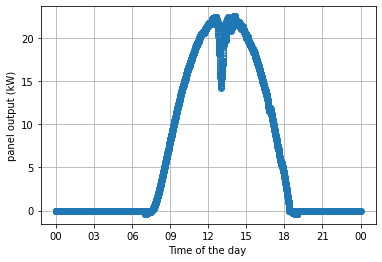

plotting for date 20181008


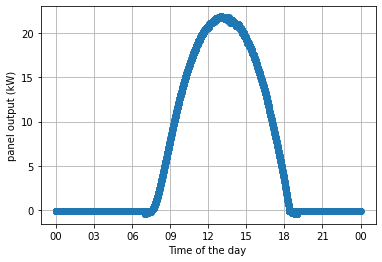

plotting for date 20181009


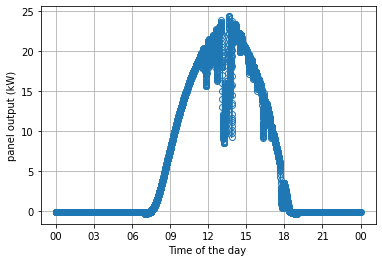

plotting for date 20181010


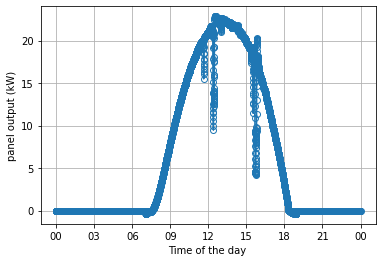

plotting for date 20181011


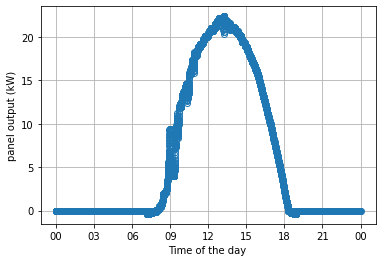

plotting for date 20181012


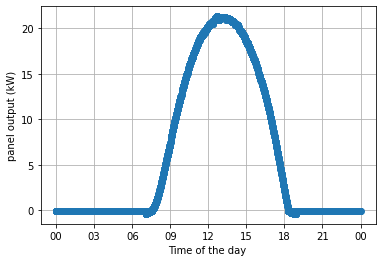

plotting for date 20181013


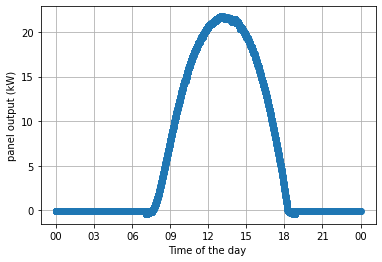

plotting for date 20181014


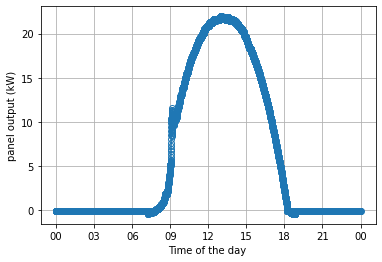

plotting for date 20181015


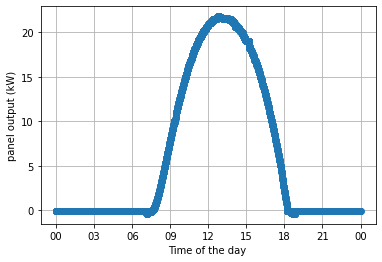

plotting for date 20181016


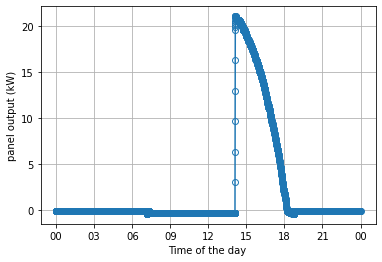

plotting for date 20181017


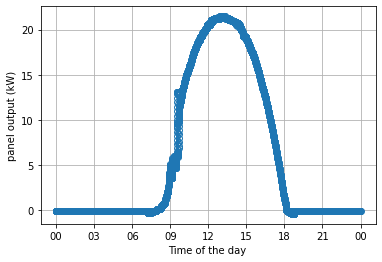

plotting for date 20181018


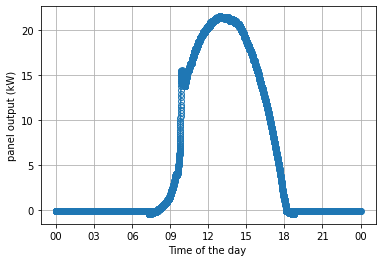

plotting for date 20181019


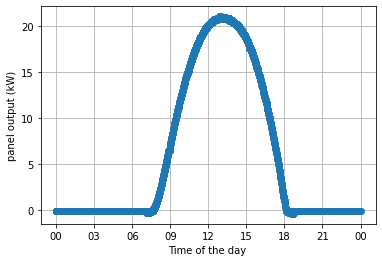

plotting for date 20181020


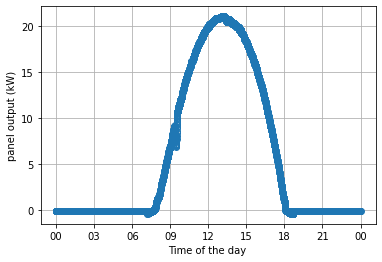

plotting for date 20181021


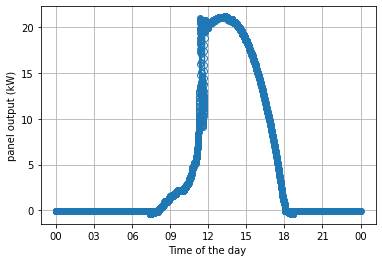

plotting for date 20181022


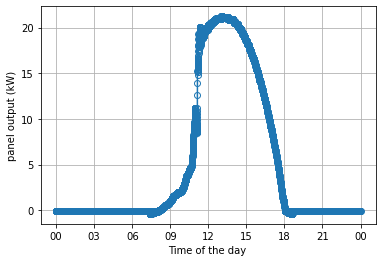

plotting for date 20181023


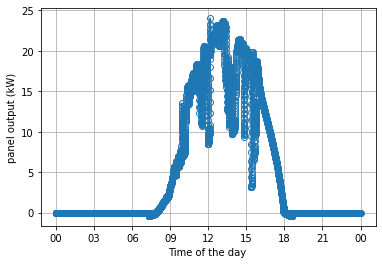

plotting for date 20181024


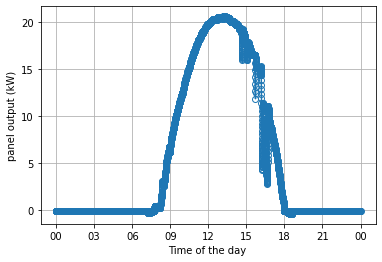

plotting for date 20181025


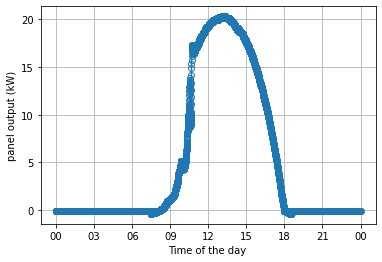

plotting for date 20181026


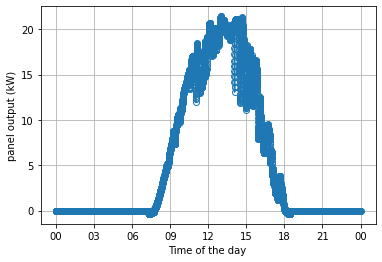

plotting for date 20181027


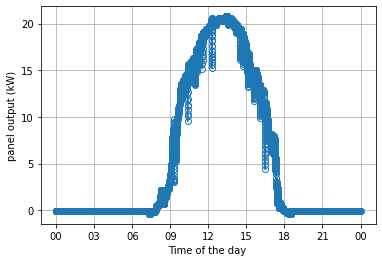

plotting for date 20181028


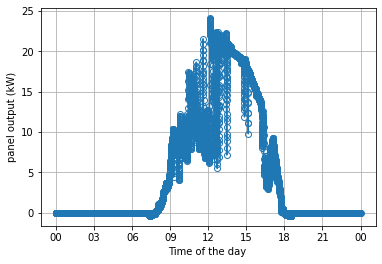

plotting for date 20181029


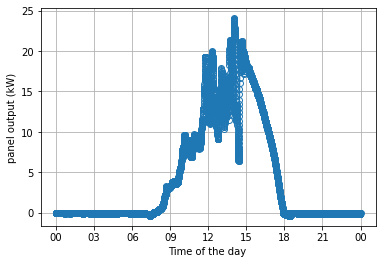

plotting for date 20181030


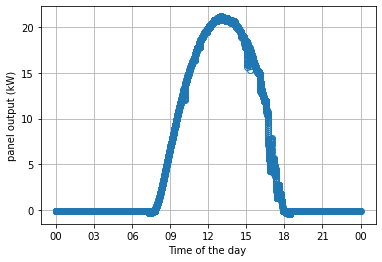

plotting for date 20181031


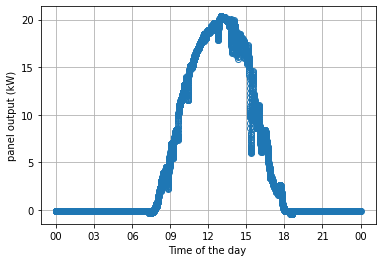

plotting for date 20181101


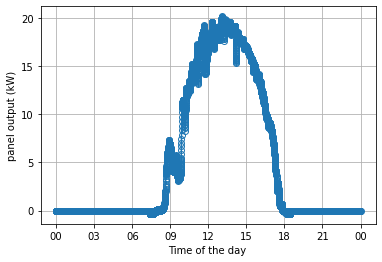

plotting for date 20181102


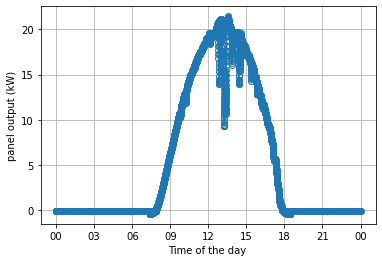

plotting for date 20181103


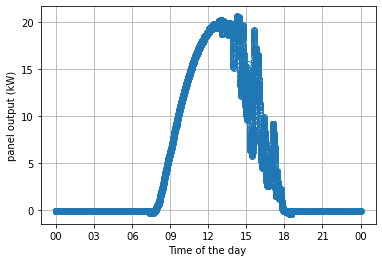

plotting for date 20181104


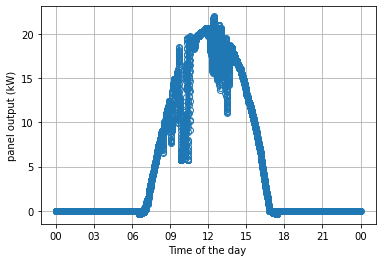

plotting for date 20181105


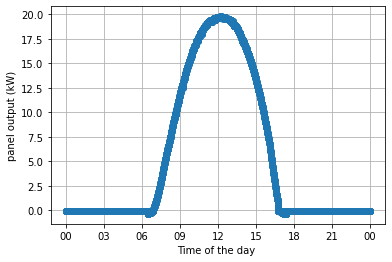

plotting for date 20181106


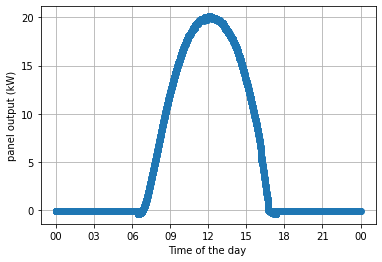

plotting for date 20181107


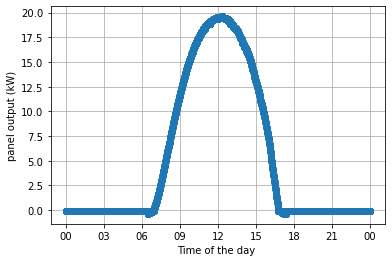

plotting for date 20181108


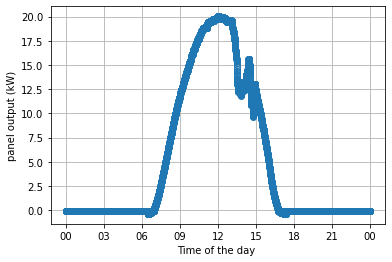

plotting for date 20181109


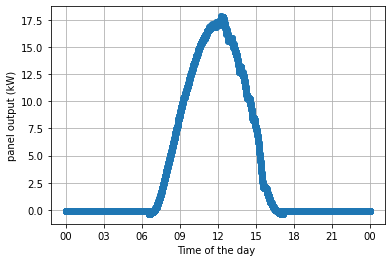

plotting for date 20181110


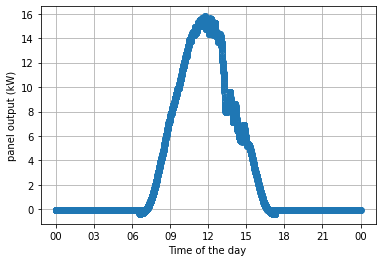

plotting for date 20181111


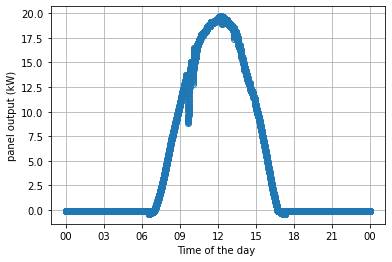

plotting for date 20181112


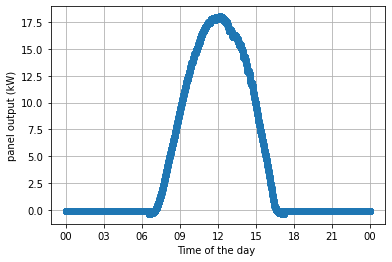

plotting for date 20181113


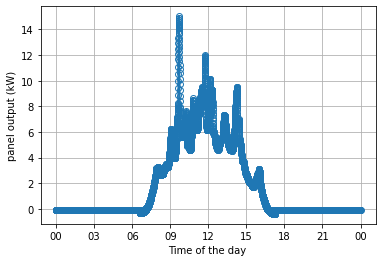

plotting for date 20181114


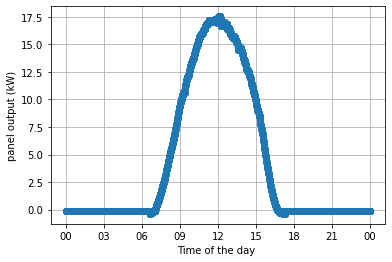

plotting for date 20181115


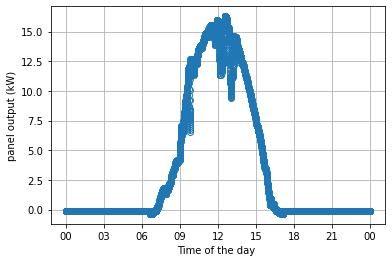

plotting for date 20181116


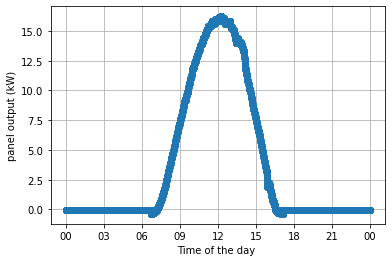

plotting for date 20181117


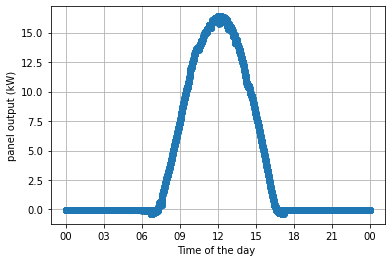

plotting for date 20181118


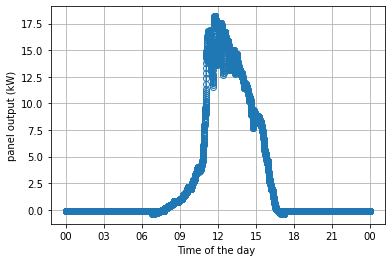

plotting for date 20181119


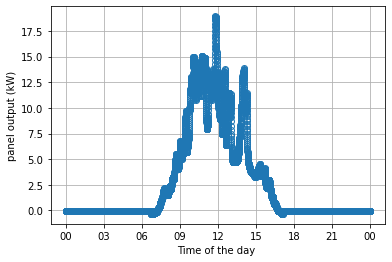

plotting for date 20181120


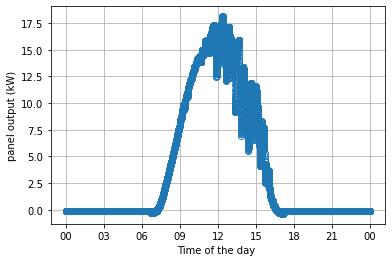

plotting for date 20181121


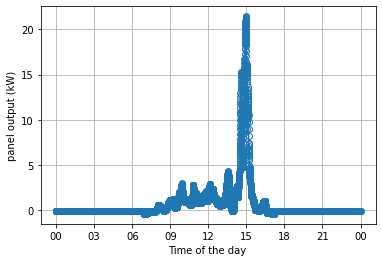

plotting for date 20181122


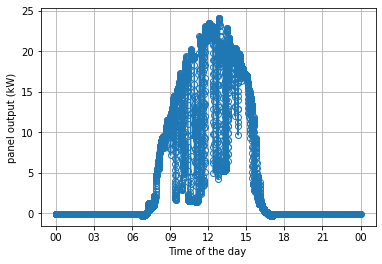

plotting for date 20181123


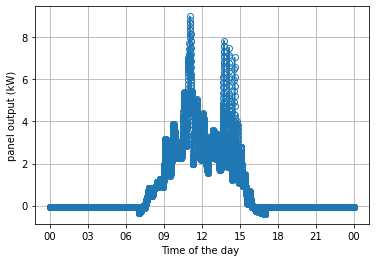

plotting for date 20181124


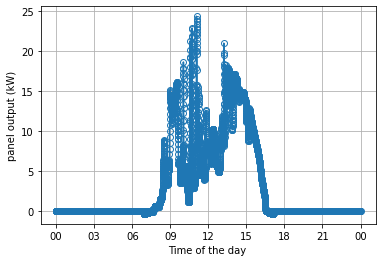

plotting for date 20181125


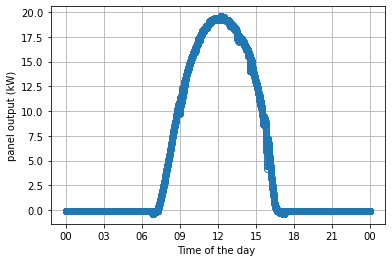

plotting for date 20181126


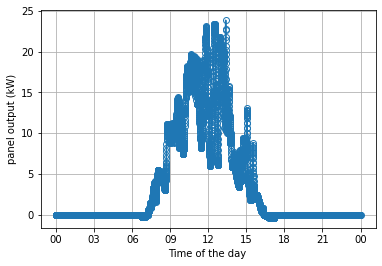

plotting for date 20181127


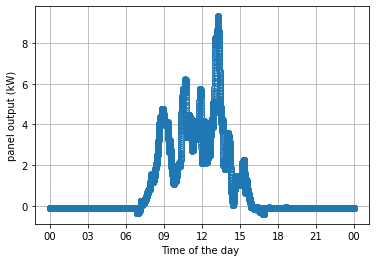

plotting for date 20181128


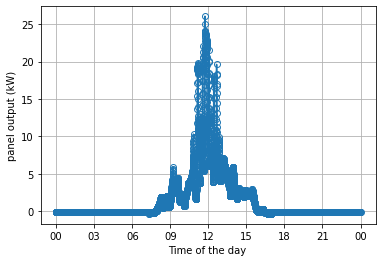

plotting for date 20181129


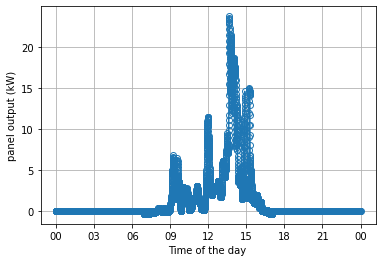

plotting for date 20181130


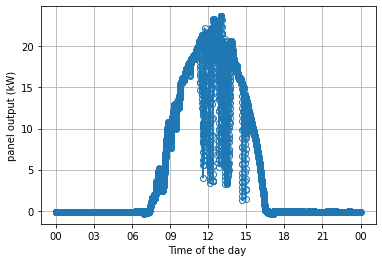

plotting for date 20181201


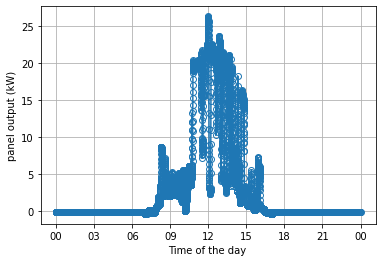

plotting for date 20181202


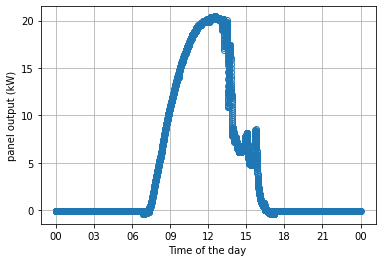

plotting for date 20181203


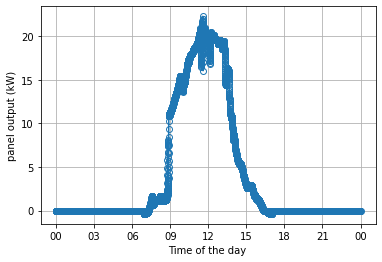

plotting for date 20181204


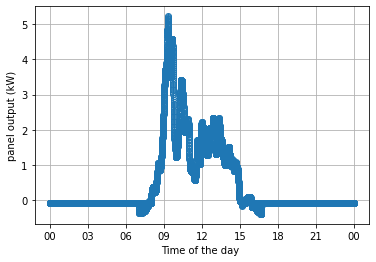

plotting for date 20181205


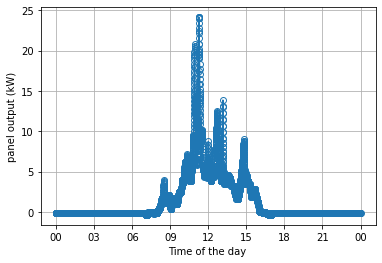

plotting for date 20181206


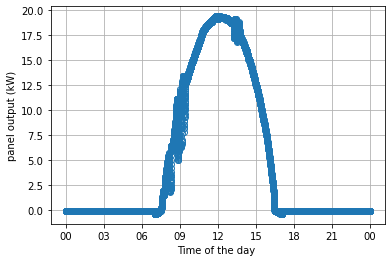

plotting for date 20181207


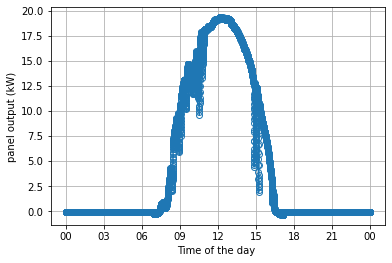

plotting for date 20181208


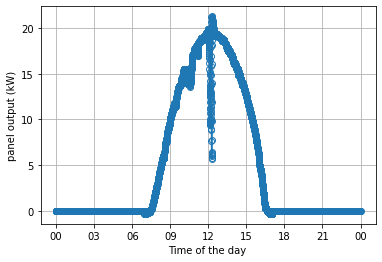

plotting for date 20181209


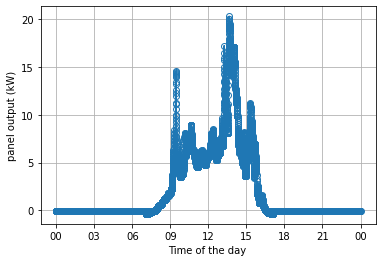

plotting for date 20181210


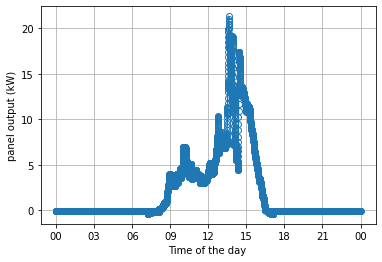

plotting for date 20181211


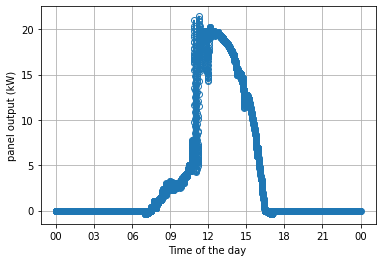

plotting for date 20181212


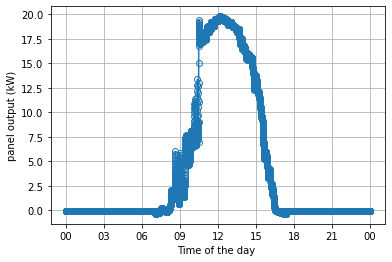

plotting for date 20181213


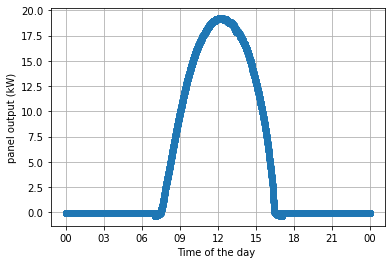

plotting for date 20181214


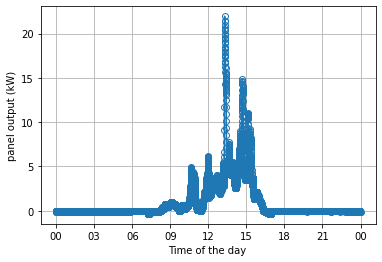

plotting for date 20181215


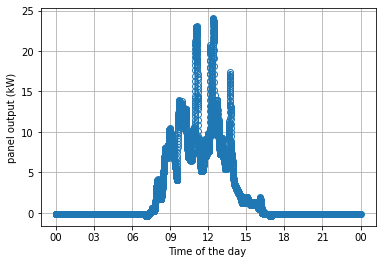

plotting for date 20181216


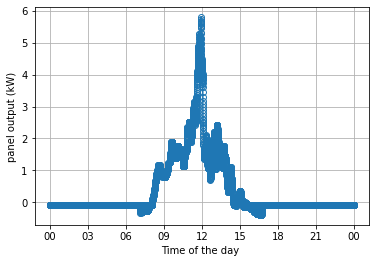

plotting for date 20181217


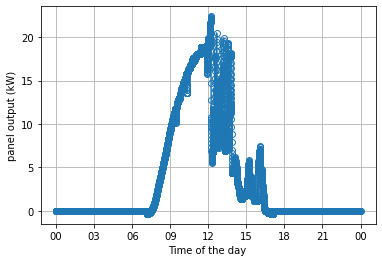

plotting for date 20181218


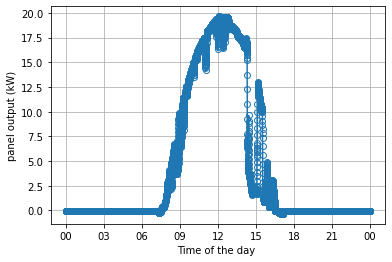

plotting for date 20181219


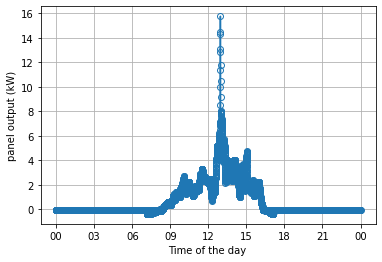

plotting for date 20181220


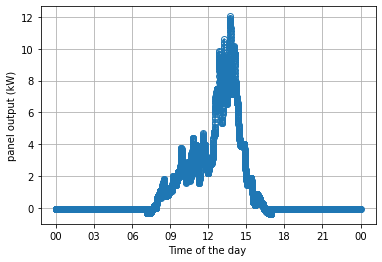

plotting for date 20181221


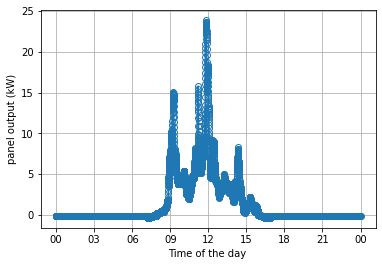

plotting for date 20181222


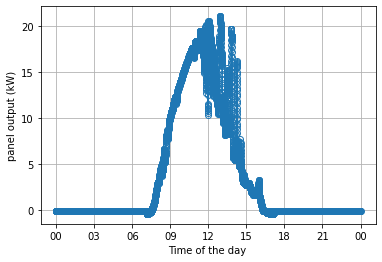

plotting for date 20181223


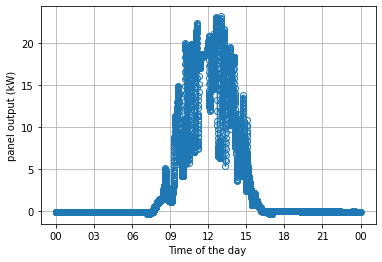

plotting for date 20181224


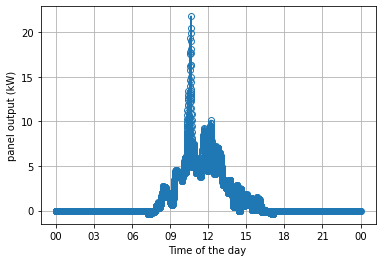

plotting for date 20181225


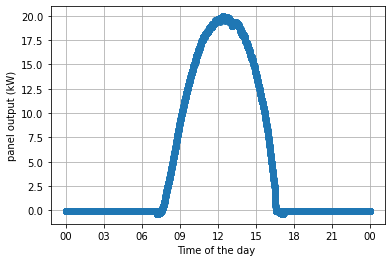

plotting for date 20181226


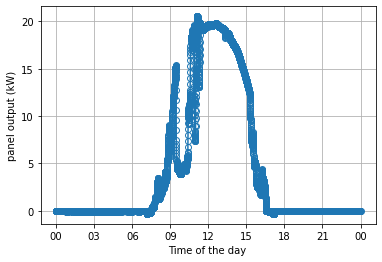

plotting for date 20181227


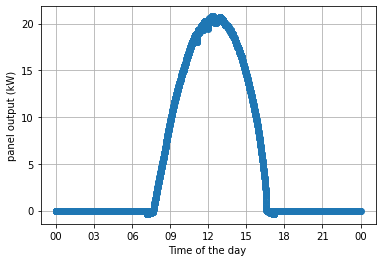

plotting for date 20181228


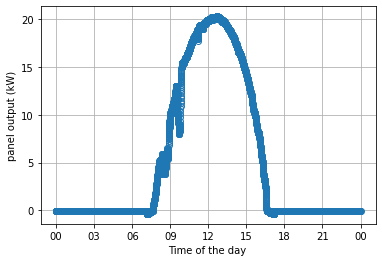

plotting for date 20181229


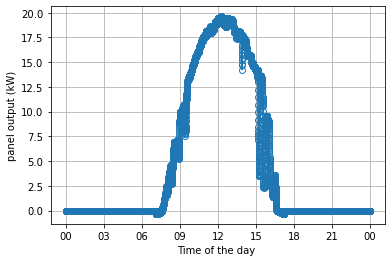

plotting for date 20181230


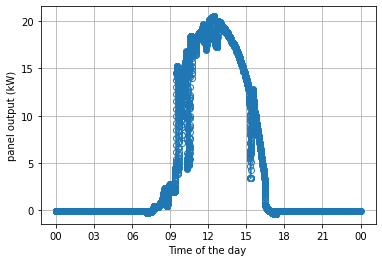

plotting for date 20181231


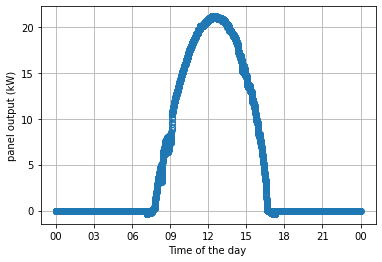

plotting for date 20190101


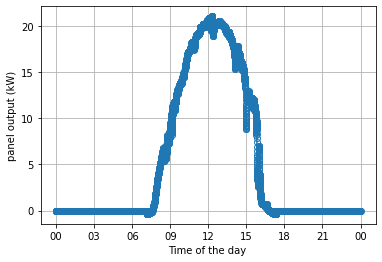

plotting for date 20190102


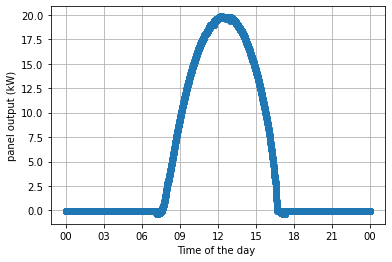

plotting for date 20190103


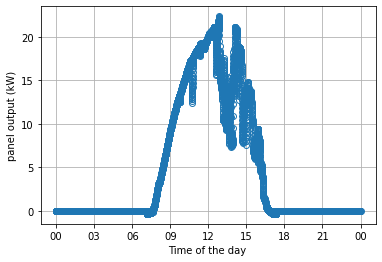

plotting for date 20190104


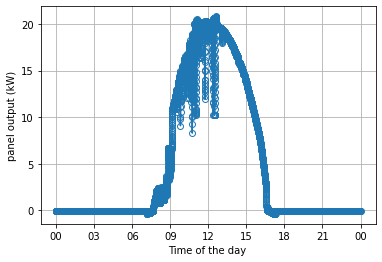

plotting for date 20190105


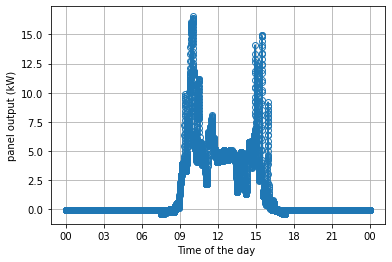

plotting for date 20190106


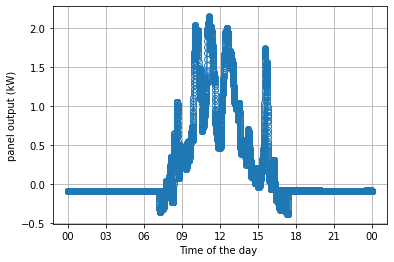

plotting for date 20190107


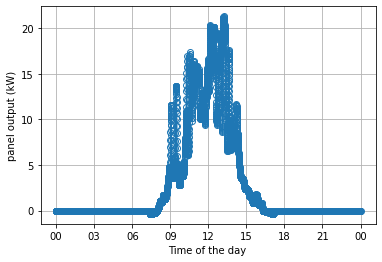

plotting for date 20190108


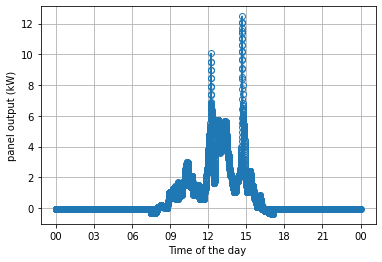

plotting for date 20190109


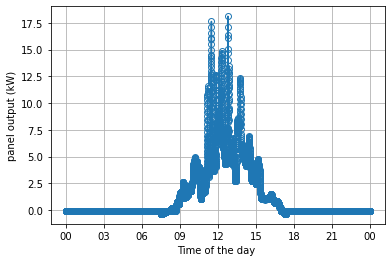

plotting for date 20190110


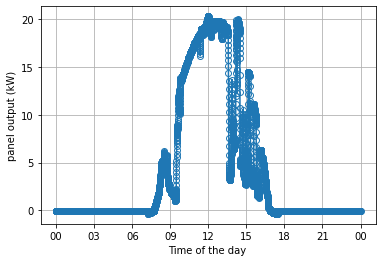

plotting for date 20190111


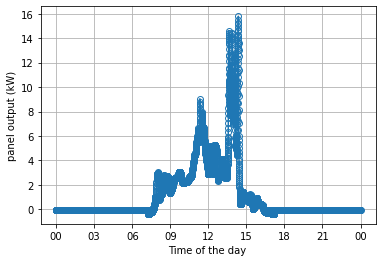

plotting for date 20190112


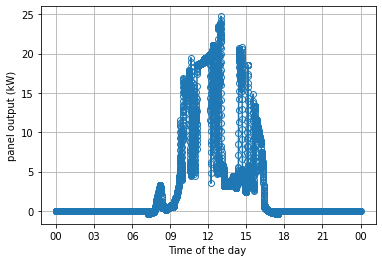

plotting for date 20190113


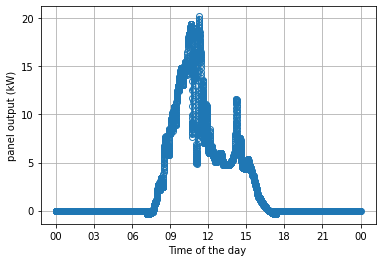

plotting for date 20190114


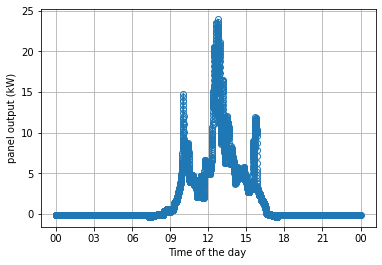

plotting for date 20190115


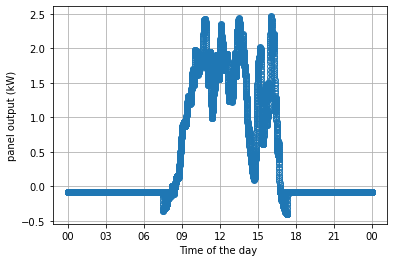

plotting for date 20190116


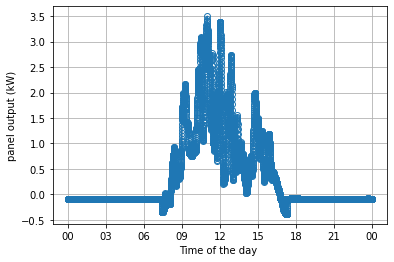

plotting for date 20190117


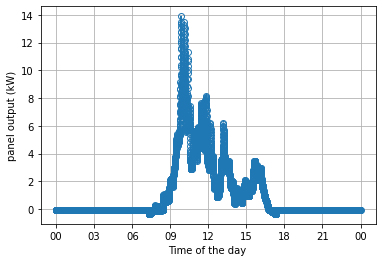

plotting for date 20190118


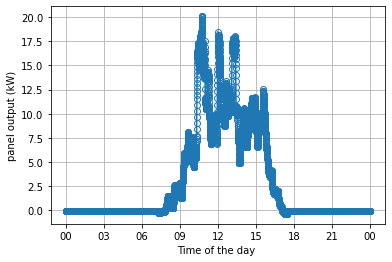

plotting for date 20190119


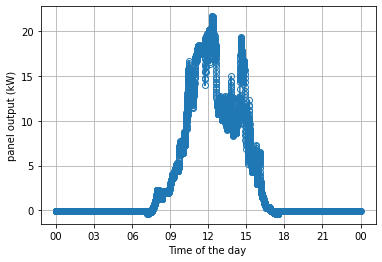

plotting for date 20190120


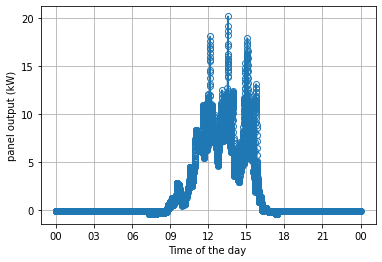

plotting for date 20190121


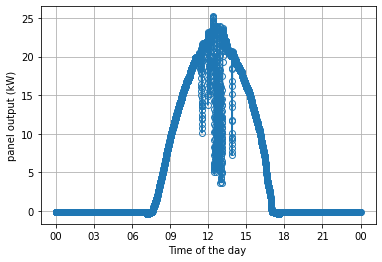

plotting for date 20190122


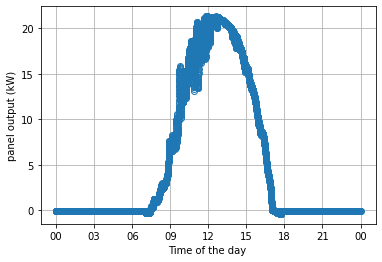

plotting for date 20190123


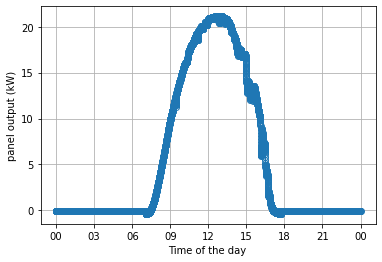

plotting for date 20190124


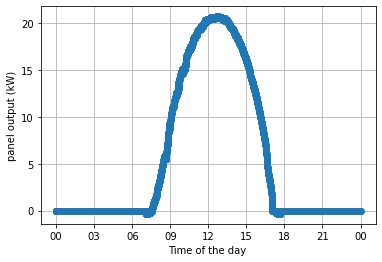

plotting for date 20190125


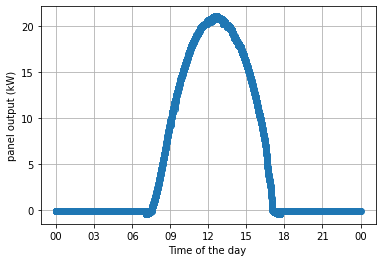

plotting for date 20190126


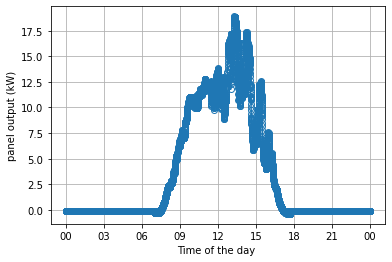

plotting for date 20190127


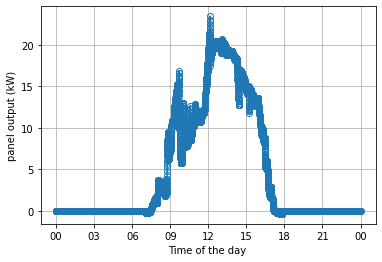

plotting for date 20190128


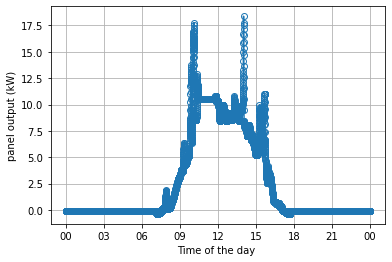

plotting for date 20190129


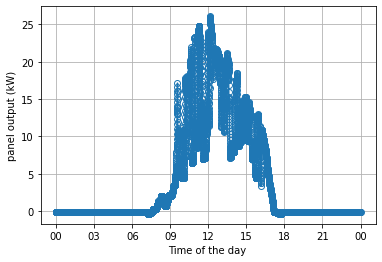

plotting for date 20190130


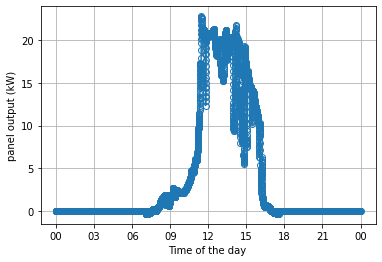

plotting for date 20190131


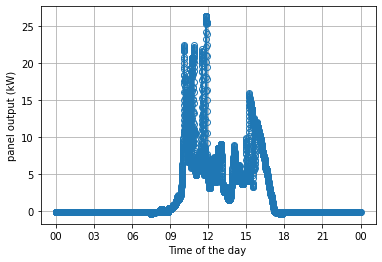

plotting for date 20190201


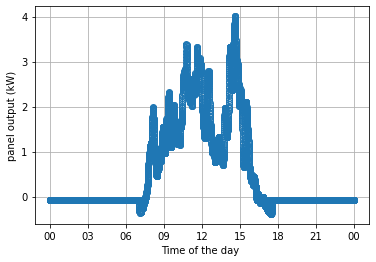

plotting for date 20190202


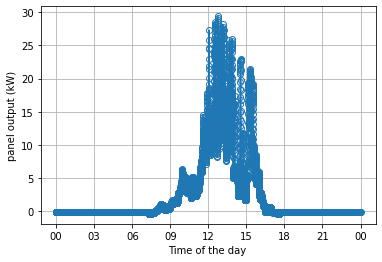

plotting for date 20190203


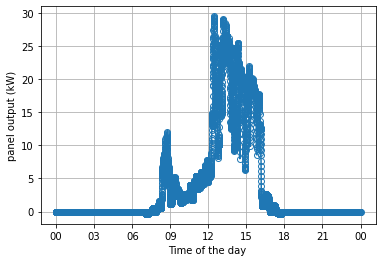

plotting for date 20190204


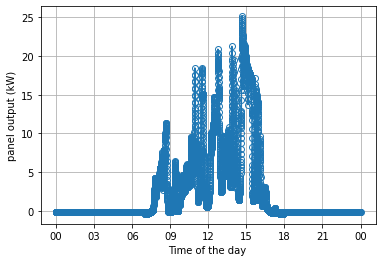

plotting for date 20190205


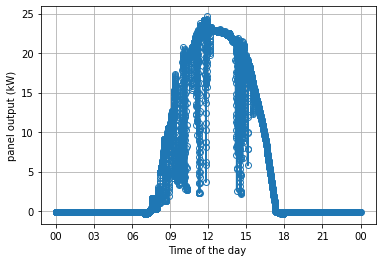

plotting for date 20190206


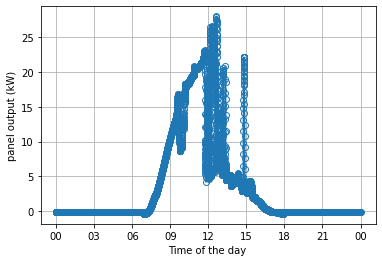

plotting for date 20190207


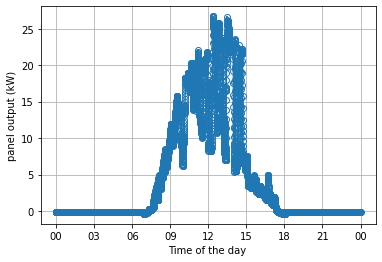

plotting for date 20190208


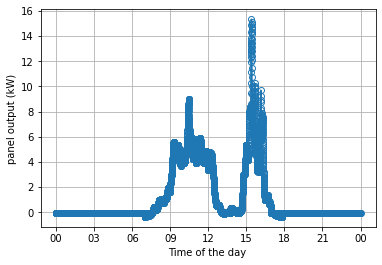

plotting for date 20190209


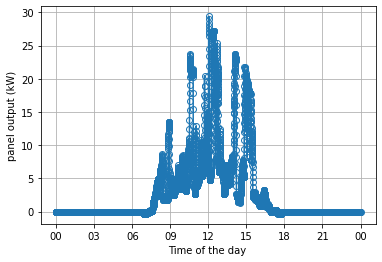

plotting for date 20190210


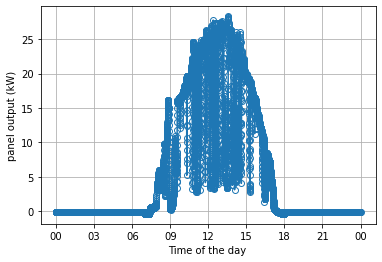

plotting for date 20190211


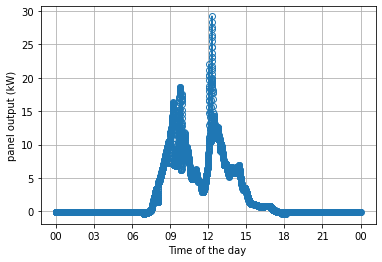

plotting for date 20190212


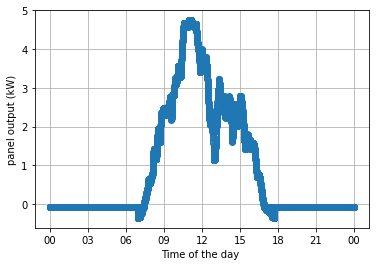

plotting for date 20190213


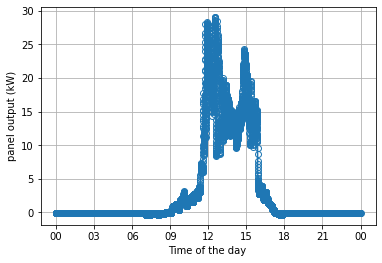

plotting for date 20190214


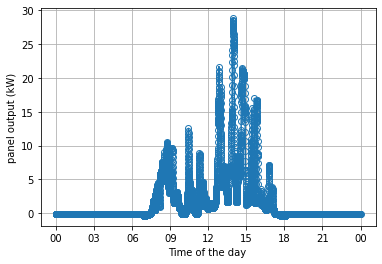

plotting for date 20190215


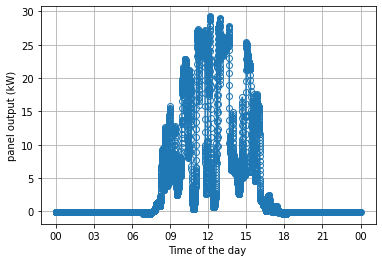

plotting for date 20190216


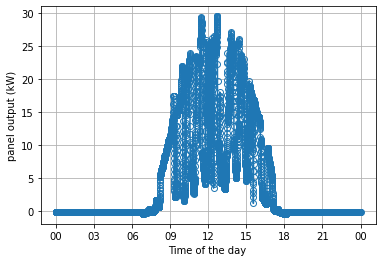

plotting for date 20190217


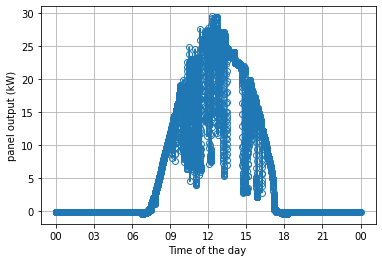

plotting for date 20190218


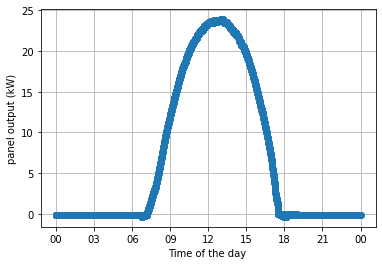

plotting for date 20190219


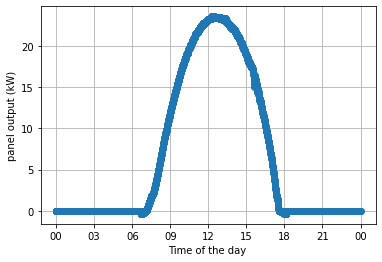

plotting for date 20190220


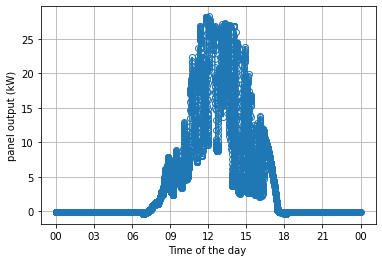

plotting for date 20190221


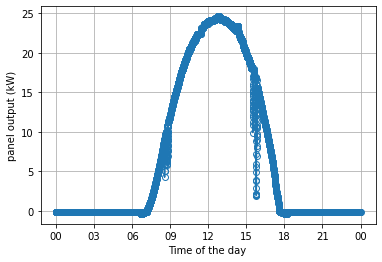

plotting for date 20190222


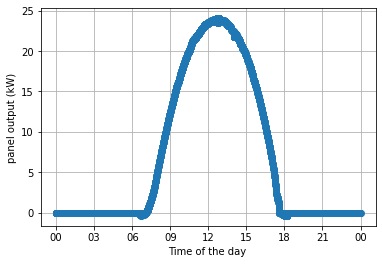

plotting for date 20190223


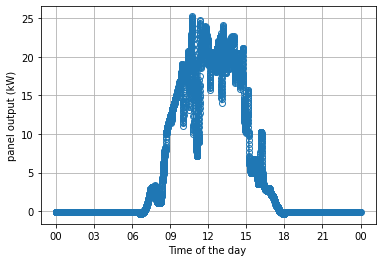

plotting for date 20190224


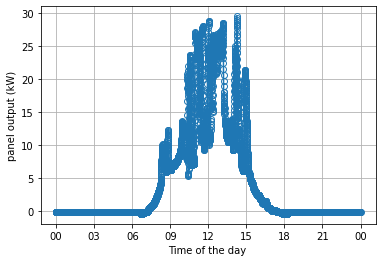

plotting for date 20190225


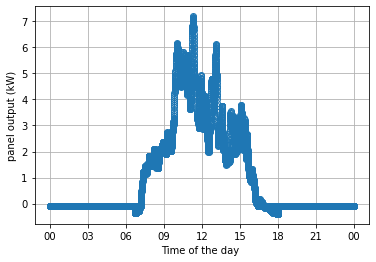

plotting for date 20190226


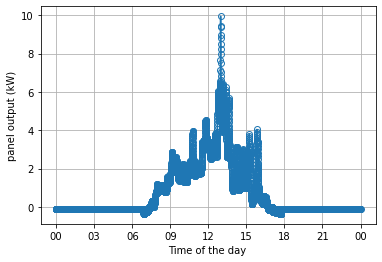

plotting for date 20190227


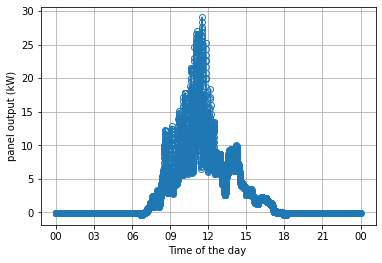

plotting for date 20190228


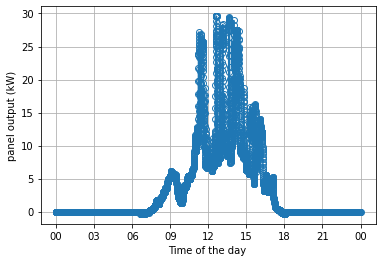

plotting for date 20190301


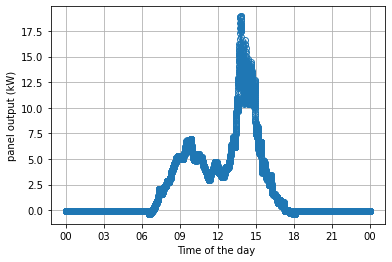

plotting for date 20190302


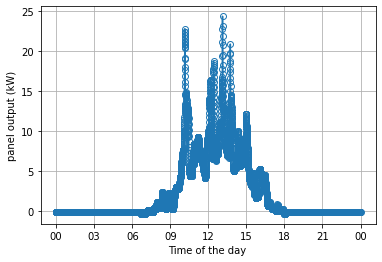

plotting for date 20190303


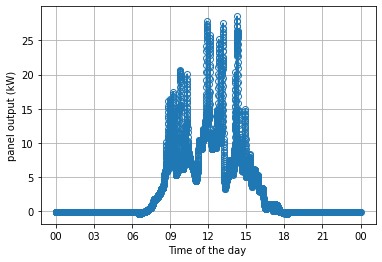

plotting for date 20190304


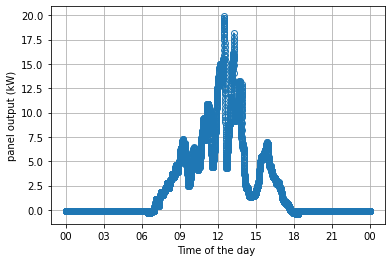

plotting for date 20190305


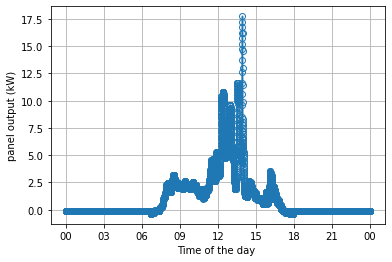

plotting for date 20190306


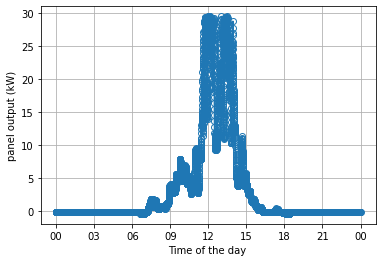

plotting for date 20190307


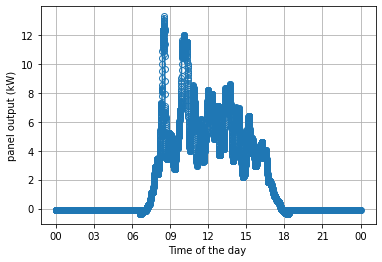

plotting for date 20190308


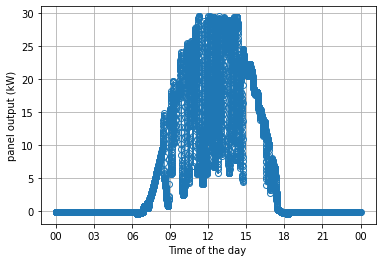

plotting for date 20190309


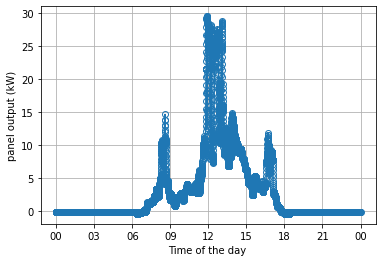

plotting for date 20190310


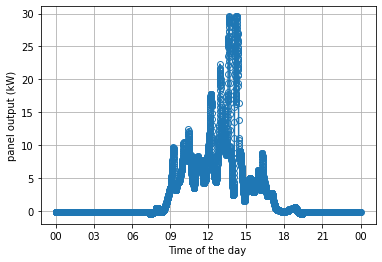

plotting for date 20190311


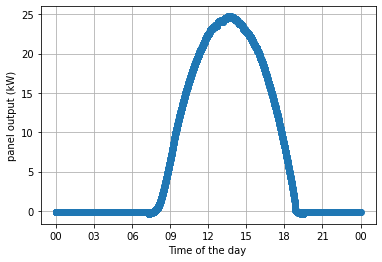

plotting for date 20190312


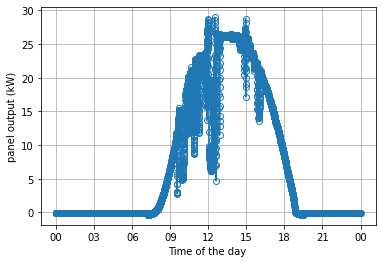

plotting for date 20190313


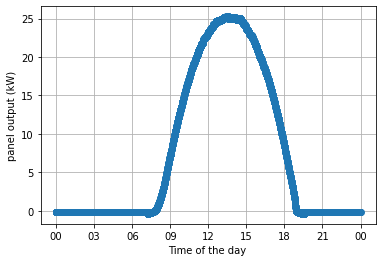

plotting for date 20190314


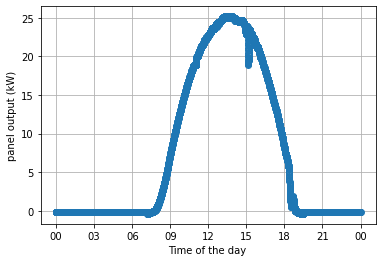

plotting for date 20190315


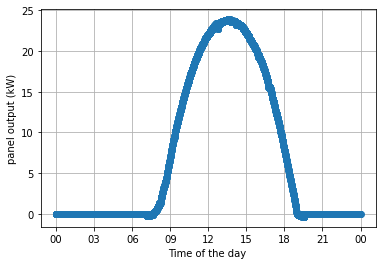

plotting for date 20190316


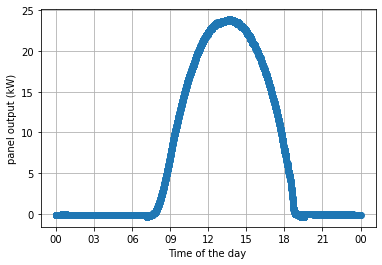

plotting for date 20190317


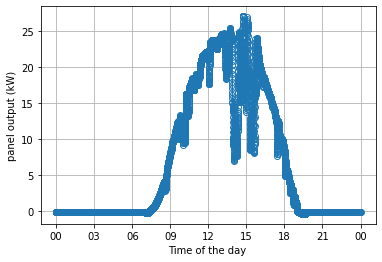

plotting for date 20190318


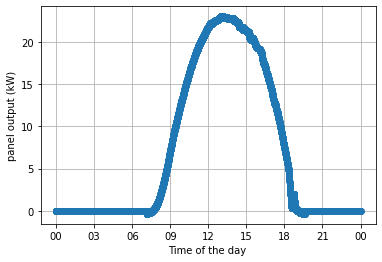

plotting for date 20190319


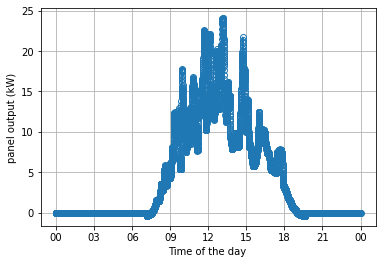

plotting for date 20190320


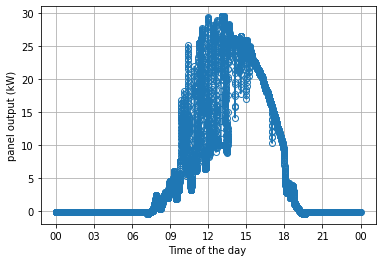

plotting for date 20190321


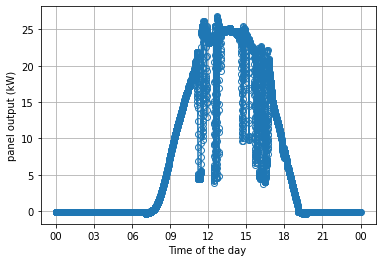

plotting for date 20190322


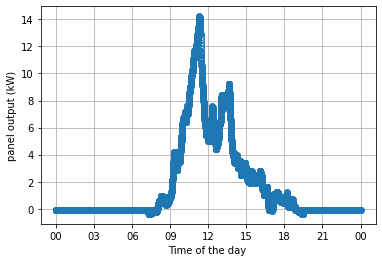

plotting for date 20190323


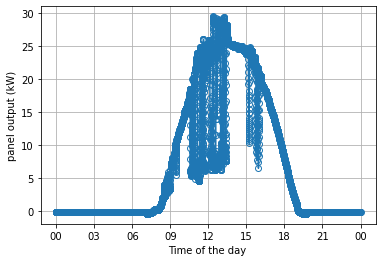

plotting for date 20190324


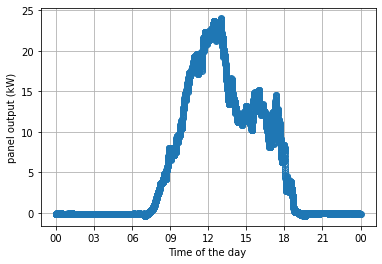

plotting for date 20190325


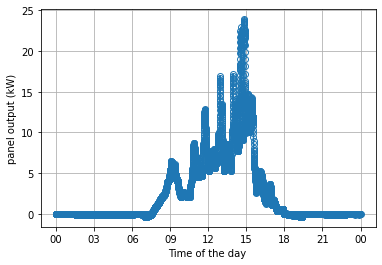

plotting for date 20190326


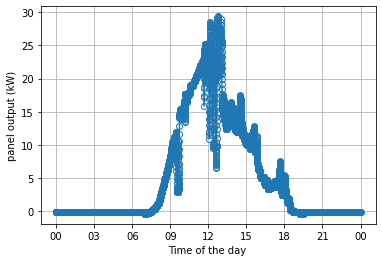

plotting for date 20190327


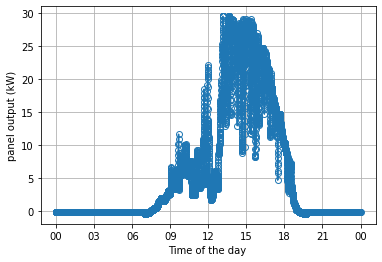

plotting for date 20190328


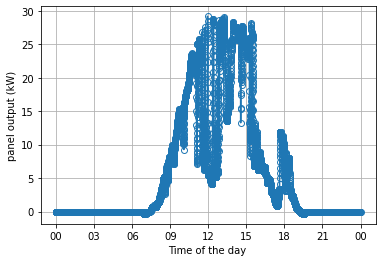

plotting for date 20190329


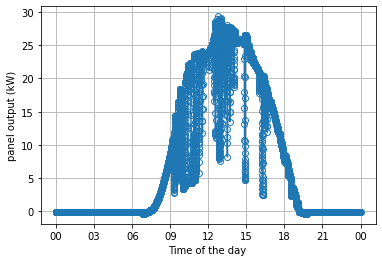

plotting for date 20190330


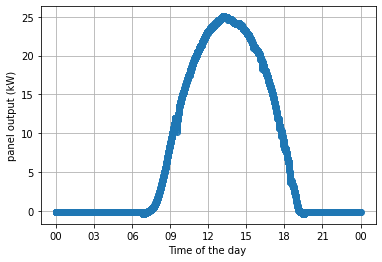

plotting for date 20190331


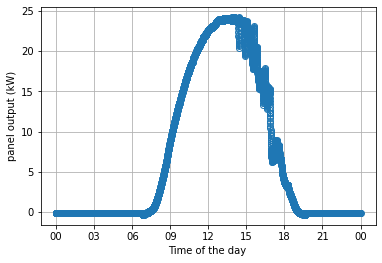

plotting for date 20190401


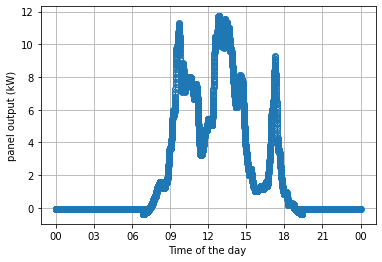

plotting for date 20190402


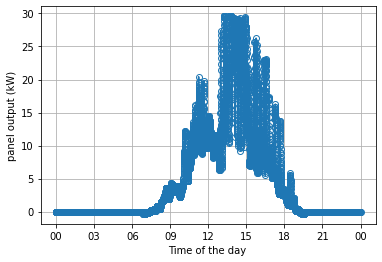

plotting for date 20190403


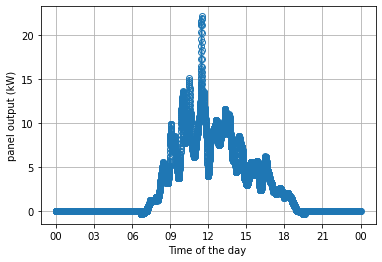

plotting for date 20190404


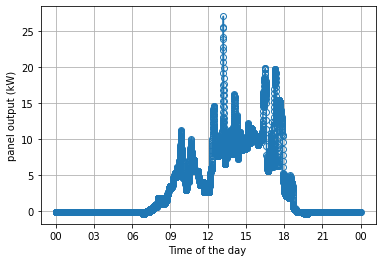

plotting for date 20190405


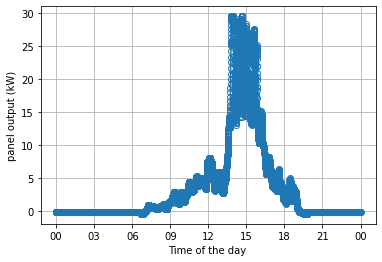

plotting for date 20190406


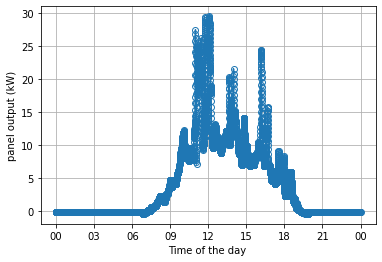

plotting for date 20190407


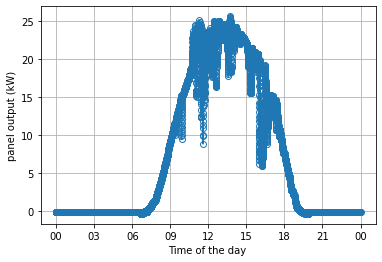

plotting for date 20190408


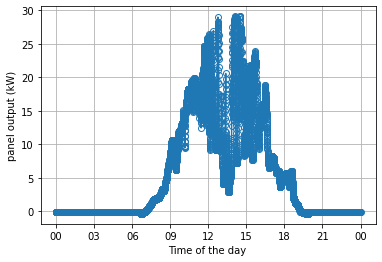

plotting for date 20190409


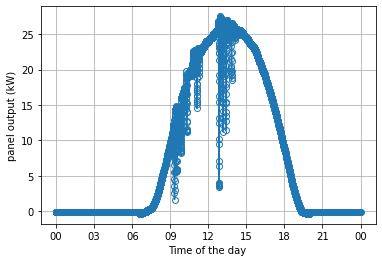

plotting for date 20190410


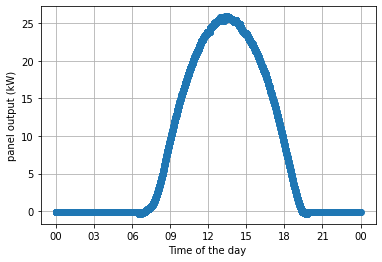

plotting for date 20190411


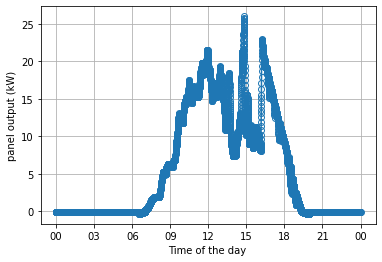

plotting for date 20190412


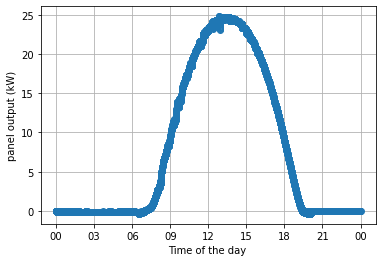

plotting for date 20190413


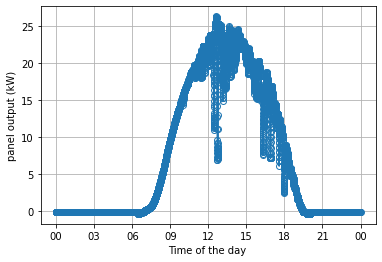

plotting for date 20190414


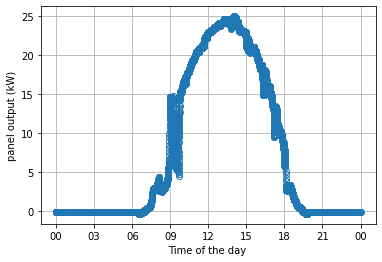

plotting for date 20190415


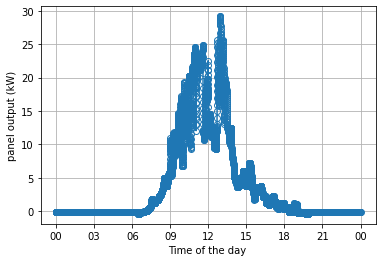

plotting for date 20190416


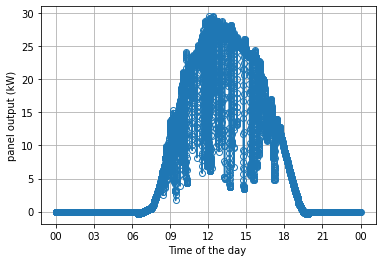

plotting for date 20190417


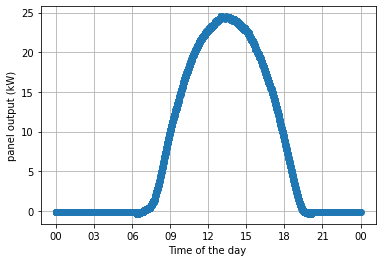

plotting for date 20190418


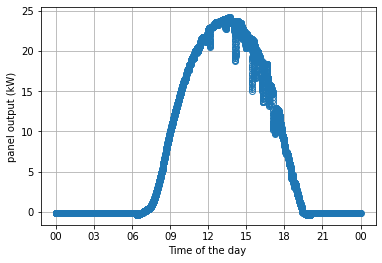

plotting for date 20190419


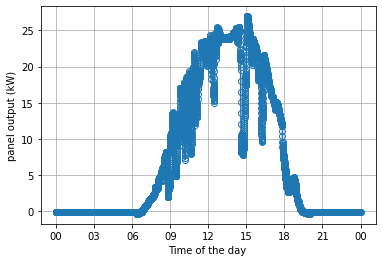

plotting for date 20190420


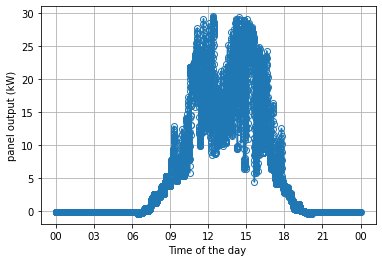

plotting for date 20190421


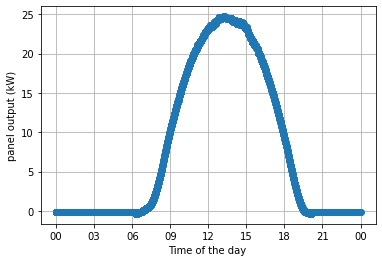

plotting for date 20190422


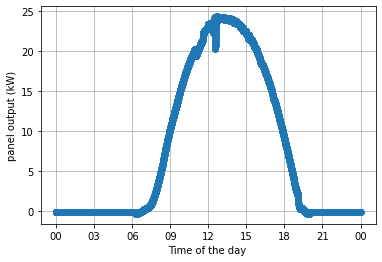

plotting for date 20190423


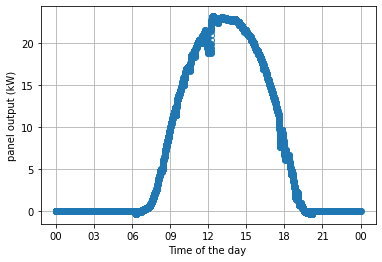

plotting for date 20190424


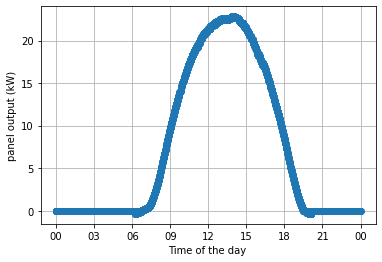

plotting for date 20190425


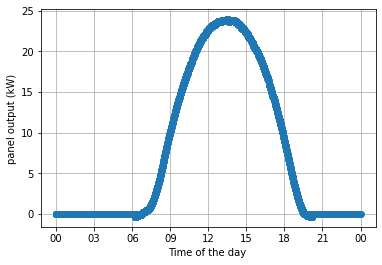

plotting for date 20190426


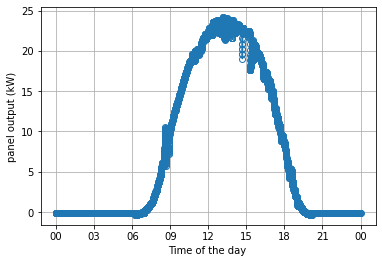

plotting for date 20190427


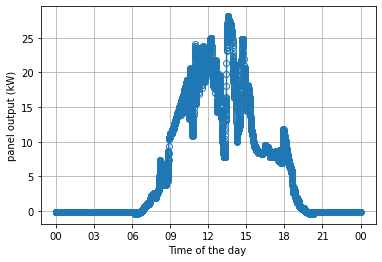

plotting for date 20190428


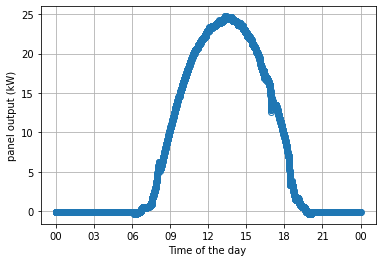

plotting for date 20190429


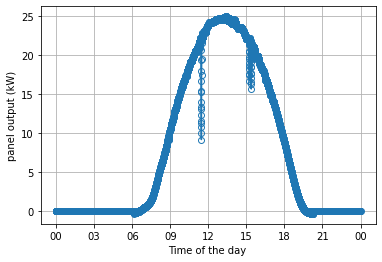

plotting for date 20190430


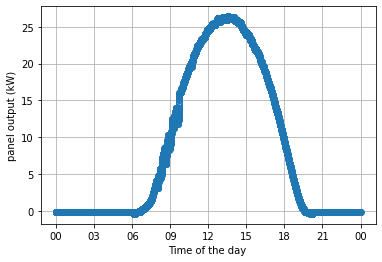

plotting for date 20190501


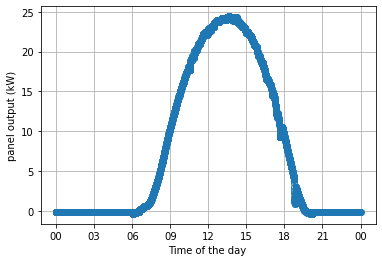

plotting for date 20190502


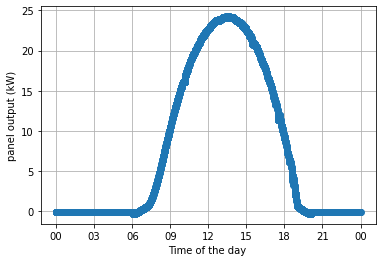

plotting for date 20190503


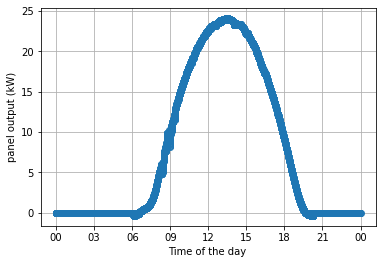

plotting for date 20190504


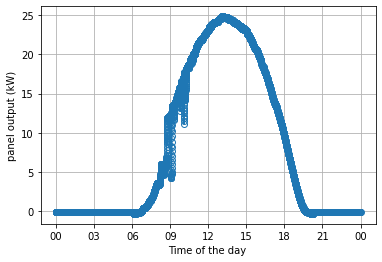

plotting for date 20190505


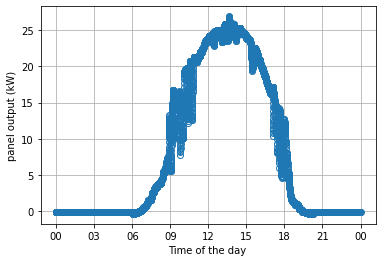

plotting for date 20190506


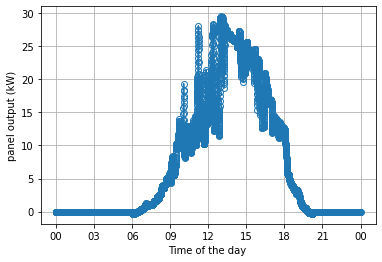

plotting for date 20190507


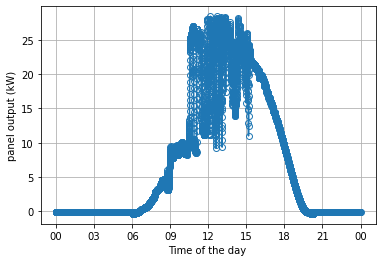

plotting for date 20190508


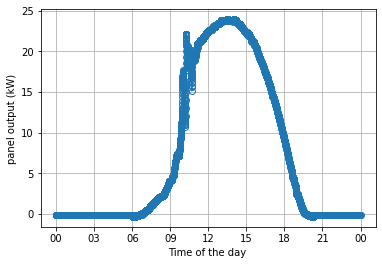

plotting for date 20190509


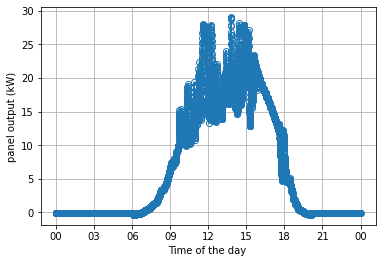

plotting for date 20190510


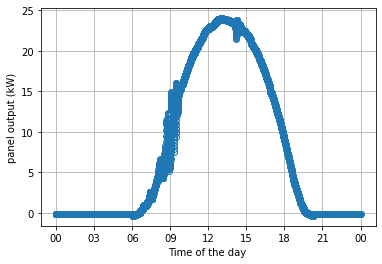

plotting for date 20190511


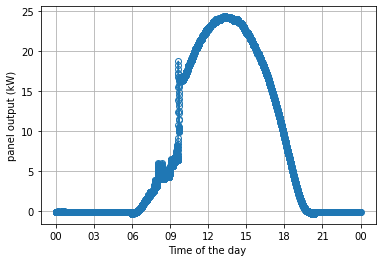

plotting for date 20190512


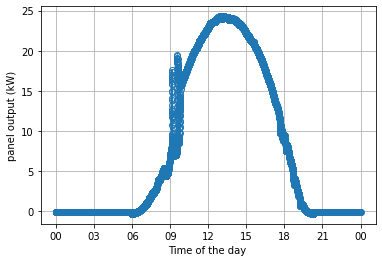

plotting for date 20190513


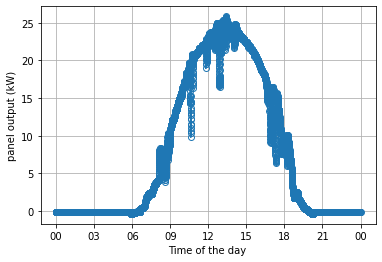

plotting for date 20190514


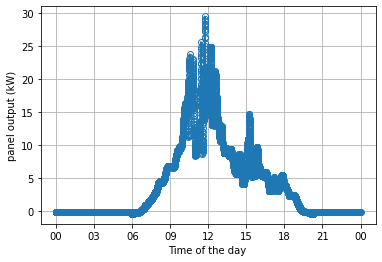

plotting for date 20190515


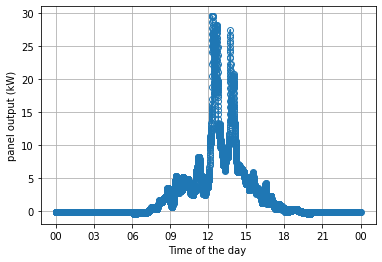

plotting for date 20190516


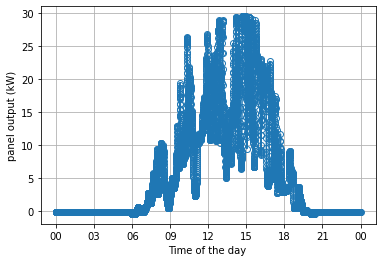

plotting for date 20190517


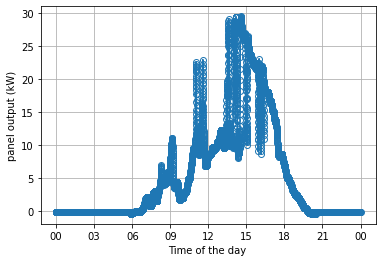

plotting for date 20190518


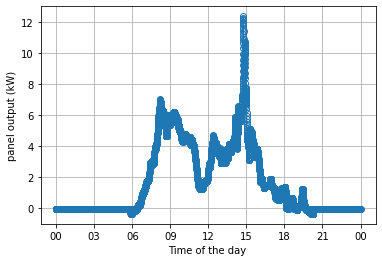

plotting for date 20190519


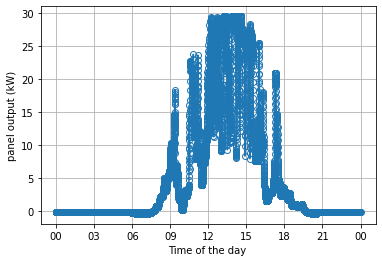

plotting for date 20190520


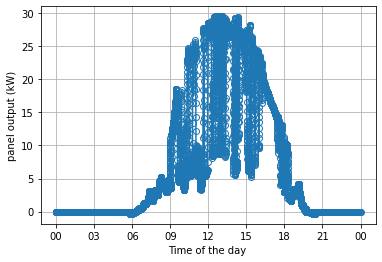

plotting for date 20190521


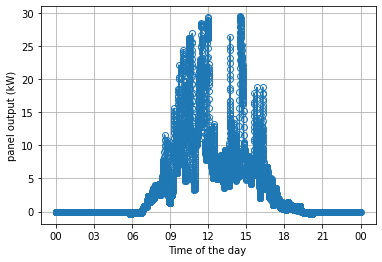

plotting for date 20190522


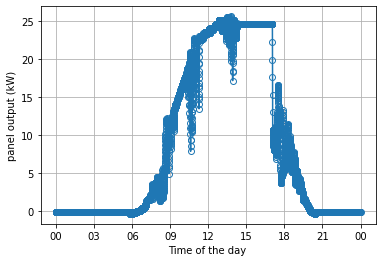

plotting for date 20190523


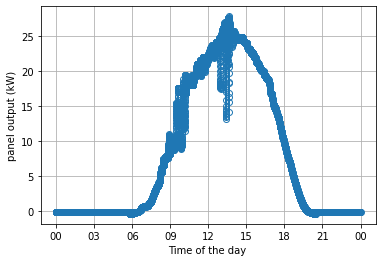

plotting for date 20190524


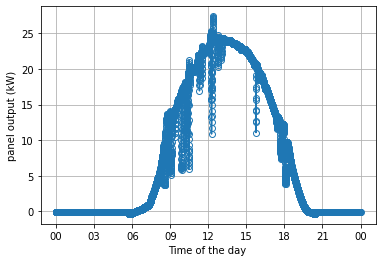

plotting for date 20190525


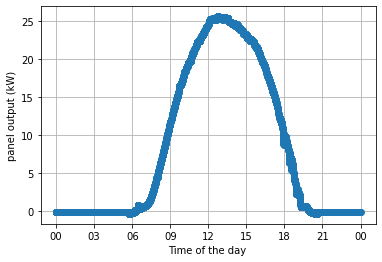

plotting for date 20190526


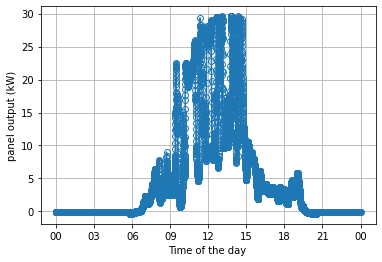

plotting for date 20190527


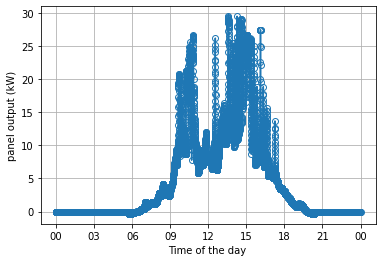

plotting for date 20190528


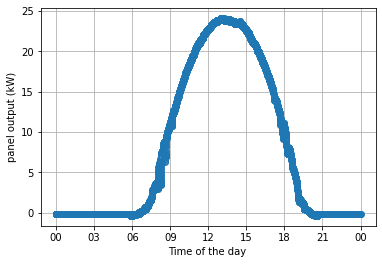

plotting for date 20190529


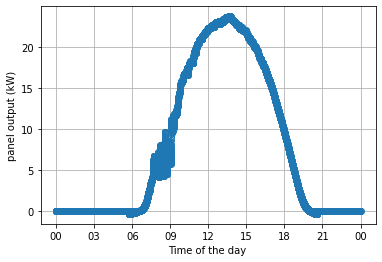

plotting for date 20190530


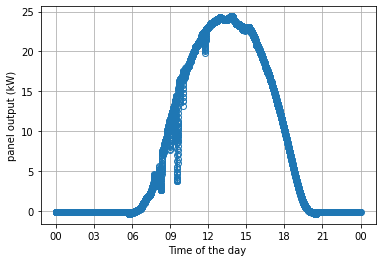

plotting for date 20190531


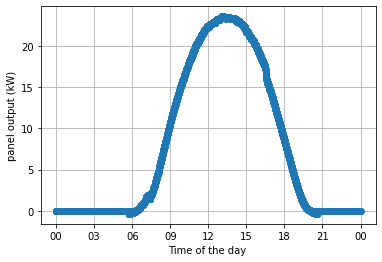

plotting for date 20190601


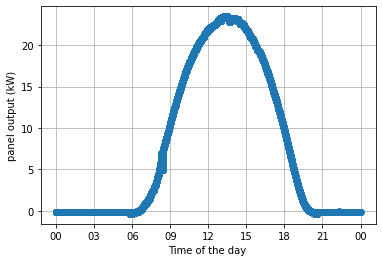

plotting for date 20190602


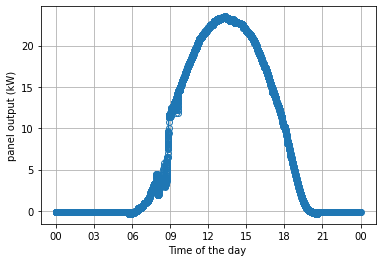

plotting for date 20190603


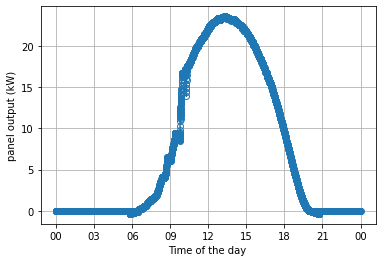

plotting for date 20190604


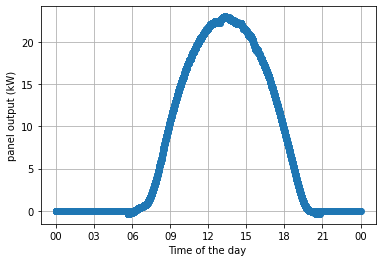

plotting for date 20190605


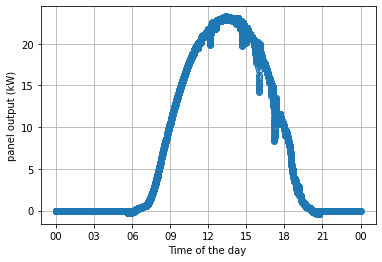

plotting for date 20190606


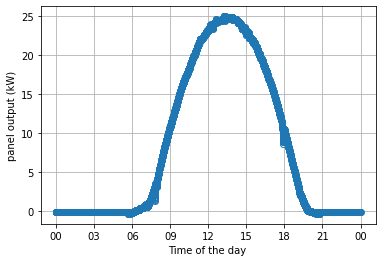

plotting for date 20190607


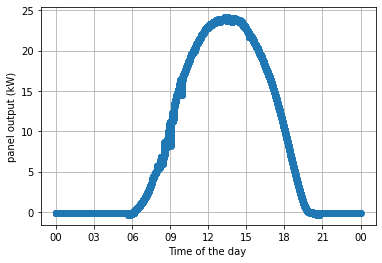

plotting for date 20190608


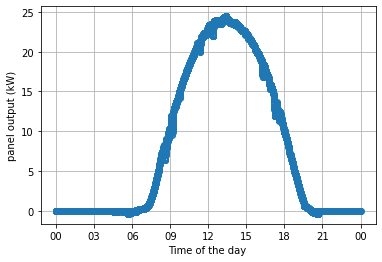

plotting for date 20190609


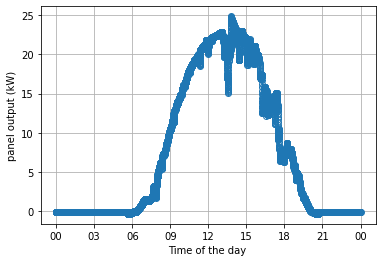

plotting for date 20190610


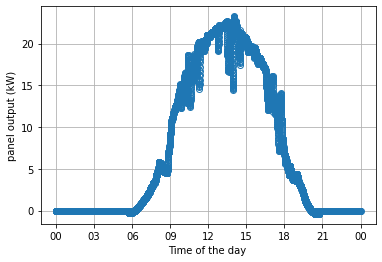

plotting for date 20190611


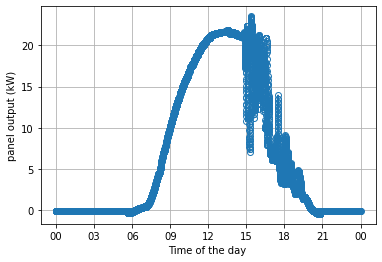

plotting for date 20190612


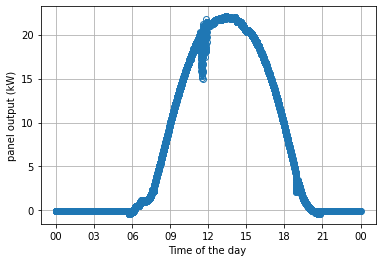

plotting for date 20190613


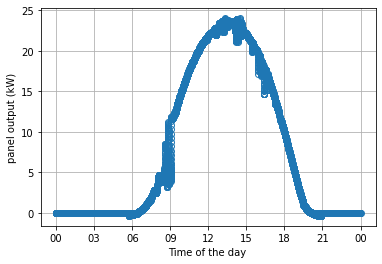

plotting for date 20190614


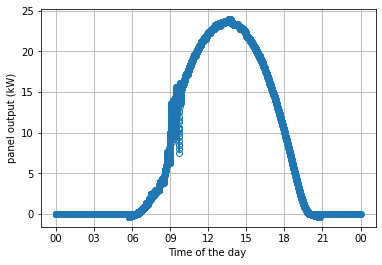

plotting for date 20190615


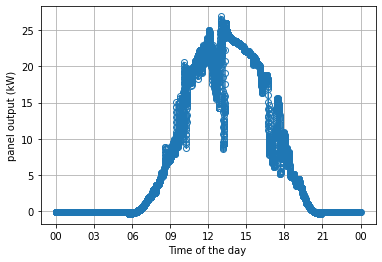

plotting for date 20190616


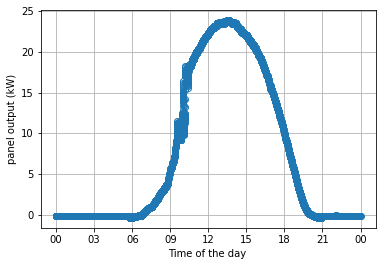

plotting for date 20190617


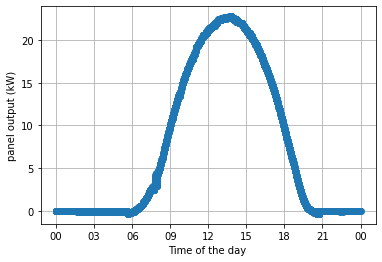

plotting for date 20190618


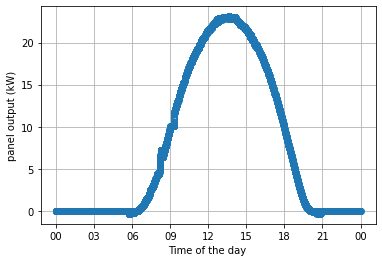

plotting for date 20190619


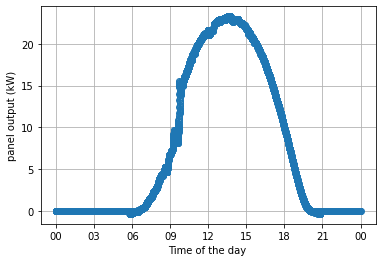

plotting for date 20190620


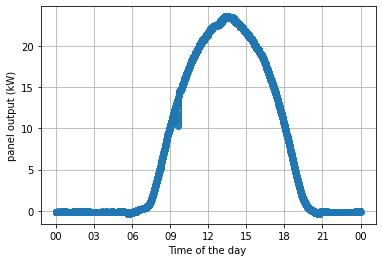

plotting for date 20190621


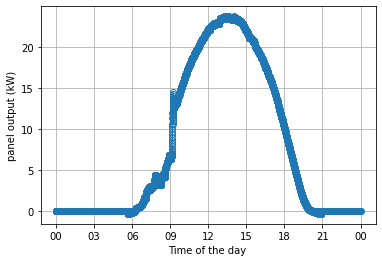

plotting for date 20190622


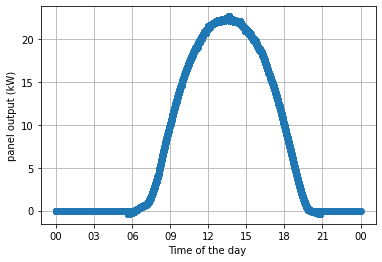

plotting for date 20190623


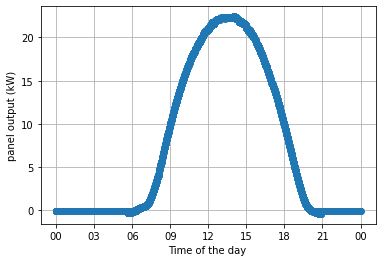

plotting for date 20190624


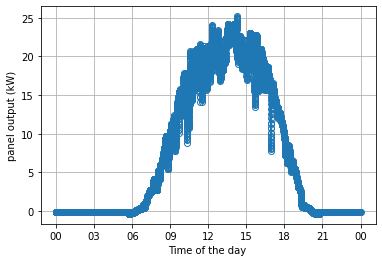

plotting for date 20190625


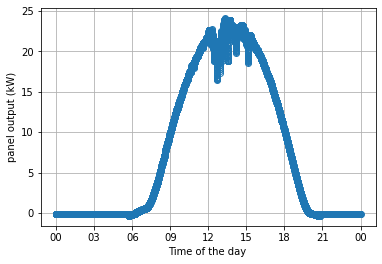

plotting for date 20190626


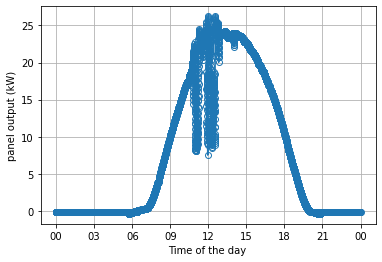

plotting for date 20190627


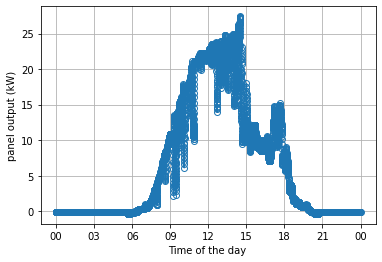

plotting for date 20190628


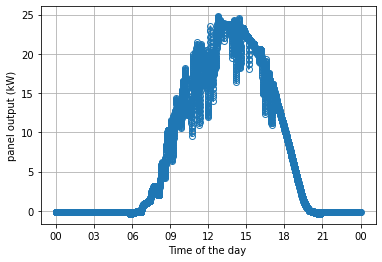

plotting for date 20190629


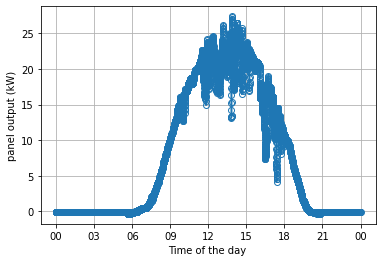

plotting for date 20190630


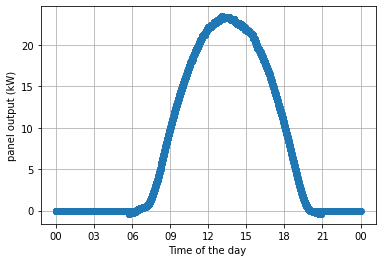

plotting for date 20190701


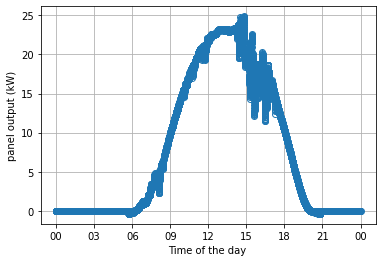

plotting for date 20190702


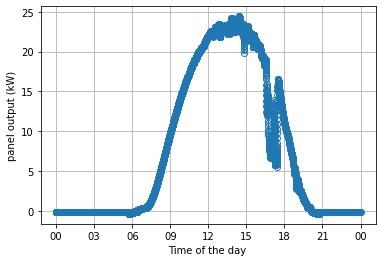

plotting for date 20190703


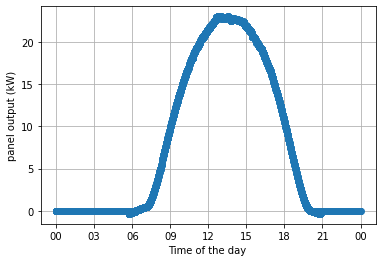

plotting for date 20190704


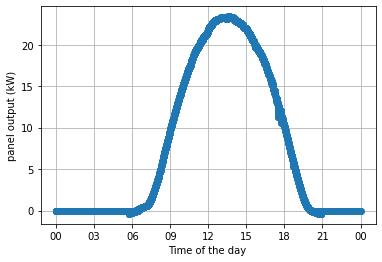

plotting for date 20190705


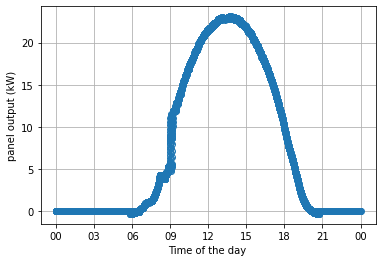

plotting for date 20190706


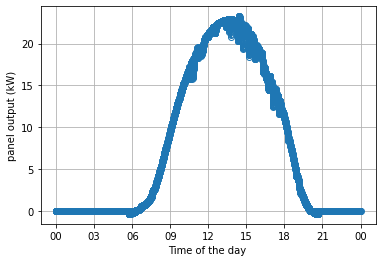

plotting for date 20190707


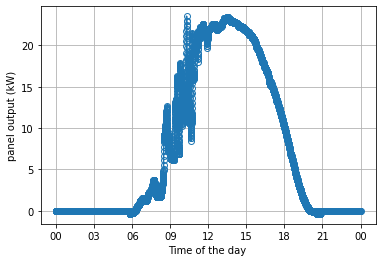

plotting for date 20190708


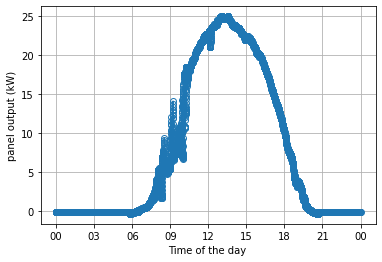

plotting for date 20190709


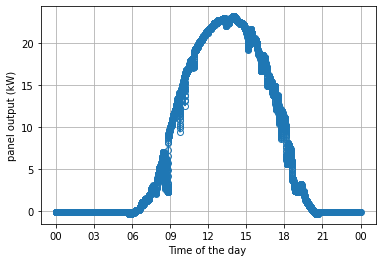

plotting for date 20190710


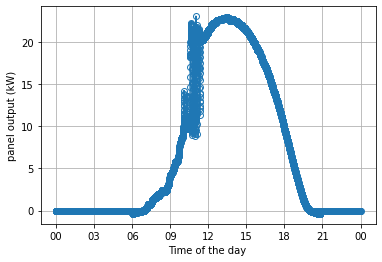

plotting for date 20190711


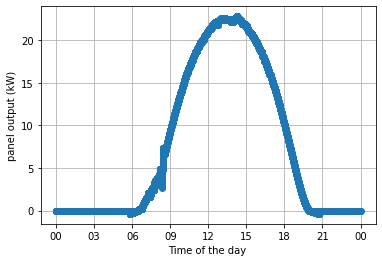

plotting for date 20190712


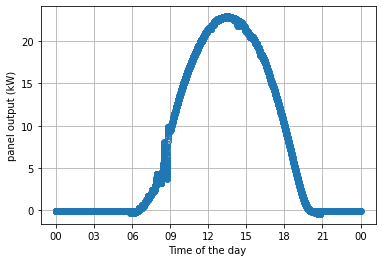

plotting for date 20190713


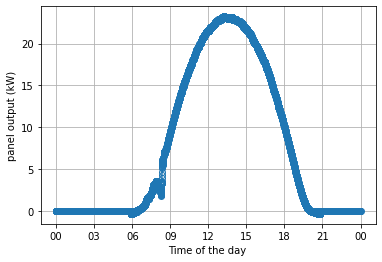

plotting for date 20190714


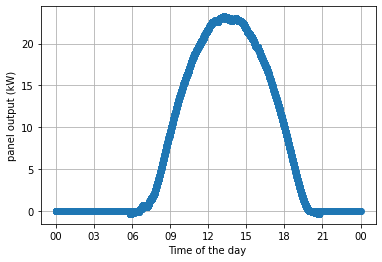

plotting for date 20190715


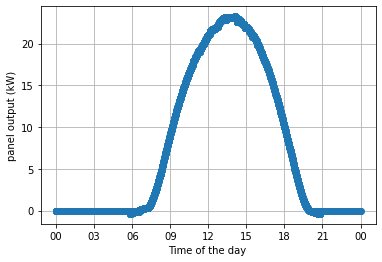

plotting for date 20190716


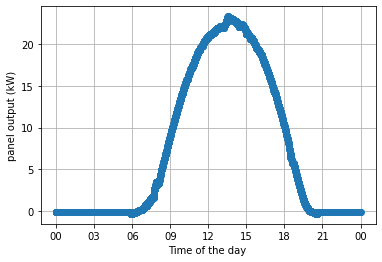

plotting for date 20190717


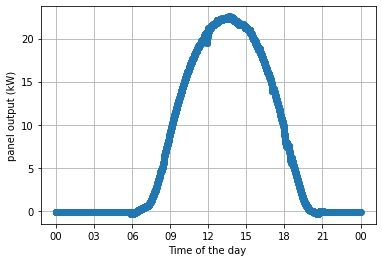

plotting for date 20190718


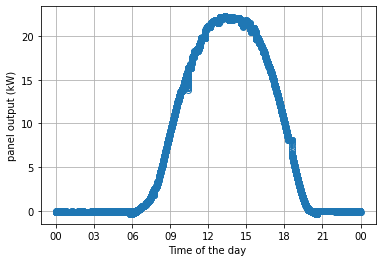

plotting for date 20190719


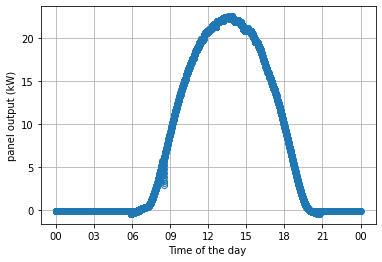

plotting for date 20190720


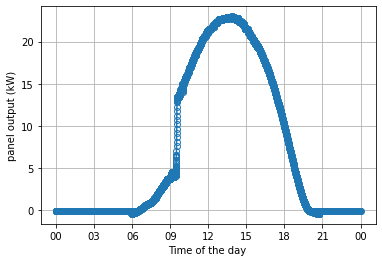

plotting for date 20190721


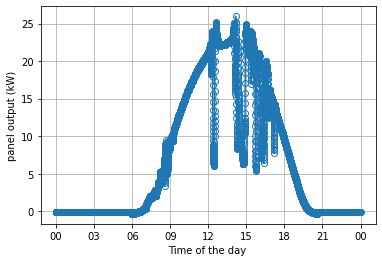

plotting for date 20190722


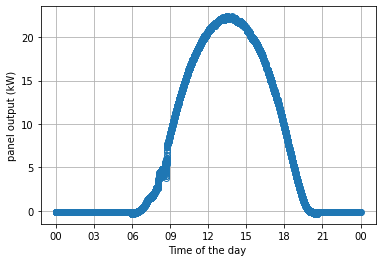

plotting for date 20190723


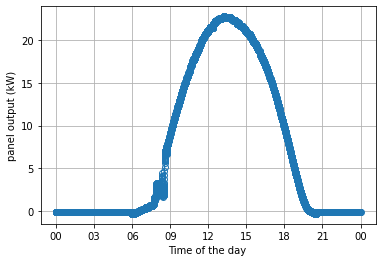

plotting for date 20190724


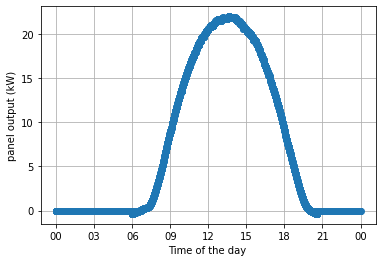

plotting for date 20190725


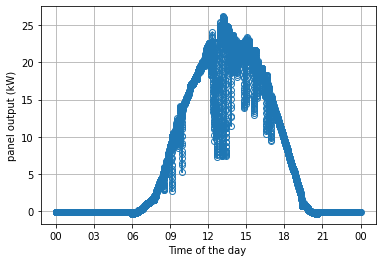

plotting for date 20190726


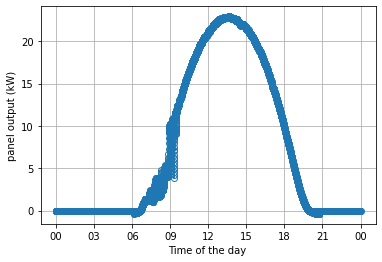

plotting for date 20190727


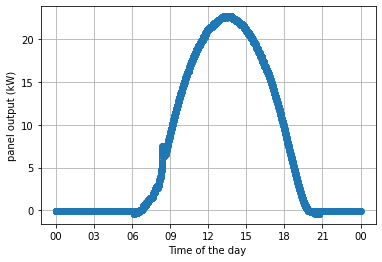

plotting for date 20190728


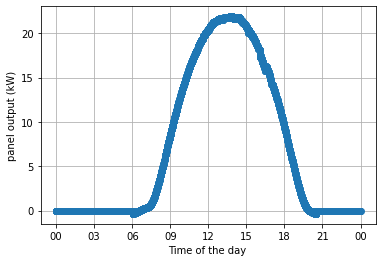

plotting for date 20190729


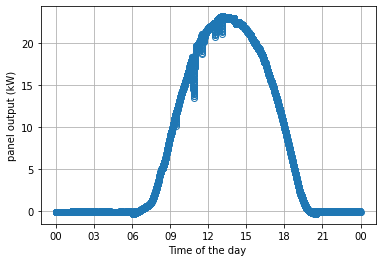

plotting for date 20190730


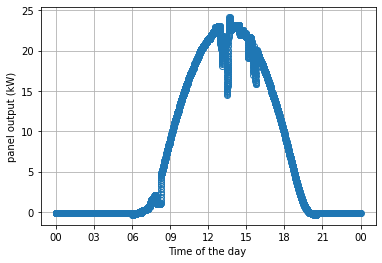

plotting for date 20190731


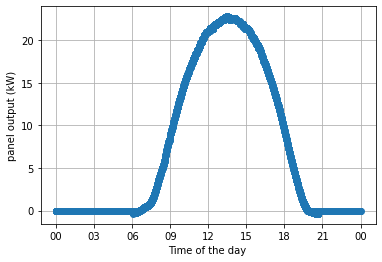

plotting for date 20190801


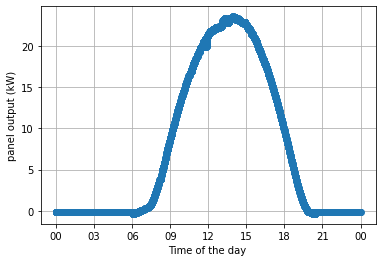

plotting for date 20190802


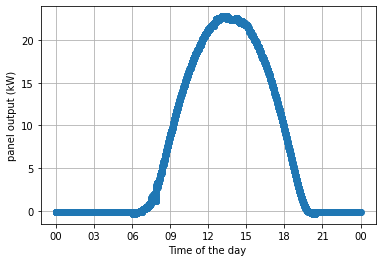

plotting for date 20190803


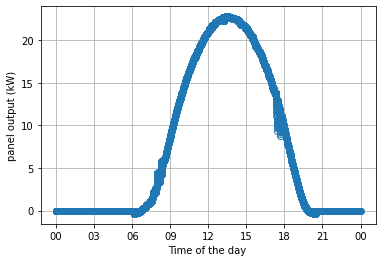

plotting for date 20190804


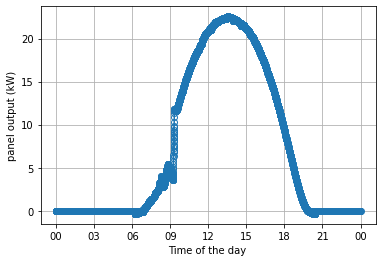

plotting for date 20190805


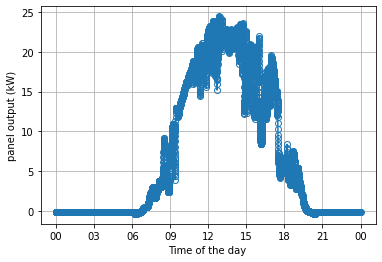

plotting for date 20190806


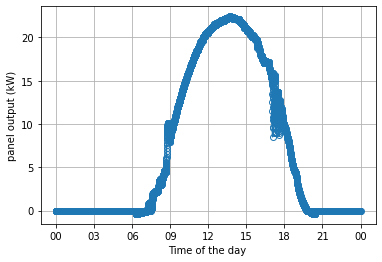

plotting for date 20190807


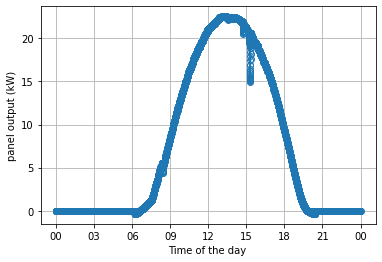

plotting for date 20190808


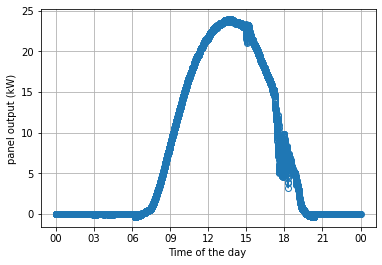

plotting for date 20190809


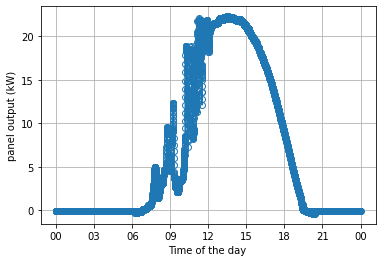

plotting for date 20190810


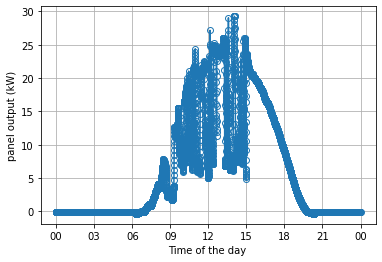

plotting for date 20190811


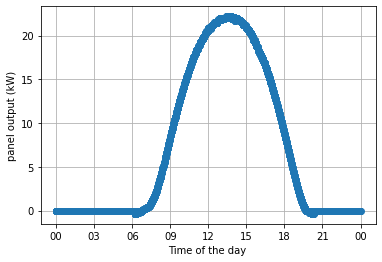

plotting for date 20190812


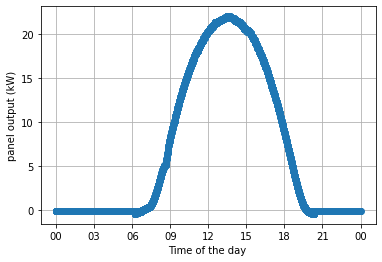

plotting for date 20190813


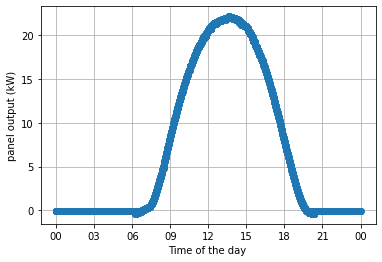

plotting for date 20190814


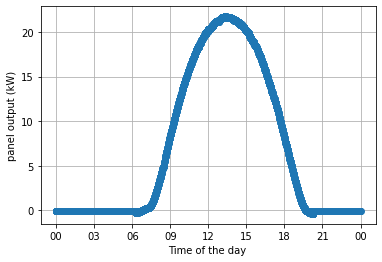

plotting for date 20190815


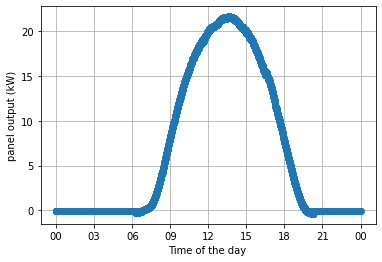

plotting for date 20190816


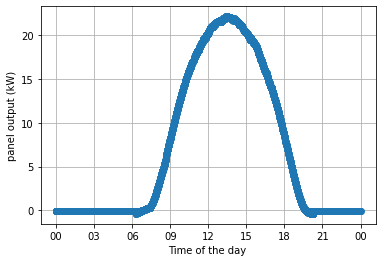

plotting for date 20190817


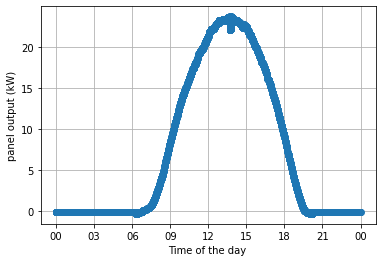

plotting for date 20190818


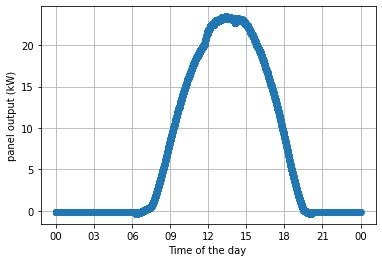

plotting for date 20190819


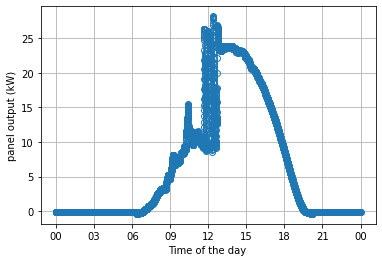

plotting for date 20190820


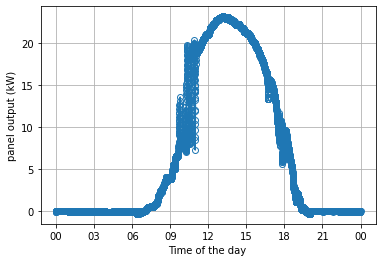

plotting for date 20190821


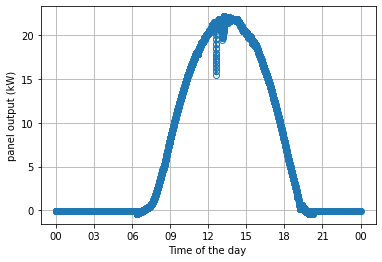

plotting for date 20190822


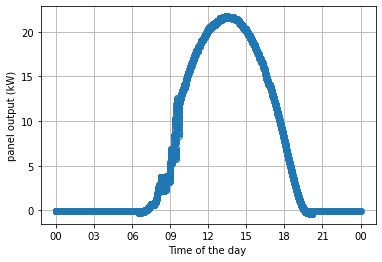

plotting for date 20190823


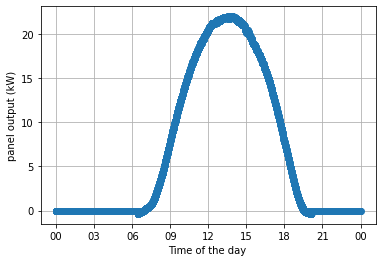

plotting for date 20190824


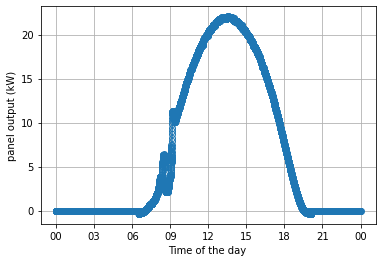

plotting for date 20190825


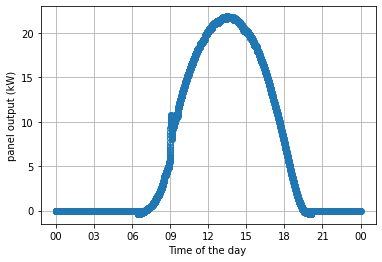

plotting for date 20190826


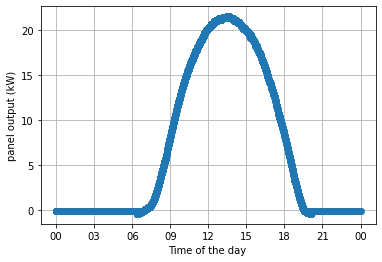

plotting for date 20190827


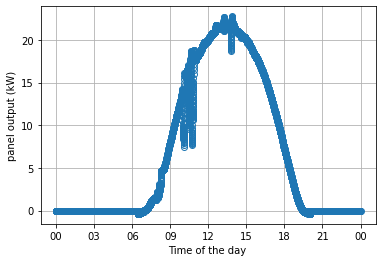

plotting for date 20190828


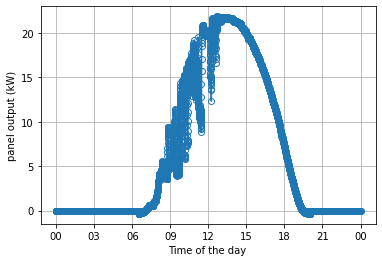

plotting for date 20190829


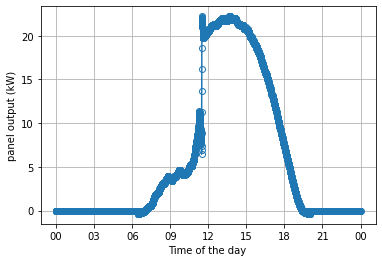

plotting for date 20190830


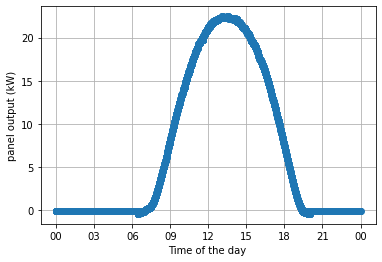

plotting for date 20190831


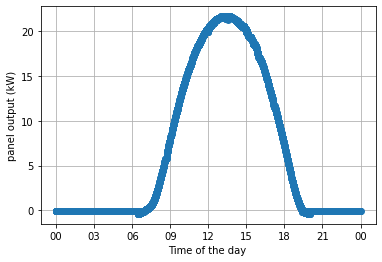

plotting for date 20190901


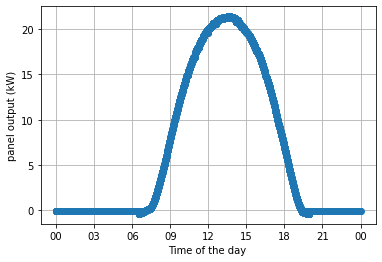

plotting for date 20190902


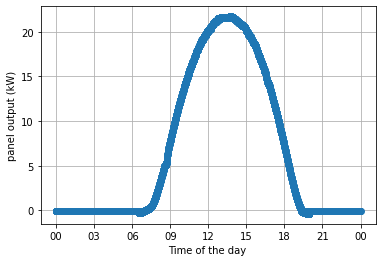

plotting for date 20190903


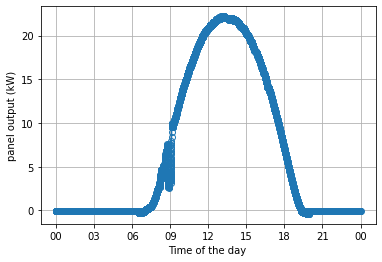

plotting for date 20190904


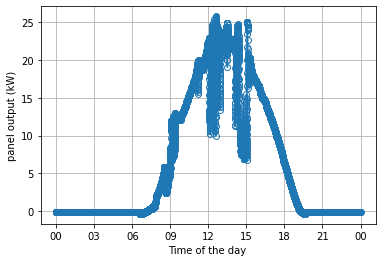

plotting for date 20190905


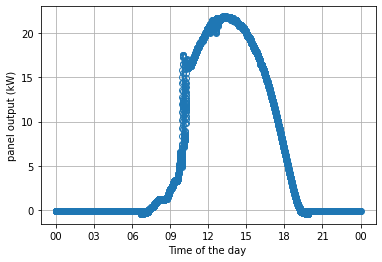

plotting for date 20190906


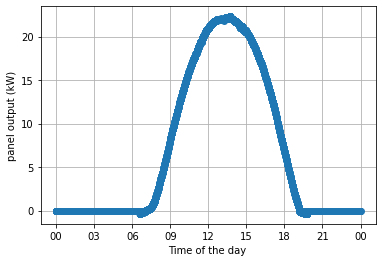

plotting for date 20190907


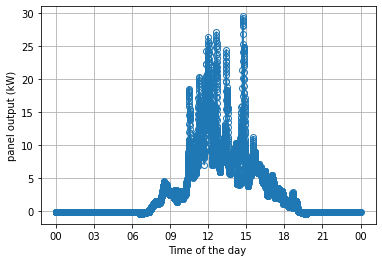

plotting for date 20190908


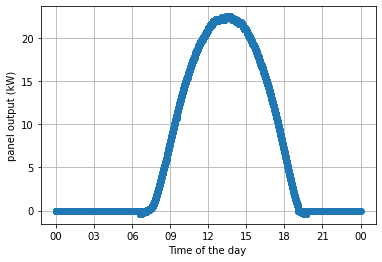

plotting for date 20190909


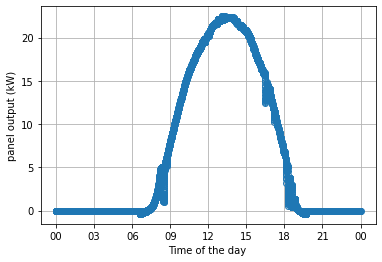

plotting for date 20190910


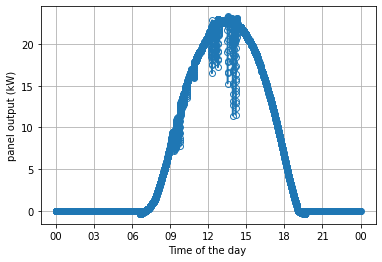

plotting for date 20190911


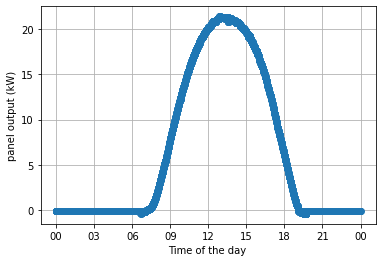

plotting for date 20190912


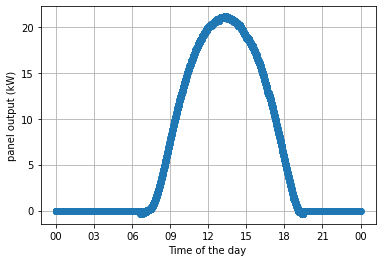

plotting for date 20190913


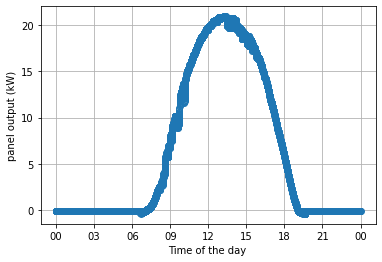

plotting for date 20190914


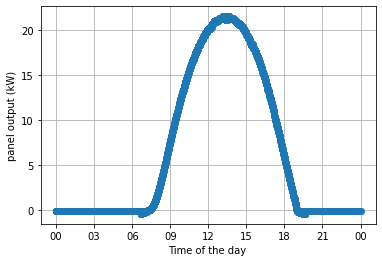

plotting for date 20190915


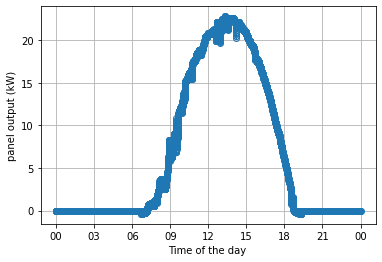

plotting for date 20190916


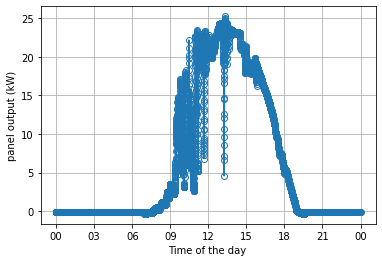

plotting for date 20190917


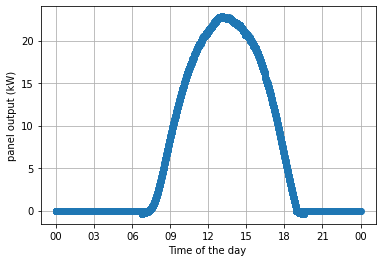

plotting for date 20190918


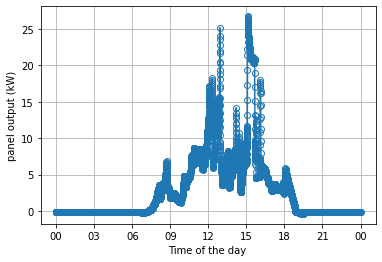

plotting for date 20190919


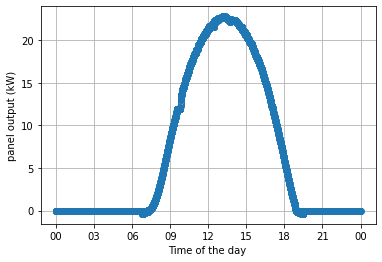

plotting for date 20190920


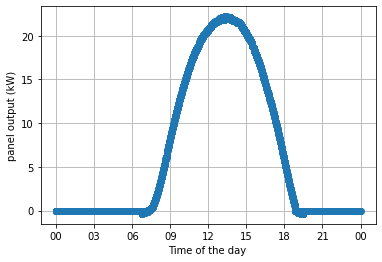

plotting for date 20190921


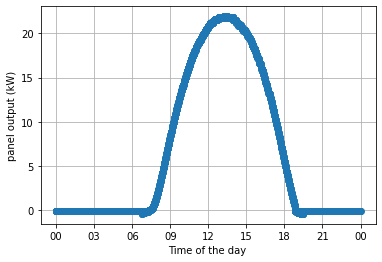

plotting for date 20190922


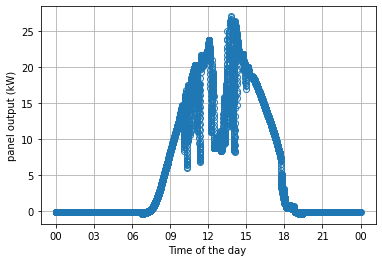

plotting for date 20190923


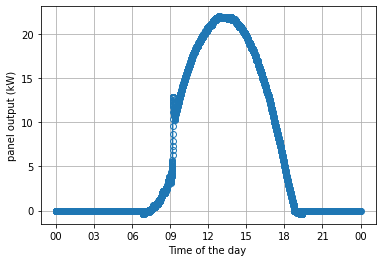

plotting for date 20190924


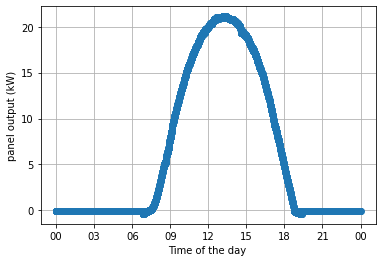

plotting for date 20190925


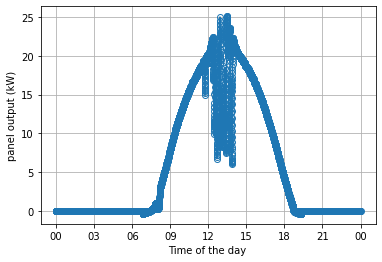

plotting for date 20190926


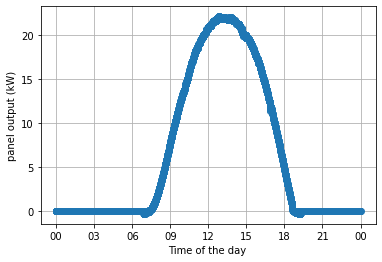

plotting for date 20190927


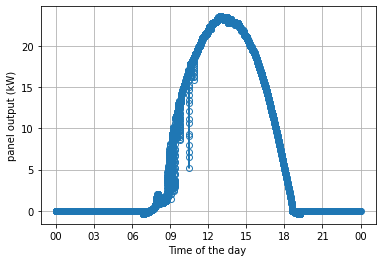

plotting for date 20190928


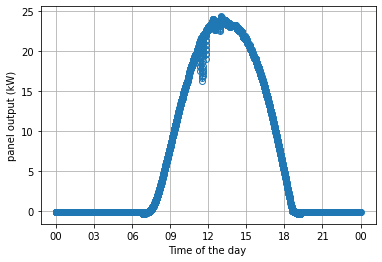

plotting for date 20190929


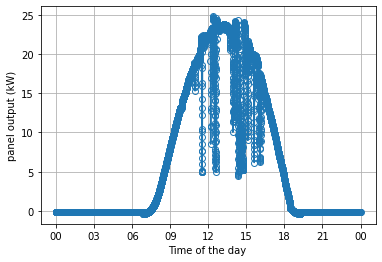

plotting for date 20190930


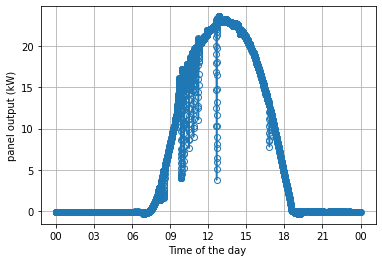

plotting for date 20191001


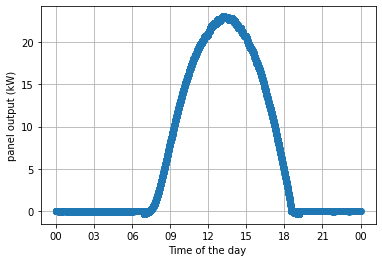

plotting for date 20191002


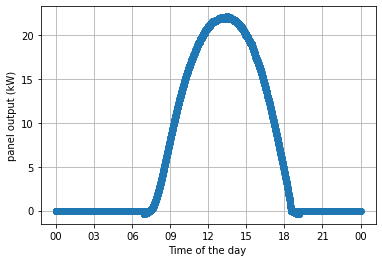

plotting for date 20191003


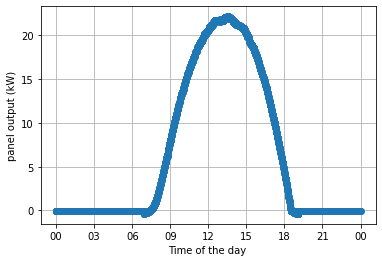

plotting for date 20191004


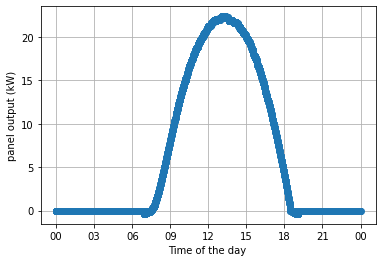

plotting for date 20191005


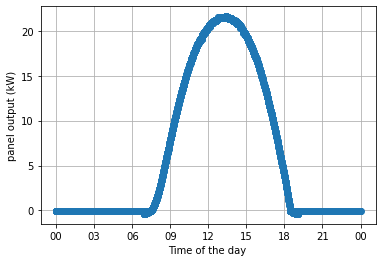

plotting for date 20191006


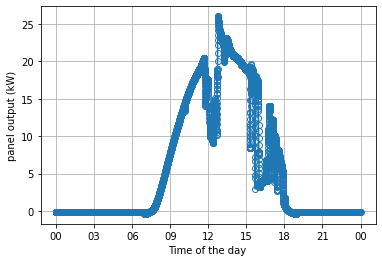

plotting for date 20191007


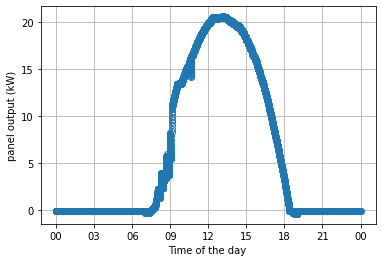

plotting for date 20191008


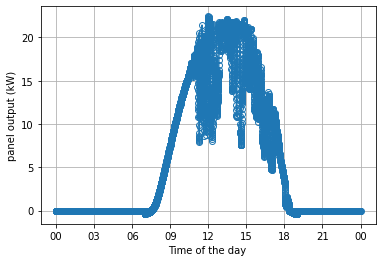

plotting for date 20191009


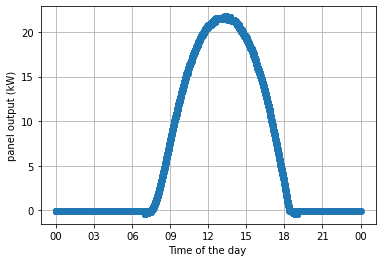

plotting for date 20191010


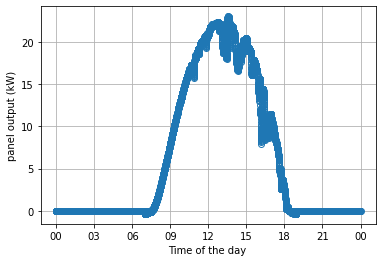

plotting for date 20191011


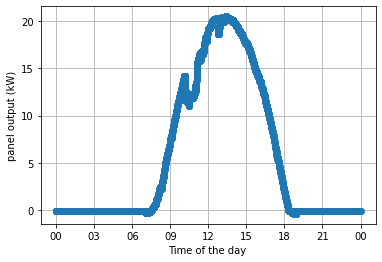

plotting for date 20191012


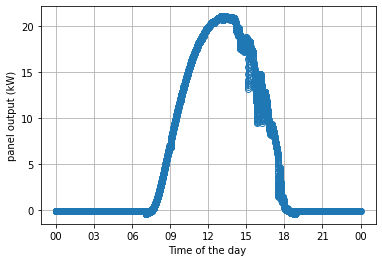

plotting for date 20191013


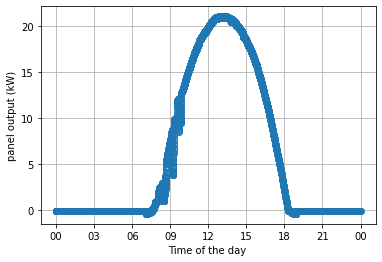

plotting for date 20191014


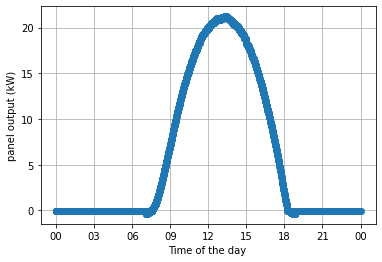

plotting for date 20191015


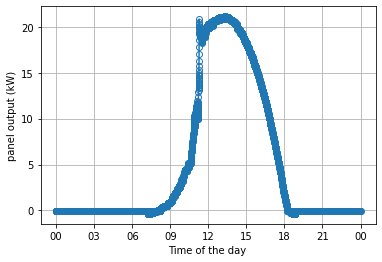

plotting for date 20191016


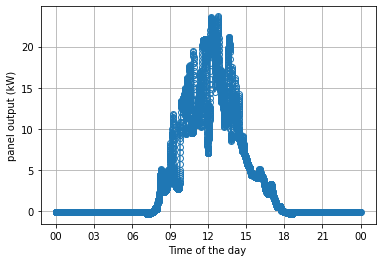

plotting for date 20191017


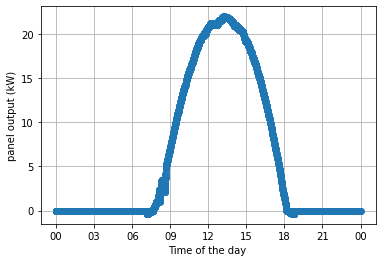

plotting for date 20191018


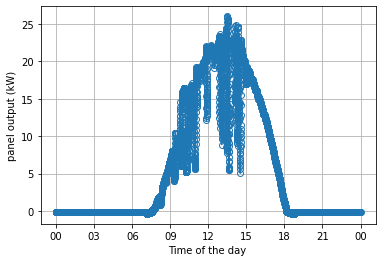

plotting for date 20191019


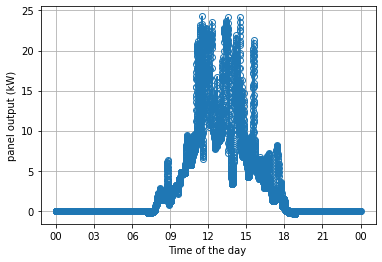

plotting for date 20191020


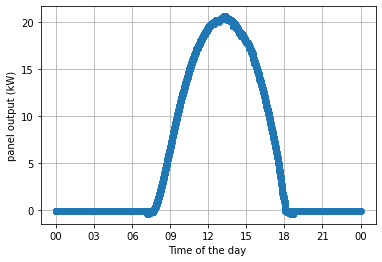

plotting for date 20191021


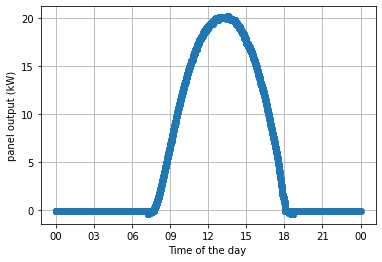

plotting for date 20191022


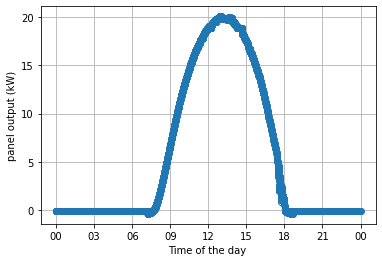

plotting for date 20191023


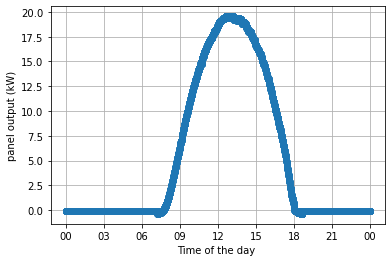

plotting for date 20191024


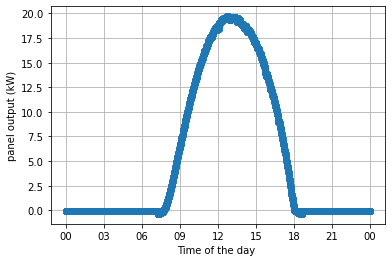

plotting for date 20191025


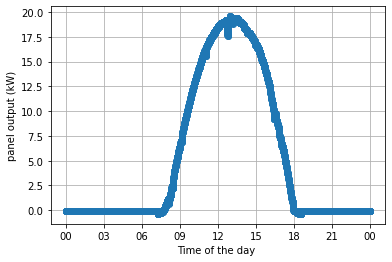

plotting for date 20191026


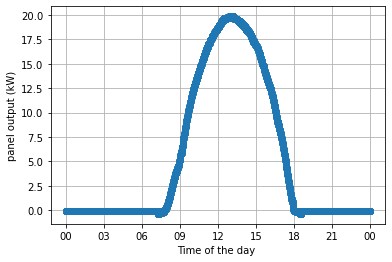

plotting for date 20191027


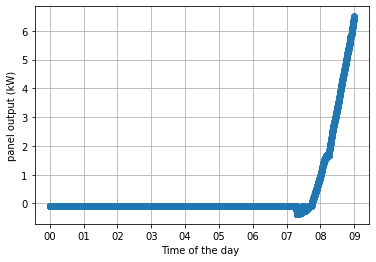

In [10]:
#  Step through the PV_data day by day 
xfmt = mdates.DateFormatter('%H')
for date in pd.date_range(start = pv_output_10s_int.index[0], end = pv_output_10s_int.index[-1],
                         freq = '1D', closed = 'left'):
    hours_xaxis = pv_output_10s_int.loc[date:date+datetime.timedelta(days = 1)].index
    pv_one_day = pv_output_10s_int.loc[date:date+datetime.timedelta(days = 1)].values
    f, ax = plt.subplots()
    print('plotting for date',date.strftime('%Y%m%d'))
    ax.plot(hours_xaxis,pv_one_day,'-o',markerfacecolor='None')
    ax.grid(True)
    ax.set_xlabel('Time of the day ')
    ax.set_ylabel('panel output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    plt.show()

In [11]:
# define invalide dates based on the curves above for sanity check
# end date is not included
# for example, the invalid days are [2017-03-10,2017-03-13), essentially [2017-03-10, 2017-03-12]
invalid_dates = {'start':[datetime.datetime(2017,3,10), datetime.datetime(2017,3,13), datetime.datetime(2017,3,18), 
datetime.datetime(2017,3,31), datetime.datetime(2017,4,5,8,34,0), datetime.datetime(2017,5,6,18,50,0), datetime.datetime(2017,7,17), 
datetime.datetime(2017,9,8,8,59,0), datetime.datetime(2017,10,9,10,3,0), datetime.datetime(2017,11,5), datetime.datetime(2017,12,30), 
datetime.datetime(2018,1,1), datetime.datetime(2018,3,11), datetime.datetime(2018,4,2),datetime.datetime(2018,6,13), 
datetime.datetime(2018,8,22), datetime.datetime(2018,9,25), datetime.datetime(2018,10,16), datetime.datetime(2018,11,4), 
datetime.datetime(2019, 1, 28, 10, 29, 0), datetime.datetime(2019, 5, 22, 14, 18, 0), datetime.datetime(2019, 10, 27)],
'end':[datetime.datetime(2017,3,13), datetime.datetime(2017,3,16), datetime.datetime(2017,3,20), datetime.datetime(2017,4,1), 
datetime.datetime(2017,4,5,9,51,0), datetime.datetime(2017,5,6,21,8,0), datetime.datetime(2017,7,18), datetime.datetime(2017,9,8,11,26,0), 
datetime.datetime(2017,10,9,12,12,0), datetime.datetime(2017,11,6), datetime.datetime(2018,1,1), datetime.datetime(2018,1,5), 
datetime.datetime(2018,3,13), datetime.datetime(2018,4,14),datetime.datetime(2018,6,14), datetime.datetime(2018,9,18), 
datetime.datetime(2018,10,1,6,0,0), datetime.datetime(2018,10,17), datetime.datetime(2018, 11, 26), datetime.datetime(2019, 1, 28, 11, 47, 0), 
datetime.datetime(2019, 5, 22, 17, 3, 0), datetime.datetime(2019, 10, 28)]}

## 4. Filter for invalid data

### 4.1 Invalid dates filter

In [12]:
invalid_dates_mask = pd.Series(False, index = pv_output_10s_int.index)

for i in range(len(invalid_dates["start"])):
    start_idx = pd.Timestamp(invalid_dates['start'][i])
    end_idx = pd.Timestamp(invalid_dates['end'][i])    
    invalid_dates_mask.loc[start_idx:end_idx] = True

### 4.2 Missing record filter

In [13]:
# Calculate raw record interval
record_interval = record_times[1:] - record_times[:-1]

# Consider interval > 1 hour as invalid (i.e., linear interpolation for > 1 hour is invalid)
record_invalid_start = record_times[:-1][record_interval > np.timedelta64(1,'h')]
record_invalid_end = record_times[1:][record_interval > np.timedelta64(1,'h')]

missing_mask = pd.Series(False, index = pv_output_10s_int.index)

for start,end in zip(record_invalid_start, record_invalid_end):
    missing_mask.loc[start:end] = True

In [14]:
# check the invalid time stamps
for start, end in zip(record_invalid_start,record_invalid_end):
    print(start, end)

2017-03-12 01:59:00 2017-03-12 03:00:00
2018-03-11 01:59:00 2018-03-11 03:00:00
2019-03-10 01:59:00 2019-03-10 03:00:00


### 4.3 Night filter (PV_output<0)

In [15]:
pv_output_valid = pv_output_10s_int[(~invalid_dates_mask) & (~missing_mask) & (pv_output_10s_int>0)]
pv_output_valid

2017-01-03 08:14:20    0.010697
2017-01-03 08:14:30    0.023494
2017-01-03 08:14:40    0.036292
2017-01-03 08:14:50    0.049089
2017-01-03 08:15:00    0.061887
                         ...   
2019-10-26 17:58:40    0.020961
2019-10-26 17:58:50    0.015540
2019-10-26 17:59:00    0.010119
2019-10-26 17:59:10    0.005942
2019-10-26 17:59:20    0.001765
Length: 3884410, dtype: float64

In [ ]:
#  Inspect again for the valid data
xfmt = mdates.DateFormatter('%H')
all_times = pv_output_valid.index
all_pv = pv_output_valid.values
all_dates = np.asarray([times.date() for times in all_times])
unique_dates = np.unique(all_dates)

for date in unique_dates:
    idx = np.where(all_dates==date)[0]
    time_one_day = all_times[idx]
    pv_one_day = all_pv[idx]
    f, ax = plt.subplots()
    print('plotting for date',date.strftime('%Y-%m-%d'))
    ax.plot(time_one_day,pv_one_day,'-o',markerfacecolor='None')
    ax.grid(True)
    ax.set_xlabel('Time of the day')
    ax.set_ylabel('panel output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    plt.show()

In [17]:
# Store the PV output record. Freq = 10s
pv_output_valid.to_pickle(os.path.join(output_folder,'pv_output_valid.pkl'))